## Load notebook

### Python modules

In [1]:
# standard libs
import numpy as np
import pandas as pd
from scipy import sparse
import lmfit as lm
from tqdm import tqdm
import io, sys, importlib
from contextlib import redirect_stdout

# matplotlib
import matplotlib.pyplot as plt
import matplotlib.cm as cm
plt.rcParams['font.size'], plt.rcParams['axes.labelsize'] = 14, 18

# XPCS library
sys.path.append('/mnt/data/XPCS_library/')

import ID10tools as ID10
from ID10tools import Nx, Ny, Npx
importlib.reload(ID10)
ID10.set_version('v2')

import XPCStools as XPCS
from XPCStools import E2lambda, lambda2E, theta2Q, Q2theta, decorrelation_f
importlib.reload(XPCS)
XPCS.set_beamline('ID10')

import COSMICRAYtools as COSMIC
importlib.reload(COSMIC)
COSMIC.set_beamline('ID10')

#### EXPERIMENTAL VARIABLES ####
XPCS.set_expvar(1350, 1350, 7.1)
ID10.Nfmax_dense_file = 2000
ID10.Nfmax_sparse_file = 5000
################################

###### FOLDER PATHS ######
from folder_paths import *
##########################

### Functions

In [2]:
def MTplotfit_4damaged_vGeO2(itime, g2, t1_fit, t2_fit, save=True):

    print("Using Global variables: model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan")
    global model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan  

    if t1_fit is None: t1_fit = 0
    if t2_fit is None: t2_fit = 1e100
    
    g2fit = pd.DataFrame(columns=['Q', 'dQ', 'tau', 'dtau', 'dtau%', 'beta', 'dbeta', 'dbeta%', 'c', 'dc', 'dc%', 'y0', 'dy0', 'dy%', 'redchi2'])

    # FIT DATA
    # time-mask 4 fitting
    tmask = (t1_fit<g2[0])*(g2[0]<t2_fit)
    x, y, dy =  g2[0][tmask], g2[1][tmask], g2[2][tmask]
    
    # compute and save the fit
    fit = model.fit(y, params, t=x, method='least_squares', weights=1/dy)
    g2fit.loc[0] = [Q_notebook, dQ_notebook,
                    fit.params['tau'].value, fit.params['tau'].stderr, fit.params['tau'].stderr/fit.params['tau'].value*100,
                    fit.params['beta'].value, fit.params['beta'].stderr, fit.params['beta'].stderr/fit.params['beta'].value*100,
                    fit.params['c'].value, fit.params['c'].stderr, fit.params['c'].stderr/fit.params['c'].value*100,
                    fit.params['y0'].value, fit.params['y0'].stderr, fit.params['y0'].stderr/fit.params['y0'].value*100,
                    fit.redchi,]
    if save: g2fit.to_csv(f"{g2fit4damaged_vGeO2_folder}g2fit-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", index=False)
    
    # print fit report
    display(g2fit)

    # PLOT FIT AND RESIDUALS IN SUBPLOTS
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 6), gridspec_kw={'height_ratios': [3, 1], 'hspace': 0.05}, sharex=True)

    # Main fit plot
    ax1.errorbar(g2[0], g2[1], yerr=g2[2], c='C0', marker='o', linestyle='None')
    xfit = np.arange(np.min(g2[0]), np.max(g2[0]), 1e-2)
    yfit = fit.eval(t=xfit)
    ax1.plot(xfit, yfit, c='black', linestyle='--')
    if t1_fit != 0:
        ax1.axvline(t1_fit, color='red', linestyle='--')
    if t2_fit != 1e100:
        ax1.axvline(t2_fit, color='red', linestyle='--')
    ax1.set_ylabel('g2')
    ax1.set_xscale('log')
    ax1.set_ylim(bottom=1, top=np.max(g2[1] + g2[2]))

    # Residuals plot
    residuals = (g2[1] - fit.eval(t=g2[0]))/ g2[2]
    ax2.scatter(g2[0], residuals, color='C0')
    ax2.axhline(0, color='black', linestyle='-')
    ax2.axhline(1, color='black', linestyle='--')
    ax2.axhline(-1, color='black', linestyle='--')
    ax2.set_xlabel('t [s]')
    ax2.set_ylabel('Res/$\\sigma$')
    ax2.set_xscale('log')

    plt.setp(ax1.get_xticklabels(), visible=False)

    return fig, ax1, ax2

### Load masks

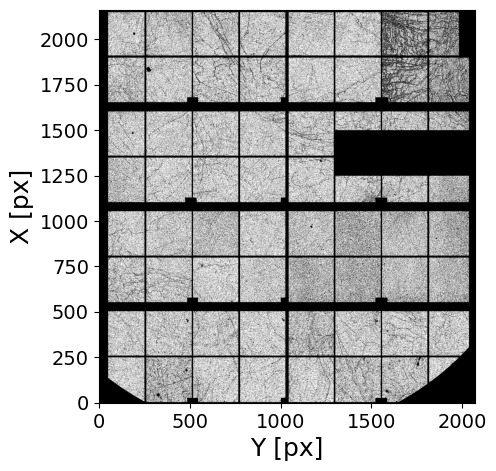

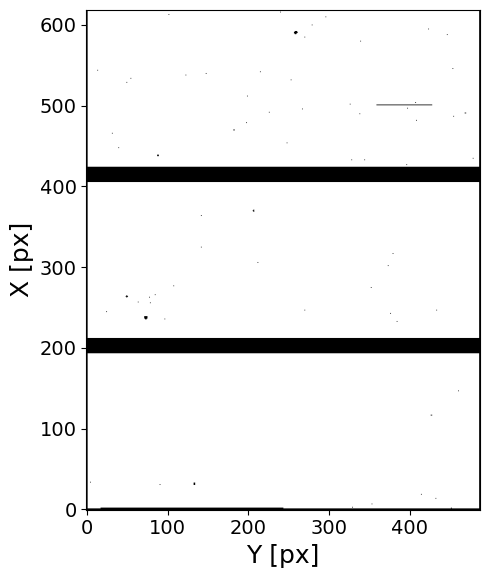

In [3]:
### e4m MASKS
e4m_htmask_GeO2_7_30C  = np.load(MASKS_folder+'e4m_htmask-GeO2_7_30C_0003_0003' +'.npy')
e4m_htmask_GeO2_7_100C = np.load(MASKS_folder+'e4m_htmask-GeO2_7_100C_0001_0003'+'.npy')
e4m_htmask_GeO2_7_170C = np.load(MASKS_folder+'e4m_htmask-GeO2_7_170C_0001_0003'+'.npy')
e4m_htmask_GeO2_7_240C = np.load(MASKS_folder+'e4m_htmask-GeO2_7_240C_0001_0003'+'.npy')
e4m_htmask = e4m_htmask_GeO2_7_30C * e4m_htmask_GeO2_7_100C * e4m_htmask_GeO2_7_170C * e4m_htmask_GeO2_7_240C

e4m_mask = np.load(MASKS_folder+'e4m_mask'+'.npy')

plt.figure(figsize=(5, 5))
plt.imshow((e4m_mask*e4m_htmask).reshape(Nx,Ny), cmap='gray', origin='lower')
plt.xlabel('Y [px]')
plt.ylabel('X [px]')
plt.tight_layout(); plt.show()

### pilatus MASKS
pilatus_mask = np.load(MASKS_folder+'pilatus300k_mask_20240201'+'.npy').astype(bool)

plt.figure(figsize=(6, 6))
plt.imshow(~pilatus_mask, cmap='gray', origin='lower')
plt.xlabel('Y [px]')
plt.ylabel('X [px]')
plt.tight_layout(); plt.show()

### Beamstop mask

In [4]:
#######################################
sample_name = 'GeO2_7_30C'
Ndataset = 3
Nscan = 3
Nfi, Nff = 0, 1000
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=1, )

#############################
command = mtimescan 0.001 1 1800288
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/1 loops)
Done! (elapsed time = 0.02 s)
Concatenating vectors ...
Done! (elapsed time = 0.0 s)
	 | Sparse array loaded from ../RAW_DATA/GeO2_7_30C/GeO2_7_30C_0003/scan0003/
	 | Shape:       (1000, 4471016)
	 | Sparsity:     1.5e-04
	 | Memory usage (scipy.csr_array): 0.007 GB (np.array usage: 16.656 GB)


################################################################################
Maximum count in the whole run -> 242.0
# of pixels above Ith_high treshold ->  610960 pixels (of 4471016 => 13.66 %)
################################################################################



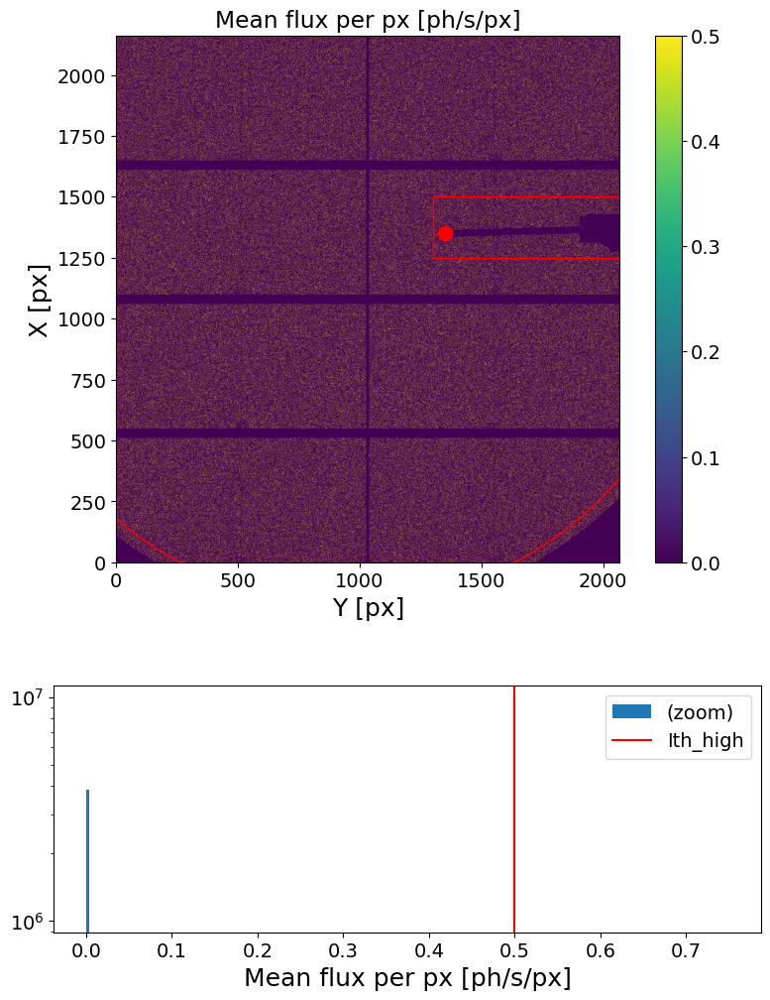

In [5]:
geom = [{'geom':'Rectangle', 'x0':1250, 'y0':1300, 'xl':250, 'yl':1950, 'inside':False},
        {'geom':'Circle', 'Cx':1300, 'Cy':950, 'r':1470, 'inside':True}, 
        ]
XPCS.gen_plots4mask(e4m_data, itime, Ith_high=.5, mask_geom=geom,)

#################################################
Masked area =  93.74594052000708 %
#################################################



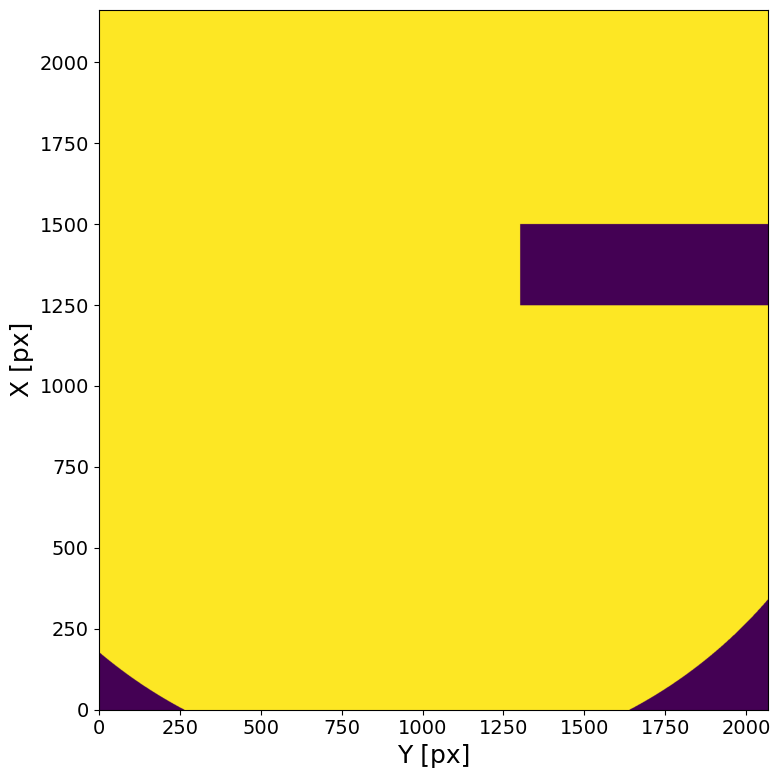

In [6]:
bs_mask = XPCS.gen_mask(mask_geom=geom)

### Q mask

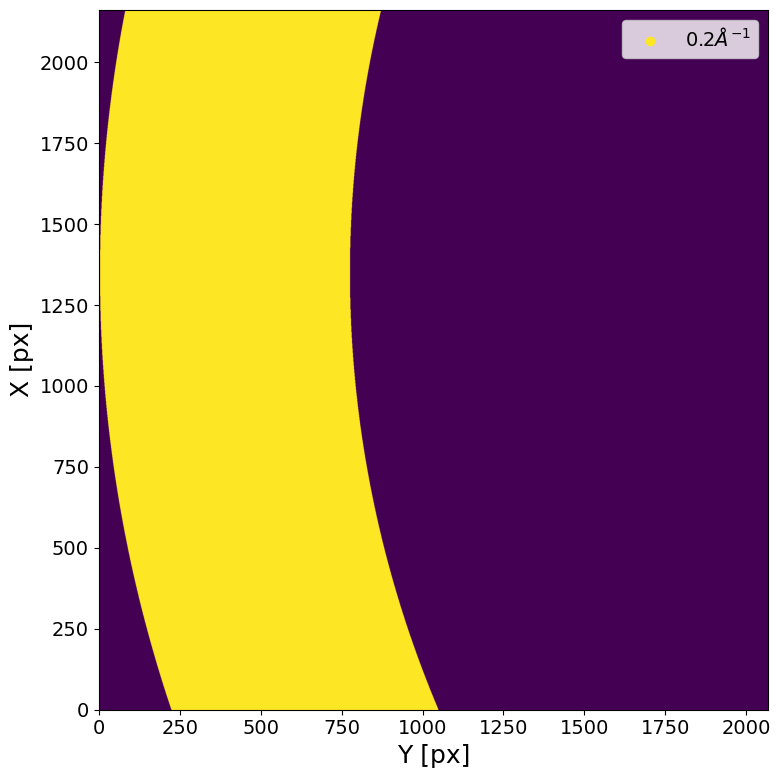

In [7]:
###################
Q_notebook = .21 # [.21, .19, .17, .15, .13]
dQ_notebook = .01 # => Q_width = 2*dQ
###################

###################
Q_notebook = .20 # [.21, .19, .17, .15, .13]
dQ_notebook = .02 # => Q_width = 2*dQ
###################

Qmask = XPCS.gen_Qmask(Ei, theta, Q_notebook, dQ_notebook, Qmap_plot=False)

### htmask killed pixels ?

In [8]:
print(f'Percentage of kept pixel by e4m_htmask_GeO2_7_30C:  {round((bs_mask*Qmask*e4m_mask*e4m_htmask_GeO2_7_30C).sum() / (bs_mask*Qmask*e4m_mask).sum()*100,2)}%')
print(f'Percentage of kept pixel by e4m_htmask_GeO2_7_100C: {round((bs_mask*Qmask*e4m_mask*e4m_htmask_GeO2_7_100C).sum() / (bs_mask*Qmask*e4m_mask).sum()*100,2)}%')
print(f'Percentage of kept pixel by e4m_htmask_GeO2_7_170C: {round((bs_mask*Qmask*e4m_mask*e4m_htmask_GeO2_7_170C).sum() / (bs_mask*Qmask*e4m_mask).sum()*100,2)}%')
print(f'Percentage of kept pixel by e4m_htmask_GeO2_7_240C: {round((bs_mask*Qmask*e4m_mask*e4m_htmask_GeO2_7_240C).sum() / (bs_mask*Qmask*e4m_mask).sum()*100,2)}%')

print(f'Percentage of kept pixel by e4m_htmask:             {round((bs_mask*Qmask*e4m_mask*e4m_htmask).sum() / (bs_mask*Qmask*e4m_mask).sum()*100,2)}%')

Percentage of kept pixel by e4m_htmask_GeO2_7_30C:  89.0%
Percentage of kept pixel by e4m_htmask_GeO2_7_100C: 91.76%
Percentage of kept pixel by e4m_htmask_GeO2_7_170C: 87.32%
Percentage of kept pixel by e4m_htmask_GeO2_7_240C: 94.62%
Percentage of kept pixel by e4m_htmask:             74.85%


## XPCS scan [short]: T=30C, Q=0.19, 5min @ 1ms (GeO2_3_alligment, dataset 1, scan 6)

In [9]:
#######################################
sample_name = 'GeO2_3_alligment'
Ndataset = 1
Nscan = 6
Nfi, Nff =  None, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=50, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=4)

#############################
command = mtimescan 0.001 1 300048
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
T = 5.50 min
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/61 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/61 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/61 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/61 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/61 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/61 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/61 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/61 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/61 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/61 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/61 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/61 loop

### Flux check

################################################################################
Maximum count in the whole run -> 4.0
################################################################################



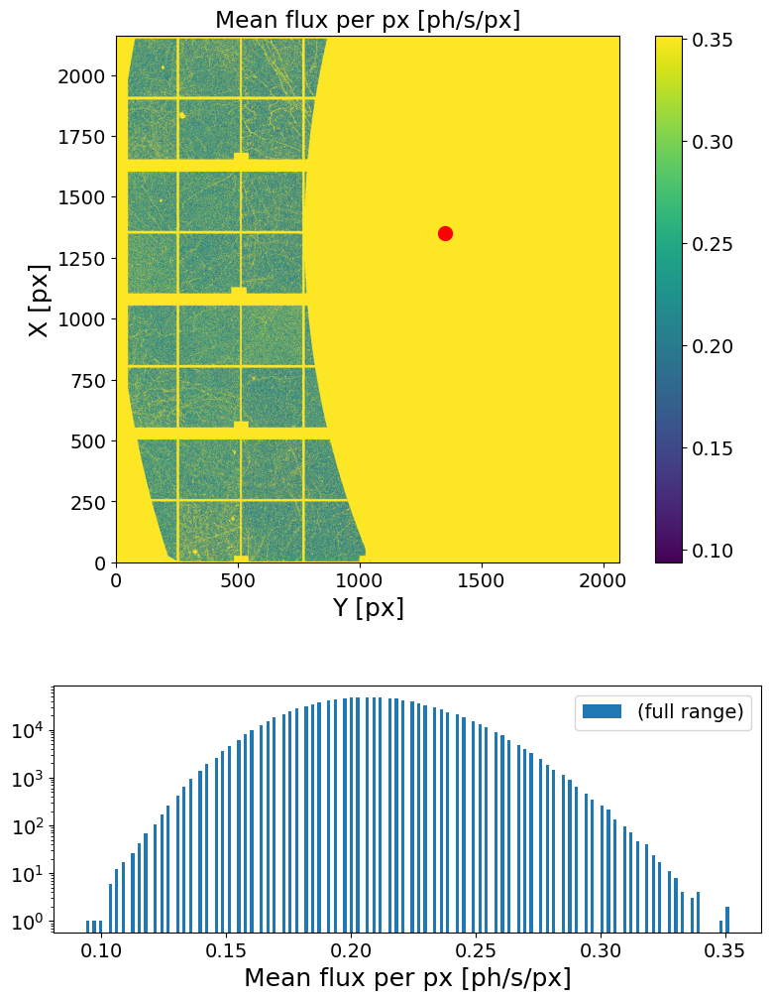

In [10]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_low=None, Ith_high=None, Nff=None, load_mask=load_mask)

### Intensity analysis

In [11]:
####################
Lbin = 100
Nstep = 100
Nfi = 25
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

It = np.vstack(XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep, Nfi=Nfi))
np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", It)

<SecondaryAxis: >

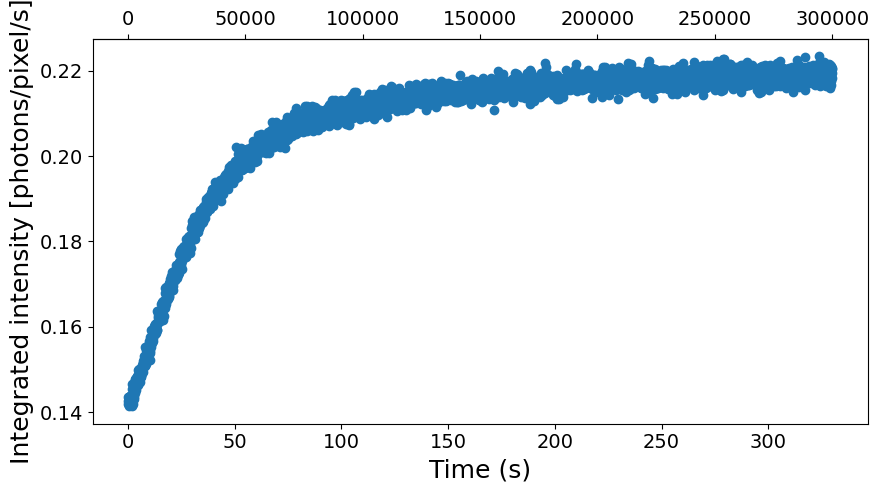

In [12]:
plt.figure(figsize=(10,5))
plt.scatter(It[0], It[1], label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

## <3 XPCS scan: T=30C, Q=0.19, 25min @ 1ms ON fp (GeO2_3, dataset 1, scan 4)

In [13]:
#######################################
sample_name = 'GeO2_3_30C'
Ndataset = 1
Nscan = 4
Nfi, Nff =  None, None #900_000
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=50, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=4)

#############################
command = mtimescan 0.001 1 1500240
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
T = 27.50 min
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h

	 -> loading file eiger4m_v2_sparse_frame_0_00207.h5 (208/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00208.h5 (209/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00209.h5 (210/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00210.h5 (211/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00211.h5 (212/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00212.h5 (213/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00213.h5 (214/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00214.h5 (215/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00215.h5 (216/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00216.h5 (217/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00217.h5 (218/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00218.h5 (219/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00219.h5 (220/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00220.h5 (221/301 loops)
	 -> loading file eiger4m_v2_spars

### Flux check

################################################################################
Maximum count in the whole run -> 4.0
################################################################################



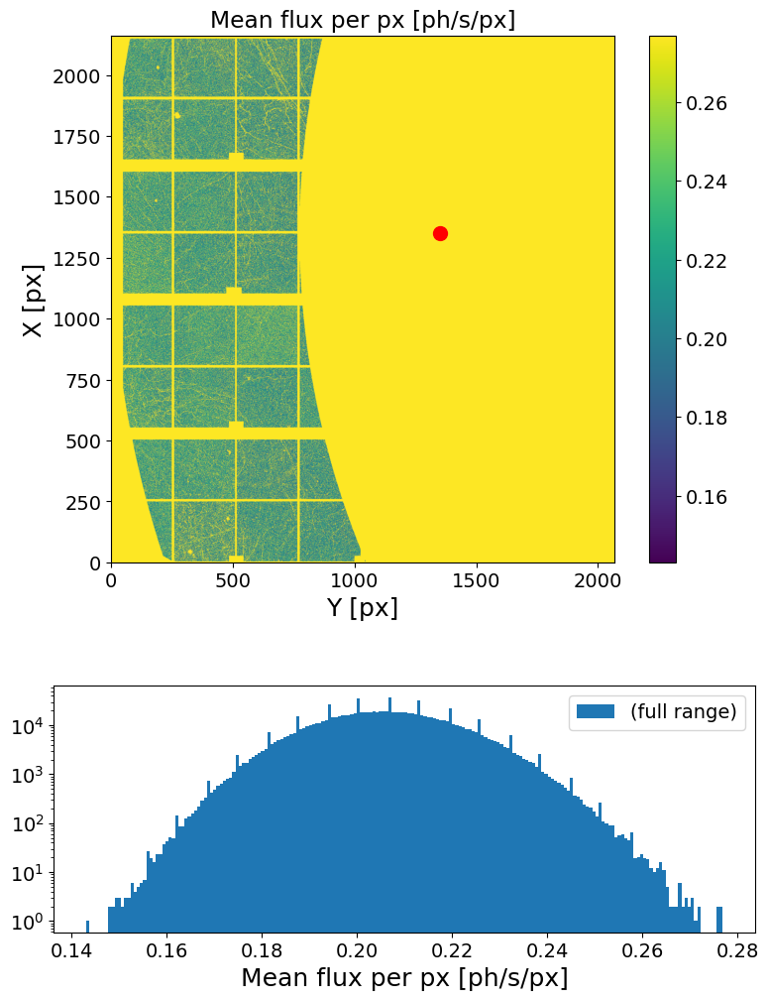

In [14]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_low=None, Ith_high=None, Nff=None, load_mask=load_mask)

### Intensity analysis

In [15]:
####################
Lbin = 100
Nstep = 100
Nfi = 25
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

It = np.vstack(XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep, Nfi=Nfi))
np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", It)

<SecondaryAxis: >

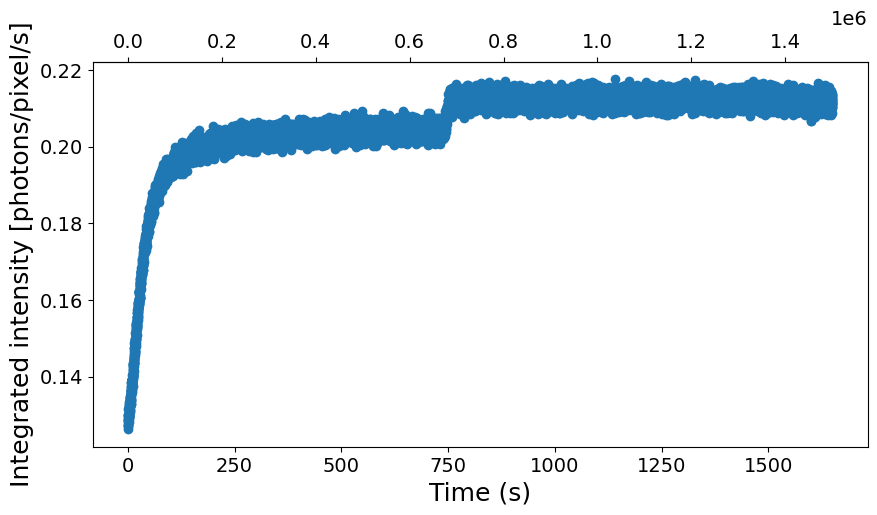

In [16]:
plt.figure(figsize=(10,5))
plt.scatter(It[0], It[1], label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Multitau correlation of damaged-vGeO2

In [17]:
##### INPUTS #####
Nfi = int(.6e6)
Nff = None
sparse_depth = 14
ch_depth = 4
mask = None
##################

G2tmt = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, ch_depth=ch_depth, mask=None, Nfi=Nfi, Nff=Nff)
g2mt= np.vstack(XPCS.get_g2mt(itime, G2tmt))
np.savetxt(f"{g24damaged_vGeO2_folder}g2mt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", g2mt)

Nff set to 1484736 => (Nff-Nfi) = 54*2^sparse_depth, thrown frames = 15504 (1.72%)
Loading frames ...
Done! (elapsed time = 2.97 s)
	 | 884736 frames X 1074960 pixels
	 | sparsity = 2.33e-04
	 | memory usage (sparse.csr_array @ float32) = 2.481 GB
Computing sparse multitau G2t...


  7%|▋         | 4/54 [00:05<01:04,  1.28s/it]

100%|██████████| 54/54 [01:10<00:00,  1.31s/it]


Done! (elapsed time = 70.65 s)
Computing dense multitau G2t...
	-> computing channels on 432 frames ...
	-> computing channels on 216 frames ...
	-> computing channels on 108 frames ...
	-> computing channels on 54 frames ...
	-> computing channels on 27 frames ...
Done! (elapsed time = 16.18 s)


(<Figure size 1000x500 with 2 Axes>,
 <Axes: xlabel='$t_w$ [s]', ylabel='$\\tau$ [s]'>)

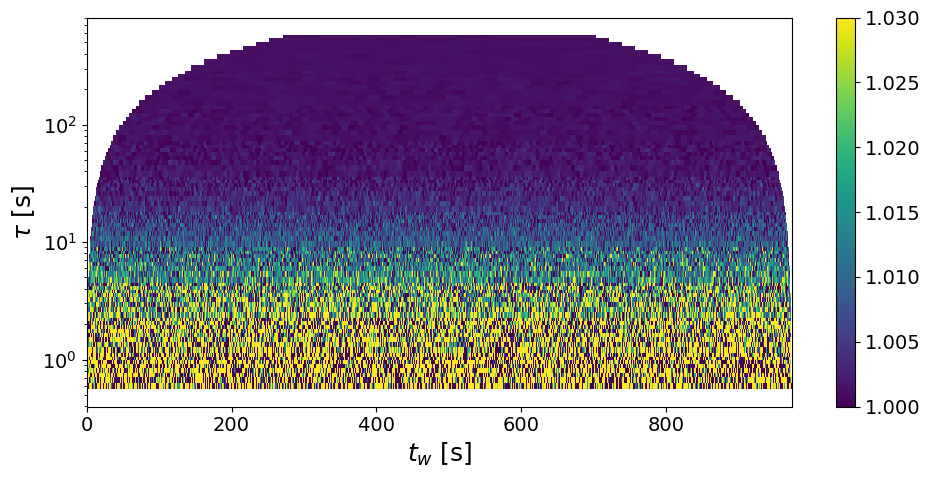

In [18]:
############################
vmin, vmax = 1.0, 1.03
lower_corr = 6
upper_corr = 16
filter_layer = 0
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log', lower_corr=lower_corr, upper_corr=upper_corr, filter_layer=filter_layer, borders=False)

/home/fabio/anaconda3/envs/XPCSenv/lib/python3.13/site-packages/uncertainties/core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")


5.581737163897605


Text(0, 0.5, 'c')

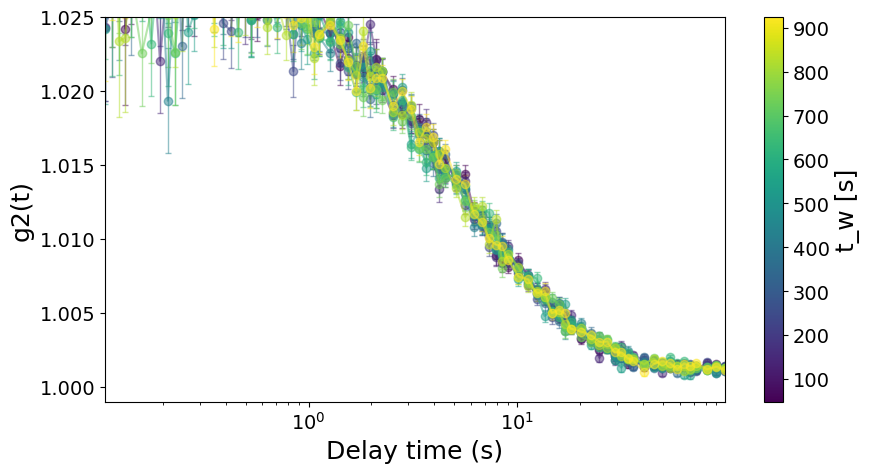

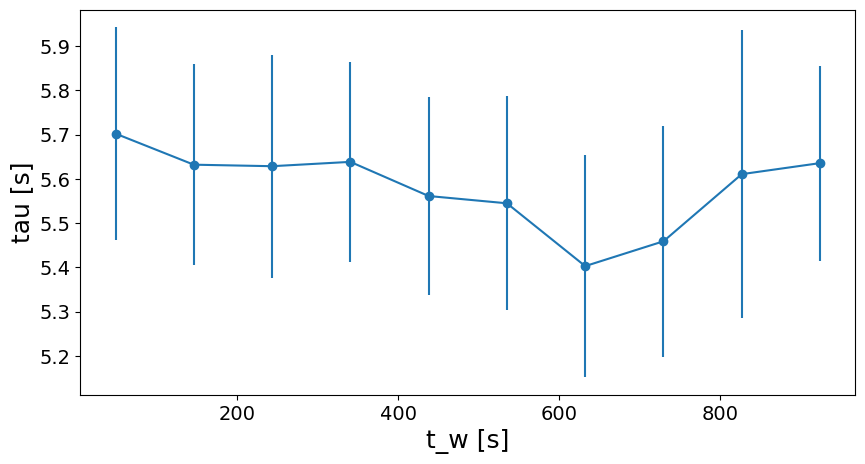

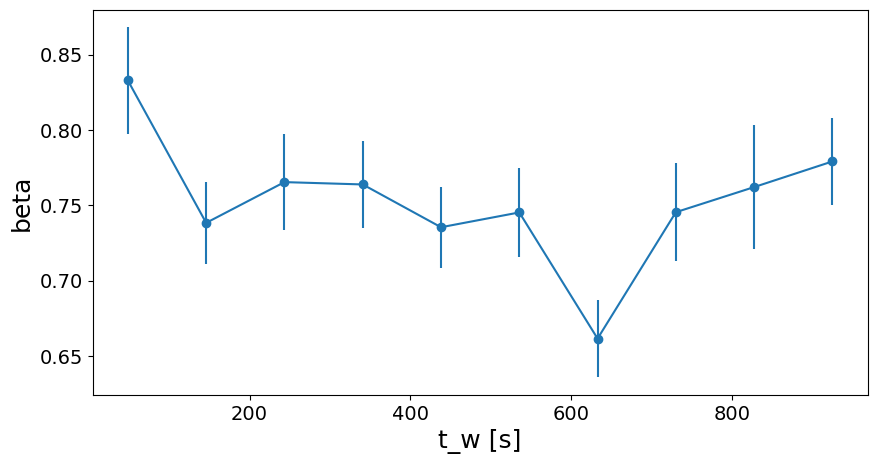

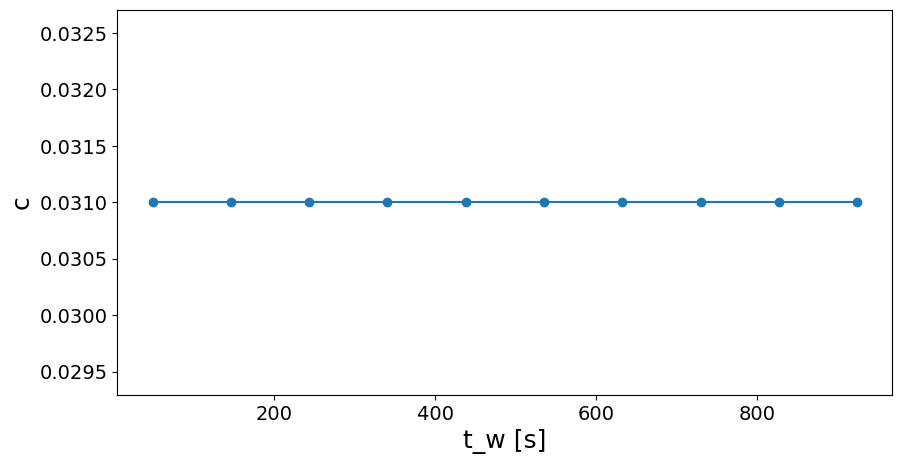

In [19]:
####################
split = 10
####################

model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.0310, min=0, max=.1, vary=False)
params.add('y0', value=1.0015, min=1, max=1.01, vary=False)

dT = G2tmt[0][1].shape[0]*itime/split
plt.figure(figsize=(10,5))
tau, dtau = {}, {}
beta, dbeta = {}, {}
c, dc = {}, {}
for i in range(split):
    t1 = i*dT
    t2 = (i+1)*dT
    t_g2mt, g2mt_cut, dg2mt_cut = XPCS.get_g2mt_cut(itime, G2tmt, t1, t2)
    mask = (t_g2mt>.1)*(t_g2mt<1e2)
    t_g2mt = t_g2mt[mask]
    g2mt_cut = g2mt_cut[mask]
    dg2mt_cut = dg2mt_cut[mask]


    cmap = plt.get_cmap('viridis')
    color = cmap(i / max(1, split - 1))
    plt.errorbar(t_g2mt, g2mt_cut, yerr=dg2mt_cut, fmt='o-', color=color, ecolor=color, elinewidth=1, capsize=2, label=f't = {t1:.0f}-{t2:.0f} s', alpha=.5)

    t = (t2+t1)/2
    result = model.fit(g2mt_cut, params, t=t_g2mt)
    tau[t] = result.params['tau'].value
    dtau[t] = result.params['tau'].stderr
    beta[t] = result.params['beta'].value
    dbeta[t] = result.params['beta'].stderr
    c[t] = result.params['c'].value
    dc[t] = result.params['c'].stderr

plt.xscale('log')

# add colorbar mapping line colors to mid waiting time t
t_mid = (np.arange(split) + 0.5) * dT
cmap = plt.get_cmap('viridis')
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable
norm = Normalize(vmin=t_mid.min(), vmax=t_mid.max())
sm = ScalarMappable(cmap=cmap, norm=norm)
sm.set_array(t_mid)
# ensure we provide an Axes for the colorbar (plt.gca() is the axes with the plotted data)
ax = plt.gca()
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('t_w [s]')

plt.xlabel('Delay time (s)')
plt.ylabel('g2(t)')
plt.ylim(.999, 1.025)
plt.xlim(t_g2mt.min(), t_g2mt.max())

plt.figure(figsize=(10,5))
plt.errorbar(list(tau.keys()), list(tau.values()), yerr=list(dtau.values()), fmt='o-')
plt.xlabel('t_w [s]')
plt.ylabel('tau [s]')
print(np.mean(list(tau.values())))

plt.figure(figsize=(10,5))
plt.errorbar(list(beta.keys()), list(beta.values()), yerr=list(dbeta.values()), fmt='o-')
plt.xlabel('t_w [s]')
plt.ylabel('beta')

plt.figure(figsize=(10,5))
plt.errorbar(list(c.keys()), list(c.values()), yerr=list(dc.values()), fmt='o-')
plt.xlabel('t_w [s]')
plt.ylabel('c')

Using Global variables: model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.2,0.02,5.690824,0.074167,1.303267,0.743996,0.007617,1.023847,0.031296,0.000244,0.778683,1.00127,0.000019,0.001854,0.839784


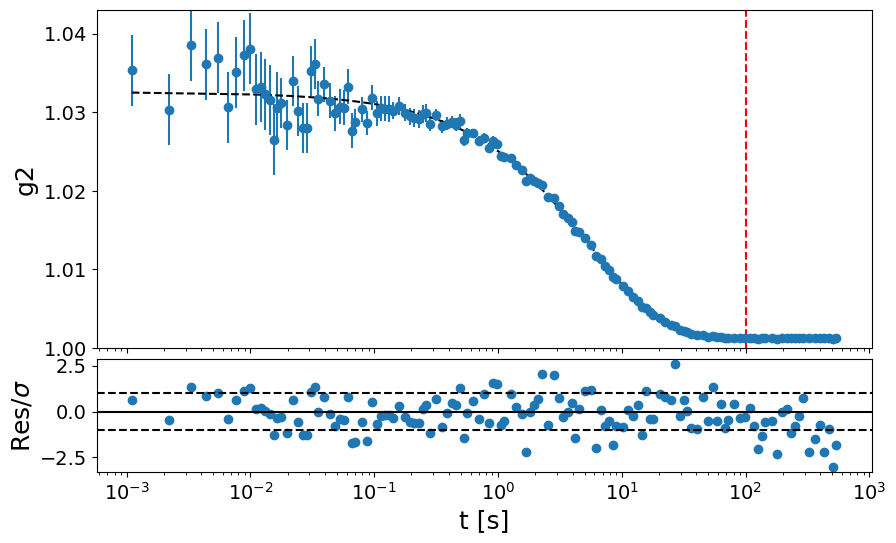

In [20]:
##################
t1_fit = 0
t2_fit = 1e2
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

fig, ax1, ax2 = MTplotfit_4damaged_vGeO2(itime, g2mt, t1_fit, t2_fit, save=True)

## <3 XPCS scan: T=100C, Q=0.19, 25min @ 1ms ON dp (GeO2_3, dataset 1, scan 4)

In [21]:
#######################################
sample_name = 'GeO2_3_100C'
Ndataset = 1
Nscan = 4
Nfi, Nff =  None, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=50, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=4)

#############################
command = mtimescan 0.001 1 1500240
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
T = 27.50 min
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h

### Flux check

################################################################################
Maximum count in the whole run -> 4.0
################################################################################



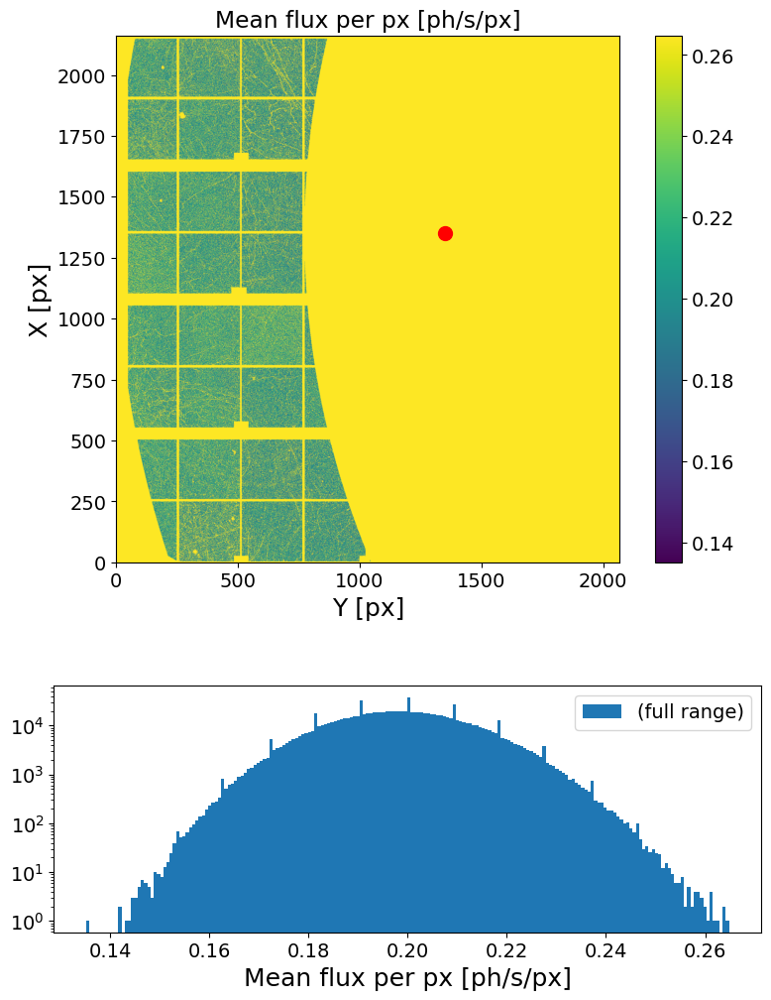

In [22]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_low=None, Ith_high=None, Nff=None, load_mask=load_mask)

### Intensity analysis

In [23]:
####################
Lbin = 100
Nstep = 100
Nfi = 25
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

It = np.vstack(XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep, Nfi=Nfi))
np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", It)

<SecondaryAxis: >

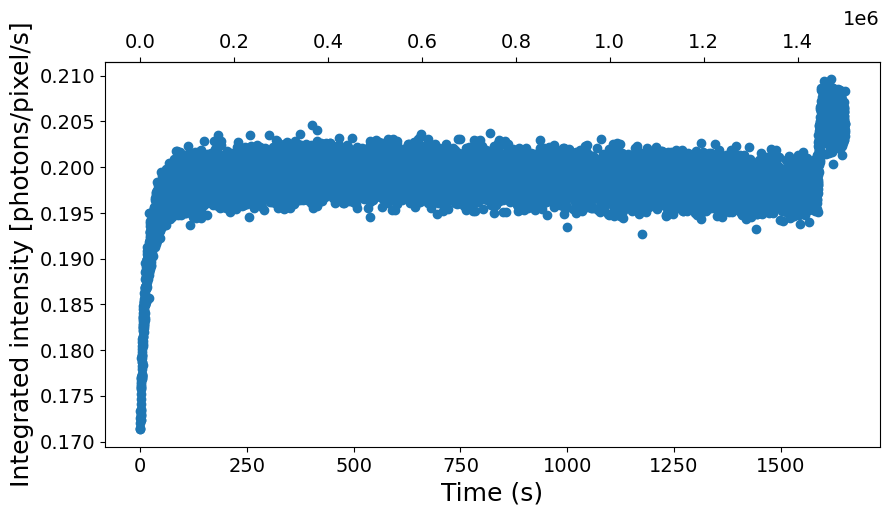

In [24]:
plt.figure(figsize=(10,5))
plt.scatter(It[0], It[1], label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Multitau correlation of damaged-vGeO2

In [25]:
##### INPUTS #####
Nfi = int(.4e6)
Nff = None
sparse_depth = 14
ch_depth = 4
mask = None
##################

G2tmt = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, ch_depth=ch_depth, mask=None, Nfi=Nfi, Nff=Nff)
g2mt= np.vstack(XPCS.get_g2mt(itime, G2tmt))
np.savetxt(f"{g24damaged_vGeO2_folder}g2mt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", g2mt)

Nff set to 1497728 => (Nff-Nfi) = 67*2^sparse_depth, thrown frames = 2512 (0.23%)
Loading frames ...
Done! (elapsed time = 3.74 s)
	 | 1097728 frames X 1074960 pixels
	 | sparsity = 2.19e-04
	 | memory usage (sparse.csr_array @ float32) = 2.895 GB
Computing sparse multitau G2t...


 12%|█▏        | 8/67 [00:13<01:40,  1.70s/it]

100%|██████████| 67/67 [01:51<00:00,  1.66s/it]


Done! (elapsed time = 111.23 s)
Computing dense multitau G2t...
	-> computing channels on 536 frames ...
	-> computing channels on 268 frames ...
	-> computing channels on 134 frames ...
	-> computing channels on 67 frames ...
	-> computing channels on 33 frames ...
Done! (elapsed time = 19.31 s)


(<Figure size 1000x500 with 2 Axes>,
 <Axes: xlabel='$t_w$ [s]', ylabel='$\\tau$ [s]'>)

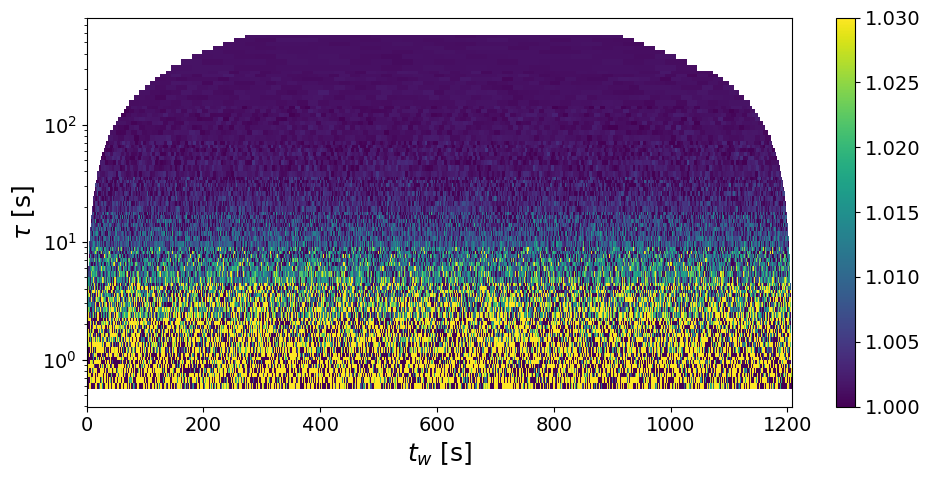

In [26]:
############################
vmin, vmax = 1.0, 1.03
lower_corr = 6
upper_corr = 16
filter_layer = 0
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log', lower_corr=lower_corr, upper_corr=upper_corr, filter_layer=filter_layer, borders=False)

/home/fabio/anaconda3/envs/XPCSenv/lib/python3.13/site-packages/uncertainties/core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")


5.20725253291434


Text(0, 0.5, 'c')

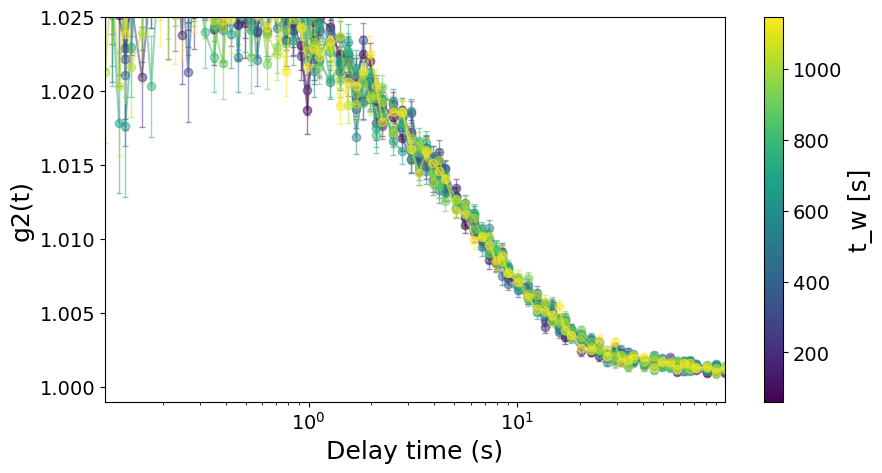

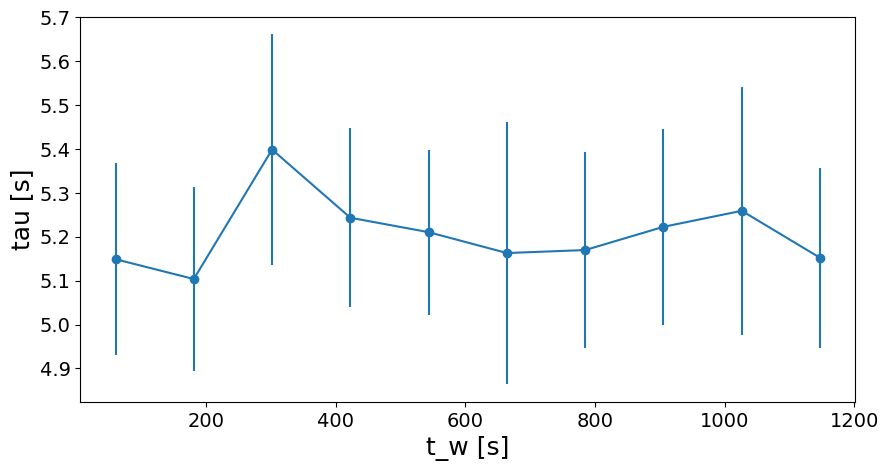

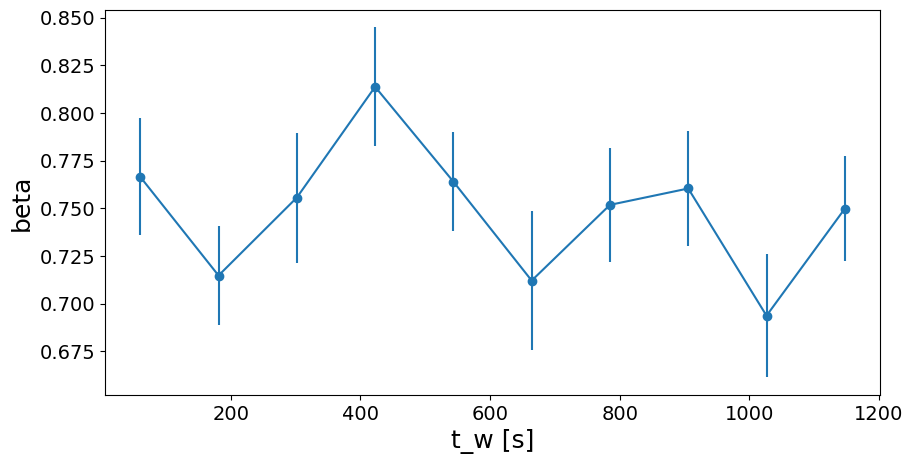

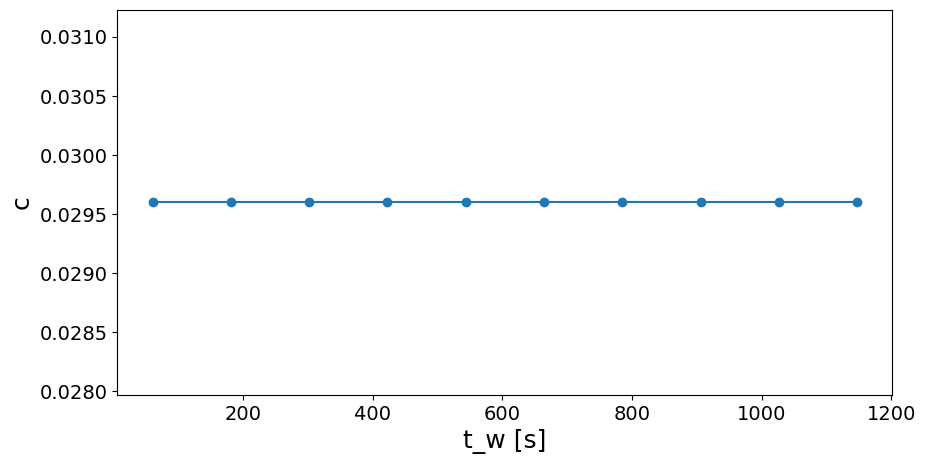

In [27]:
####################
split = 10
####################

model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.0296, min=0, max=.1, vary=False)
params.add('y0', value=1.0015, min=1, max=1.01, vary=False)

dT = G2tmt[0][1].shape[0]*itime/split
plt.figure(figsize=(10,5))
tau, dtau = {}, {}
beta, dbeta = {}, {}
c, dc = {}, {}
for i in range(split):
    t1 = i*dT
    t2 = (i+1)*dT
    t_g2mt, g2mt_cut, dg2mt_cut = XPCS.get_g2mt_cut(itime, G2tmt, t1, t2)
    mask = (t_g2mt>.1)*(t_g2mt<1e2)
    t_g2mt = t_g2mt[mask]
    g2mt_cut = g2mt_cut[mask]
    dg2mt_cut = dg2mt_cut[mask]


    cmap = plt.get_cmap('viridis')
    color = cmap(i / max(1, split - 1))
    plt.errorbar(t_g2mt, g2mt_cut, yerr=dg2mt_cut, fmt='o-', color=color, ecolor=color, elinewidth=1, capsize=2, label=f't = {t1:.0f}-{t2:.0f} s', alpha=.5)

    t = (t2+t1)/2
    result = model.fit(g2mt_cut, params, t=t_g2mt)
    tau[t] = result.params['tau'].value
    dtau[t] = result.params['tau'].stderr
    beta[t] = result.params['beta'].value
    dbeta[t] = result.params['beta'].stderr
    c[t] = result.params['c'].value
    dc[t] = result.params['c'].stderr

plt.xscale('log')

# add colorbar mapping line colors to mid waiting time t
t_mid = (np.arange(split) + 0.5) * dT
cmap = plt.get_cmap('viridis')
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable
norm = Normalize(vmin=t_mid.min(), vmax=t_mid.max())
sm = ScalarMappable(cmap=cmap, norm=norm)
sm.set_array(t_mid)
# ensure we provide an Axes for the colorbar (plt.gca() is the axes with the plotted data)
ax = plt.gca()
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('t_w [s]')

plt.xlabel('Delay time (s)')
plt.ylabel('g2(t)')
plt.ylim(.999, 1.025)
plt.xlim(t_g2mt.min(), t_g2mt.max())

plt.figure(figsize=(10,5))
plt.errorbar(list(tau.keys()), list(tau.values()), yerr=list(dtau.values()), fmt='o-')
plt.xlabel('t_w [s]')
plt.ylabel('tau [s]')
print(np.mean(list(tau.values())))

plt.figure(figsize=(10,5))
plt.errorbar(list(beta.keys()), list(beta.values()), yerr=list(dbeta.values()), fmt='o-')
plt.xlabel('t_w [s]')
plt.ylabel('beta')

plt.figure(figsize=(10,5))
plt.errorbar(list(c.keys()), list(c.values()), yerr=list(dc.values()), fmt='o-')
plt.xlabel('t_w [s]')
plt.ylabel('c')

Using Global variables: model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.2,0.02,5.309984,0.092879,1.749133,0.759937,0.010686,1.406146,0.029601,0.000312,1.054215,1.001363,0.000023,0.002306,1.475559


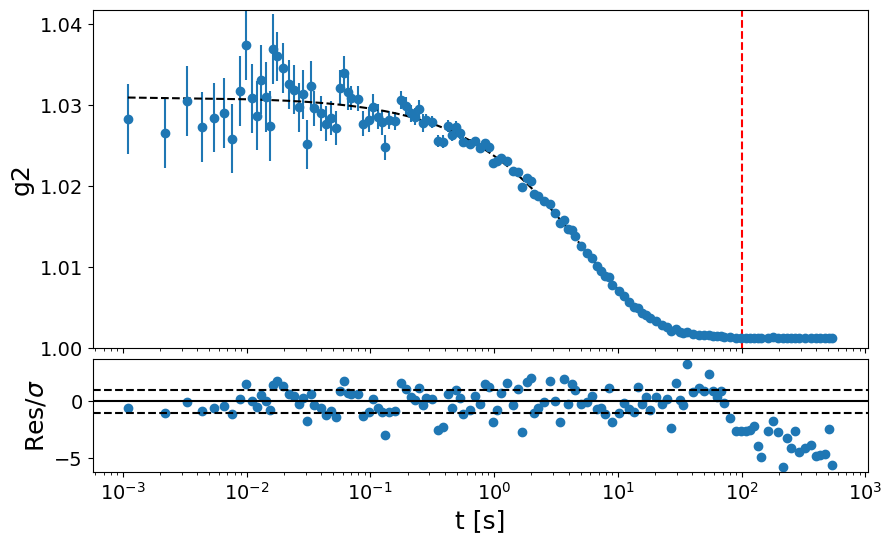

In [28]:
##################
t1_fit = 0
t2_fit = 1e2
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

fig, ax1, ax2 = MTplotfit_4damaged_vGeO2(itime, g2mt, t1_fit, t2_fit, save=True)

## XPCS scan: T=170C, Q=0.19, 25min @ 1ms ON dp (GeO2_3_170C, dataset 1, scan 4)

In [29]:
#######################################
sample_name = 'GeO2_3_170C'
Ndataset = 1
Nscan = 4
Nfi, Nff =  None, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=50, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=4)

#############################
command = mtimescan 0.001 1 1500240
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
T = 27.50 min
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h

### Flux check

################################################################################
Maximum count in the whole run -> 4.0
################################################################################



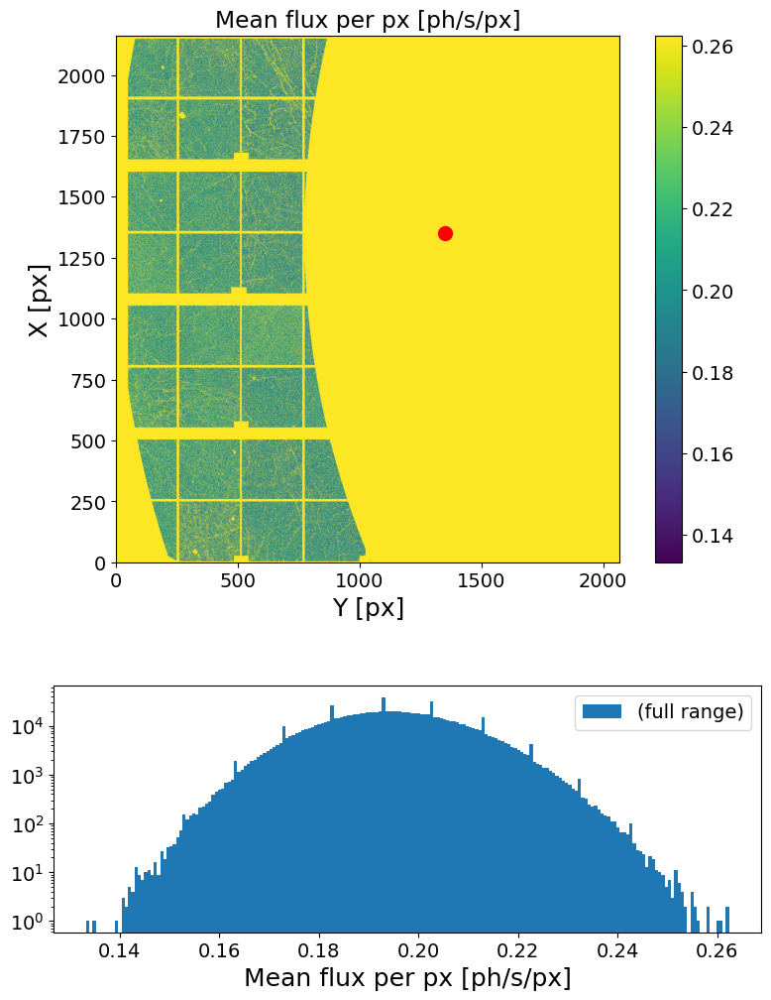

In [30]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_low=None, Ith_high=None, Nff=None, load_mask=load_mask)

### Intensity analysis

In [31]:
####################
Lbin = 100
Nstep = 100
Nfi = 25
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

It = np.vstack(XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep, Nfi=Nfi))
np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", It)

<SecondaryAxis: >

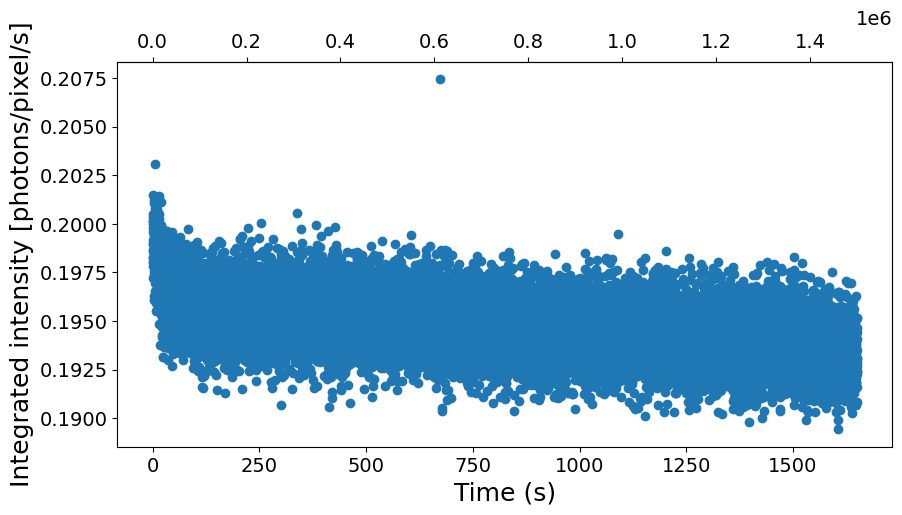

In [32]:
plt.figure(figsize=(10,5))
plt.scatter(It[0], It[1], label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Multitau correlation of damaged-vGeO2

In [33]:
##### INPUTS #####
Nfi = int(.2e6)
Nff = None
sparse_depth = 14
ch_depth = 4
mask = None
##################

G2tmt = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, ch_depth=ch_depth, mask=None, Nfi=Nfi, Nff=Nff)
g2mt= np.vstack(XPCS.get_g2mt(itime, G2tmt))
np.savetxt(f"{g24damaged_vGeO2_folder}g2mt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", g2mt)

Nff set to 1494336 => (Nff-Nfi) = 79*2^sparse_depth, thrown frames = 5904 (0.45%)
Loading frames ...
Done! (elapsed time = 3.18 s)
	 | 1294336 frames X 1074960 pixels
	 | sparsity = 2.14e-04
	 | memory usage (sparse.csr_array @ float32) = 3.338 GB
Computing sparse multitau G2t...


  1%|▏         | 1/79 [00:00<01:08,  1.13it/s]

100%|██████████| 79/79 [01:18<00:00,  1.00it/s]


Done! (elapsed time = 78.71 s)
Computing dense multitau G2t...
	-> computing channels on 632 frames ...
	-> computing channels on 316 frames ...
	-> computing channels on 158 frames ...
	-> computing channels on 79 frames ...
	-> computing channels on 39 frames ...
	-> computing channels on 19 frames ...
Done! (elapsed time = 18.4 s)


(<Figure size 1000x500 with 2 Axes>,
 <Axes: xlabel='$t_w$ [s]', ylabel='$\\tau$ [s]'>)

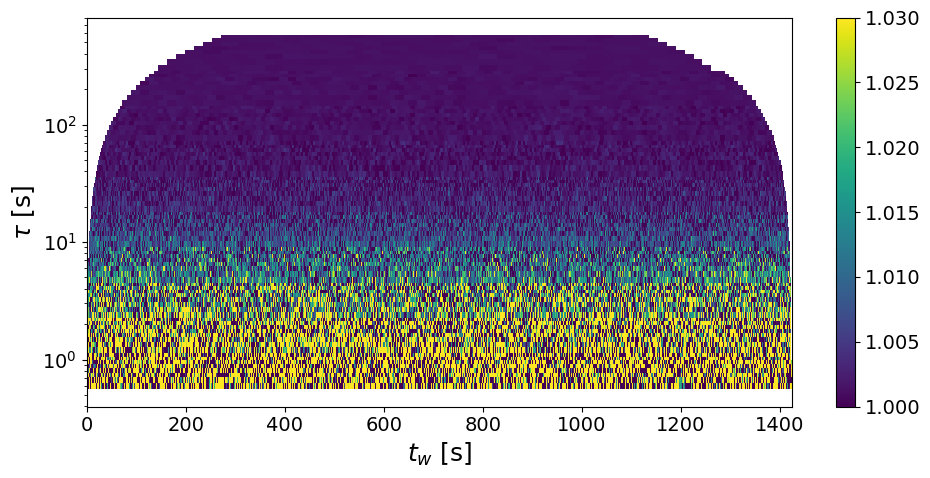

In [34]:
############################
vmin, vmax = 1.0, 1.03
lower_corr = 6
upper_corr = 16
filter_layer = 0
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log', lower_corr=lower_corr, upper_corr=upper_corr, filter_layer=filter_layer, borders=False)

Using Global variables: model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.2,0.02,4.626519,0.070181,1.516924,0.733899,0.008439,1.149887,0.02933,0.000261,0.889196,1.001355,0.000018,0.001767,0.969389


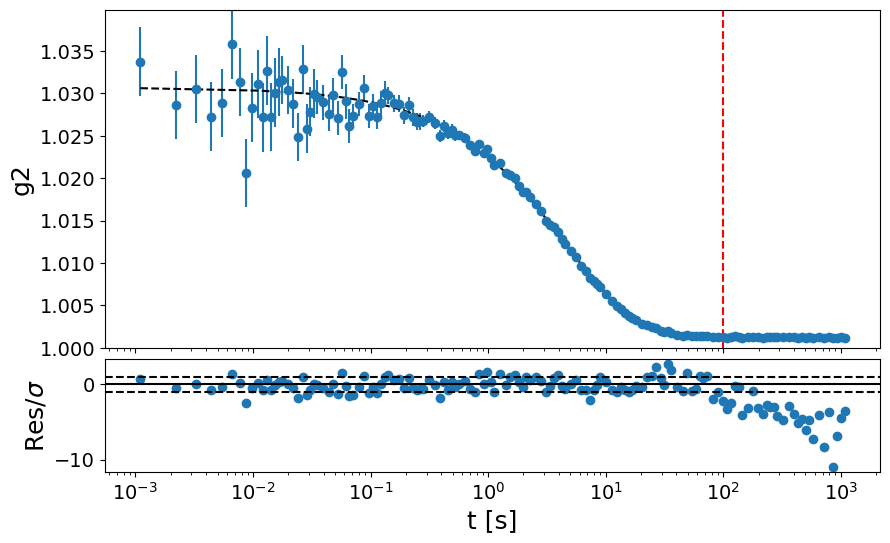

In [35]:
##################
t1_fit = 0
t2_fit = 1e2
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

fig, ax1, ax2 = MTplotfit_4damaged_vGeO2(itime, g2mt, t1_fit, t2_fit, save=True)

## XPCS scan: T=240C, Q=0.19, 25min @ 1ms ON dp (GeO2_3_240C, dataset 1, scan 4)

In [36]:
#######################################
sample_name = 'GeO2_3_240C'
Ndataset = 1
Nscan = 4
Nfi, Nff =  None, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=50, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=4)

#############################
command = mtimescan 0.001 1 1500240
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
T = 27.50 min
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h

### Flux check

################################################################################
Maximum count in the whole run -> 4.0
################################################################################



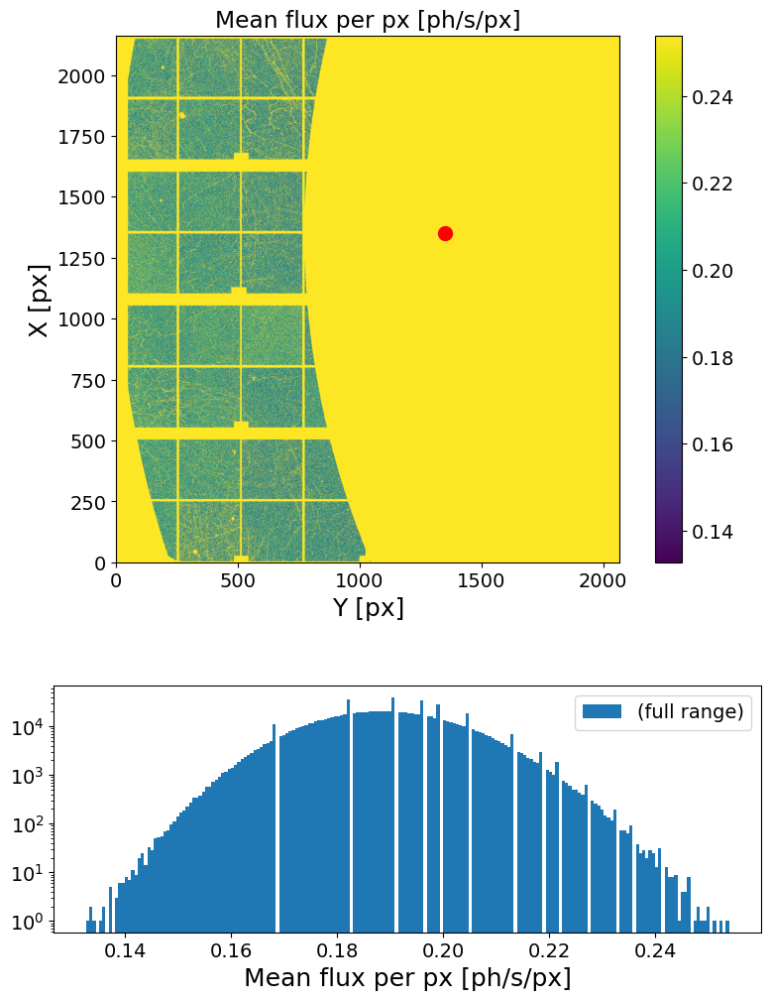

In [37]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_low=None, Ith_high=None, Nff=None, load_mask=load_mask)

### Intensity analysis

In [38]:
####################
Lbin = 100
Nstep = 100
Nfi = 25
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

It = np.vstack(XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep, Nfi=Nfi))
np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", It)

<SecondaryAxis: >

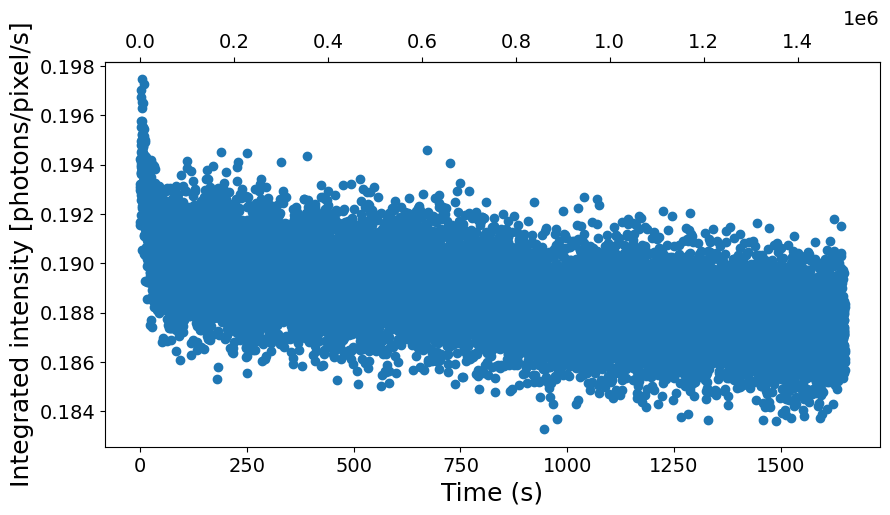

In [39]:
plt.figure(figsize=(10,5))
plt.scatter(It[0], It[1], label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Multitau correlation of damaged-vGeO2

In [40]:
##### INPUTS #####
Nfi = int(.2e6)
Nff = None
sparse_depth = 14
ch_depth = 4
mask = None
##################

G2tmt = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, ch_depth=ch_depth, mask=None, Nfi=Nfi, Nff=Nff)
g2mt= np.vstack(XPCS.get_g2mt(itime, G2tmt))
np.savetxt(f"{g24damaged_vGeO2_folder}g2mt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", g2mt)

Nff set to 1494336 => (Nff-Nfi) = 79*2^sparse_depth, thrown frames = 5904 (0.45%)
Loading frames ...


Done! (elapsed time = 3.14 s)
	 | 1294336 frames X 1074960 pixels
	 | sparsity = 2.07e-04
	 | memory usage (sparse.csr_array @ float32) = 3.234 GB
Computing sparse multitau G2t...


100%|██████████| 79/79 [02:01<00:00,  1.53s/it]


Done! (elapsed time = 121.13 s)
Computing dense multitau G2t...
	-> computing channels on 632 frames ...
	-> computing channels on 316 frames ...
	-> computing channels on 158 frames ...
	-> computing channels on 79 frames ...
	-> computing channels on 39 frames ...
	-> computing channels on 19 frames ...
Done! (elapsed time = 22.12 s)


(<Figure size 1000x500 with 2 Axes>,
 <Axes: xlabel='$t_w$ [s]', ylabel='$\\tau$ [s]'>)

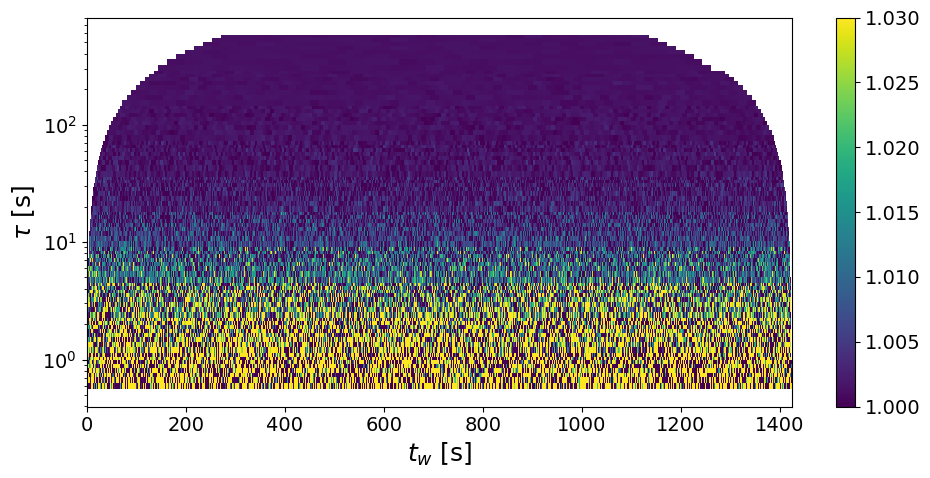

In [41]:
############################
vmin, vmax = 1.0, 1.03
lower_corr = 6
upper_corr = 16
filter_layer = 0
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log', lower_corr=lower_corr, upper_corr=upper_corr, filter_layer=filter_layer, borders=False)

Using Global variables: model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.2,0.02,4.063624,0.078175,1.923777,0.745756,0.010966,1.470425,0.028221,0.000319,1.131091,1.001372,0.00002,0.001958,1.25019


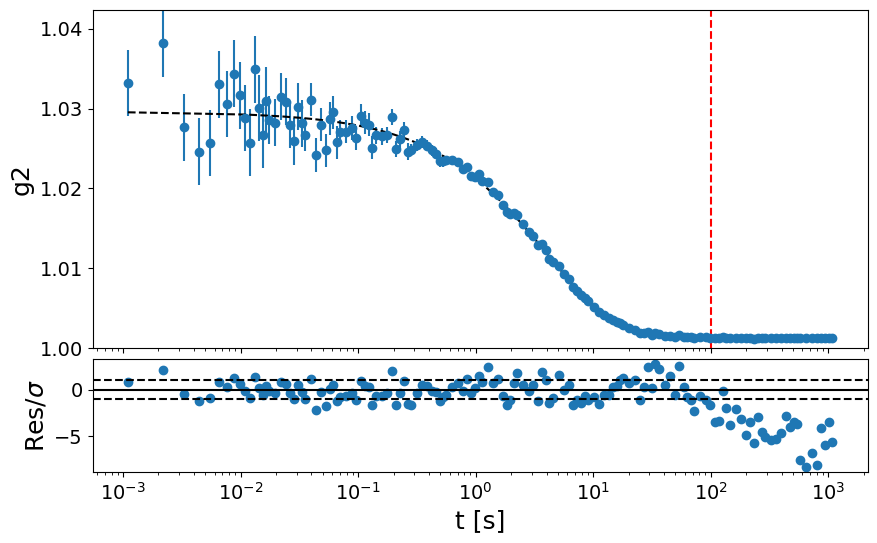

In [42]:
##################
t1_fit = 0
t2_fit = 1e2
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

fig, ax1, ax2 = MTplotfit_4damaged_vGeO2(itime, g2mt, t1_fit, t2_fit, save=True)

## XPCS scan: T=310C, Q=0.19, 25min @ 1ms ON dp (GeO2_3_310C, dataset 1, scan 4)

In [43]:
#######################################
sample_name = 'GeO2_3_310C'
Ndataset = 1
Nscan = 4
Nfi, Nff =  None, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=50, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=4)

#############################
command = mtimescan 0.001 1 1500240
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
T = 27.50 min
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h

	 -> loading file eiger4m_v2_sparse_frame_0_00201.h5 (202/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00202.h5 (203/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00203.h5 (204/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00204.h5 (205/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00205.h5 (206/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00206.h5 (207/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00207.h5 (208/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00208.h5 (209/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00209.h5 (210/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00210.h5 (211/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00211.h5 (212/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00212.h5 (213/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00213.h5 (214/301 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00214.h5 (215/301 loops)
	 -> loading file eiger4m_v2_spars

### Flux check

################################################################################
Maximum count in the whole run -> 4.0
################################################################################



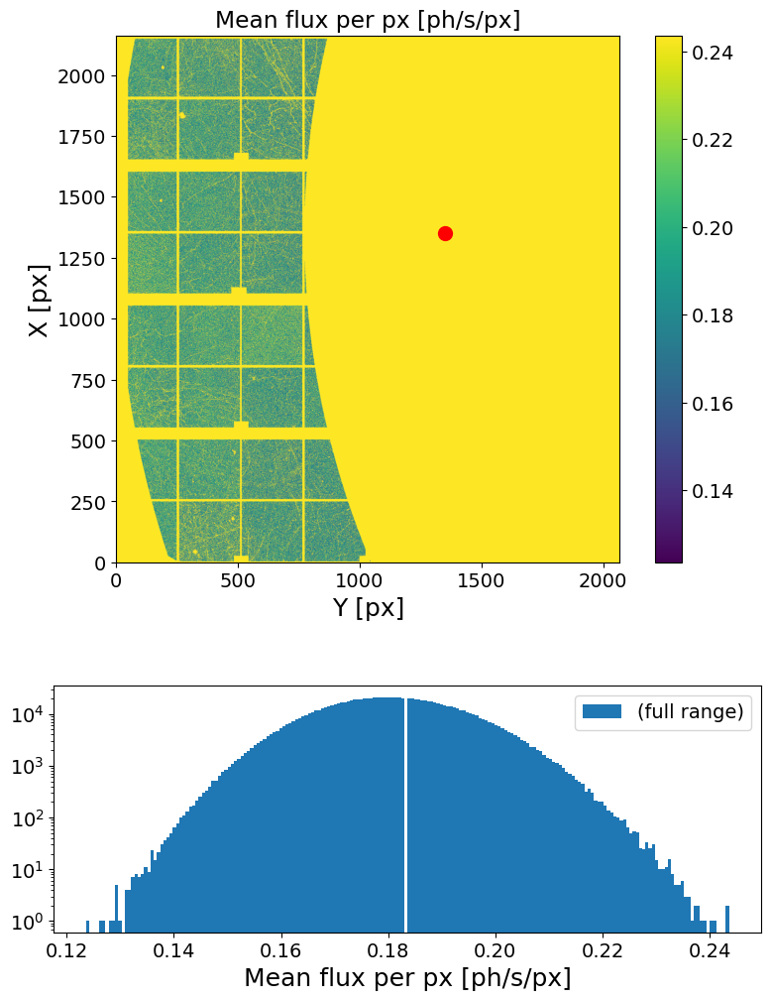

In [44]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_low=None, Ith_high=None, Nff=None, load_mask=load_mask)

### Intensity analysis

In [45]:
####################
Lbin = 100
Nstep = 100
Nfi = 25
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

It = np.vstack(XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep, Nfi=Nfi))
np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", It)

<SecondaryAxis: >

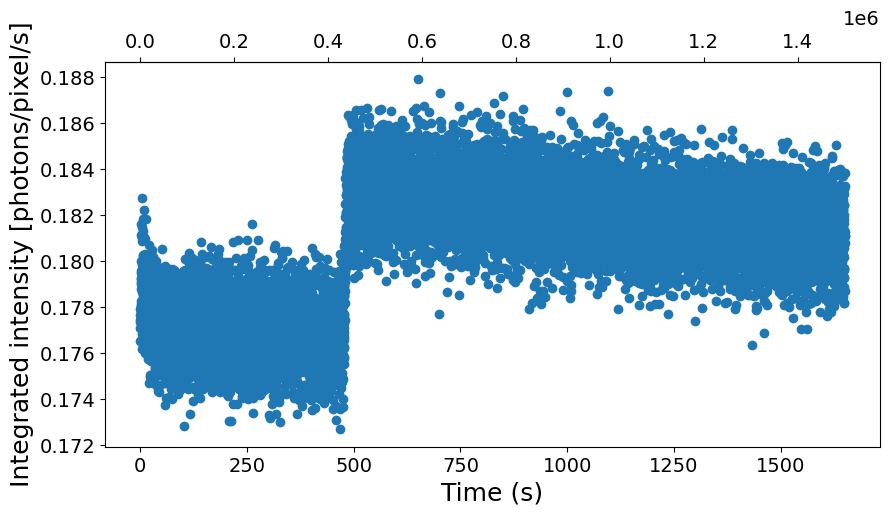

In [46]:
plt.figure(figsize=(10,5))
plt.scatter(It[0], It[1], label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Multitau correlation of damaged-vGeO2

In [47]:
##### INPUTS #####
Nfi = int(.2e6)
Nff = None
sparse_depth = 14
ch_depth = 4
mask = None
##################

G2tmt = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, ch_depth=ch_depth, mask=None, Nfi=Nfi, Nff=Nff)
g2mt= np.vstack(XPCS.get_g2mt(itime, G2tmt))
np.savetxt(f"{g24damaged_vGeO2_folder}g2mt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", g2mt)

Nff set to 1494336 => (Nff-Nfi) = 79*2^sparse_depth, thrown frames = 5904 (0.45%)
Loading frames ...
Done! (elapsed time = 2.99 s)
	 | 1294336 frames X 1074960 pixels
	 | sparsity = 1.99e-04
	 | memory usage (sparse.csr_array @ float32) = 3.108 GB
Computing sparse multitau G2t...


 11%|█▏        | 9/79 [00:10<01:20,  1.15s/it]

100%|██████████| 79/79 [01:35<00:00,  1.21s/it]


Done! (elapsed time = 95.67 s)
Computing dense multitau G2t...
	-> computing channels on 632 frames ...
	-> computing channels on 316 frames ...
	-> computing channels on 158 frames ...
	-> computing channels on 79 frames ...
	-> computing channels on 39 frames ...
	-> computing channels on 19 frames ...
Done! (elapsed time = 20.21 s)


(<Figure size 1000x500 with 2 Axes>,
 <Axes: xlabel='$t_w$ [s]', ylabel='$\\tau$ [s]'>)

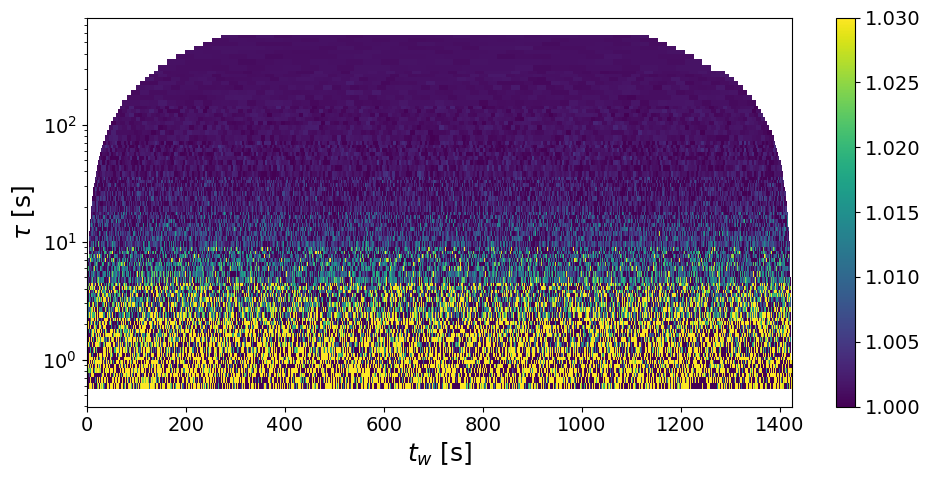

In [48]:
############################
vmin, vmax = 1.0, 1.03
lower_corr = 6
upper_corr = 16
filter_layer = 0
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log', lower_corr=lower_corr, upper_corr=upper_corr, filter_layer=filter_layer, borders=False)

Using Global variables: model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.2,0.02,3.573861,0.071871,2.011009,0.750602,0.011421,1.521639,0.027439,0.000323,1.177442,1.00133,0.000018,0.00179,1.068192


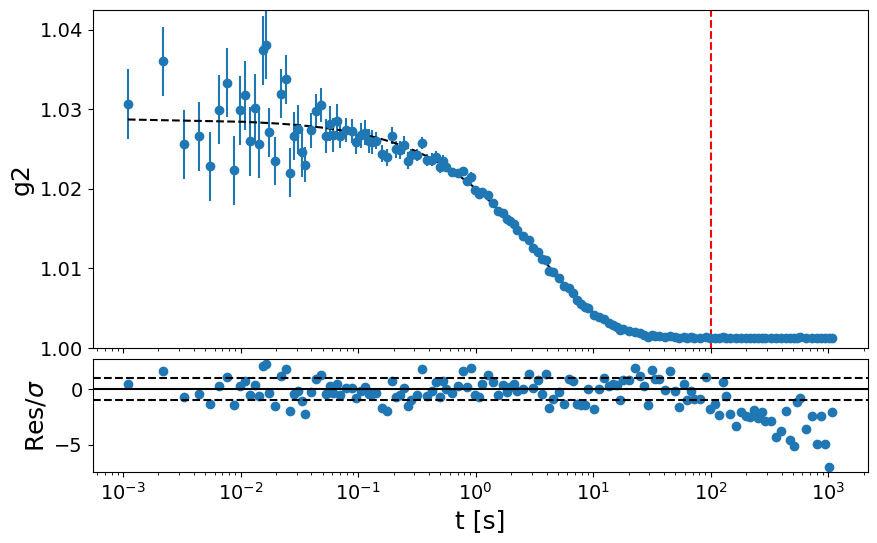

In [49]:
##################
t1_fit = 0
t2_fit = 1e2
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

fig, ax1, ax2 = MTplotfit_4damaged_vGeO2(itime, g2mt, t1_fit, t2_fit, save=True)

## XPCS scan: T=380C, Q=0.19, 50min @ 1ms ON dp (GeO2_3_380C, dataset 1, scan 4)

In [50]:
#######################################
sample_name = 'GeO2_3_380C'
Ndataset = 1
Nscan = 4
Nfi, Nff =  None, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=50, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=4)

#############################
command = mtimescan 0.001 1 2999568
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
T = 54.99 min
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h

	 -> loading file eiger4m_v2_sparse_frame_0_00050.h5 (51/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00051.h5 (52/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00052.h5 (53/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00053.h5 (54/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00054.h5 (55/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00055.h5 (56/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00056.h5 (57/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00057.h5 (58/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00058.h5 (59/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00059.h5 (60/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00060.h5 (61/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00061.h5 (62/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00062.h5 (63/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00063.h5 (64/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_0006

### Flux check

################################################################################


Maximum count in the whole run -> 4.0
################################################################################



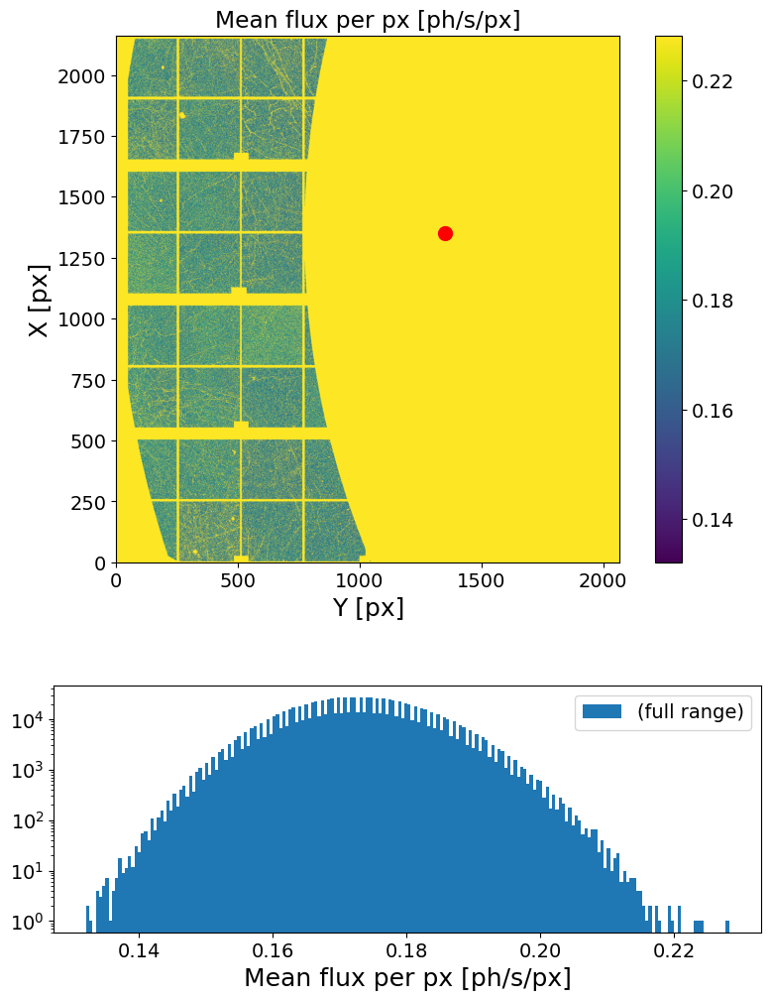

In [51]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_low=None, Ith_high=None, Nff=None, load_mask=load_mask)

### Intensity analysis

In [52]:
####################
Lbin = 100
Nstep = 100
Nfi = 25
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

It = np.vstack(XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep, Nfi=Nfi))
np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", It)

<SecondaryAxis: >

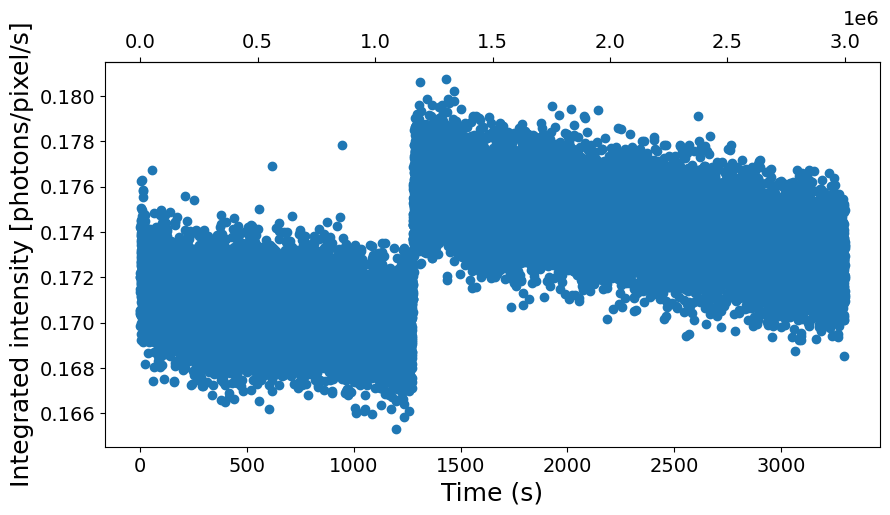

In [53]:
plt.figure(figsize=(10,5))
plt.scatter(It[0], It[1], label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Multitau correlation of damaged-vGeO2

In [54]:
##### INPUTS #####
Nfi = int(.2e6)
Nff = None
sparse_depth = 14
ch_depth = 4
mask = None
##################

G2tmt = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, ch_depth=ch_depth, mask=None, Nfi=Nfi, Nff=Nff)
g2mt= np.vstack(XPCS.get_g2mt(itime, G2tmt))
np.savetxt(f"{g24damaged_vGeO2_folder}g2mt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", g2mt)

Nff set to 2985280 => (Nff-Nfi) = 170*2^sparse_depth, thrown frames = 14288 (0.51%)
Loading frames ...


Done! (elapsed time = 8.75 s)
	 | 2785280 frames X 1074960 pixels
	 | sparsity = 1.90e-04
	 | memory usage (sparse.csr_array @ float32) = 6.391 GB
Computing sparse multitau G2t...


100%|██████████| 170/170 [05:12<00:00,  1.84s/it]


Done! (elapsed time = 312.59 s)
Computing dense multitau G2t...
	-> computing channels on 1360 frames ...
	-> computing channels on 680 frames ...
	-> computing channels on 340 frames ...
	-> computing channels on 170 frames ...
	-> computing channels on 85 frames ...
	-> computing channels on 42 frames ...
	-> computing channels on 21 frames ...
Done! (elapsed time = 55.0 s)


(<Figure size 1000x500 with 2 Axes>,
 <Axes: xlabel='$t_w$ [s]', ylabel='$\\tau$ [s]'>)

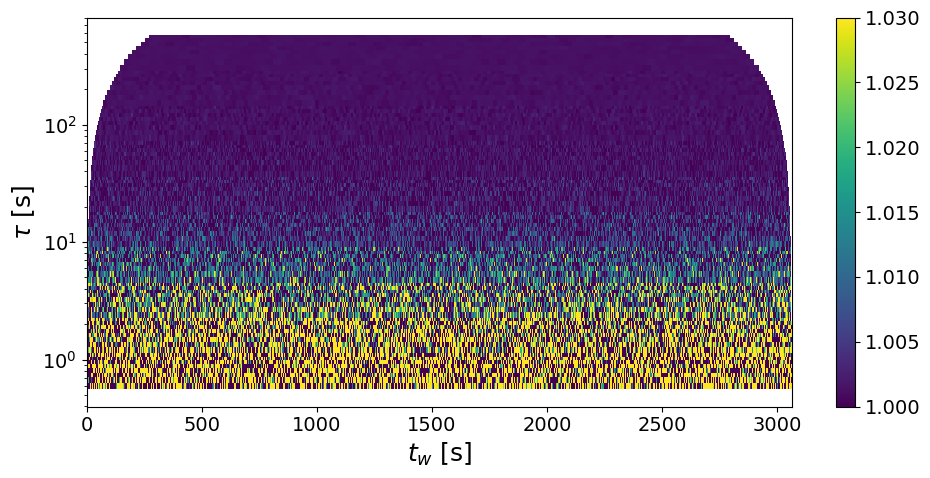

In [55]:
############################
vmin, vmax = 1.0, 1.03
lower_corr = 6
upper_corr = 16
filter_layer = 0
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log', lower_corr=lower_corr, upper_corr=upper_corr, filter_layer=filter_layer, borders=False)

Using Global variables: model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.2,0.02,2.95751,0.055728,1.884272,0.725932,0.009764,1.345095,0.026712,0.000287,1.073607,1.001314,0.000014,0.001352,1.316527


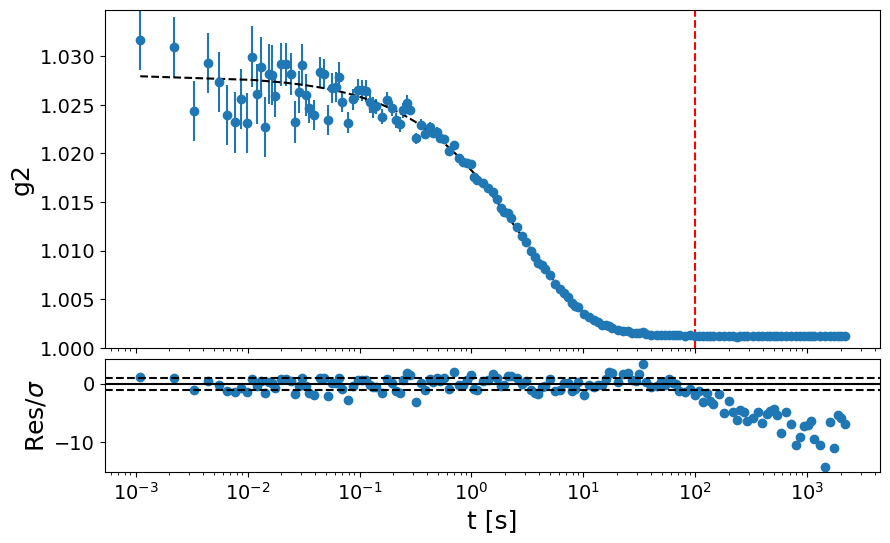

In [56]:
##################
t1_fit = 0
t2_fit = 1e2
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

fig, ax1, ax2 = MTplotfit_4damaged_vGeO2(itime, g2mt, t1_fit, t2_fit, save=True)

## <3 XPCS scan: T=415C, Q=0.19, 50min @ 1ms ON dp (GeO2_3_415C, dataset 1, scan 4)

In [57]:
#######################################
sample_name = 'GeO2_3_415C'
Ndataset = 1
Nscan = 4
Nfi, Nff =  None, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=50, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=4)

#############################
command = mtimescan 0.001 1 2999568
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
T = 54.99 min
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00022.h5 (23/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/600 loops)
	 -> loading file	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/600 loops)
 eiger4m_v2_sparse_frame_0_00002.h5 (3/600 loops)
	 -> loading file	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/600 loops)
 eiger4m_v2_sparse_frame_0_00011.h5 (12/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008

### Flux check

################################################################################
Maximum count in the whole run -> 4.0
################################################################################



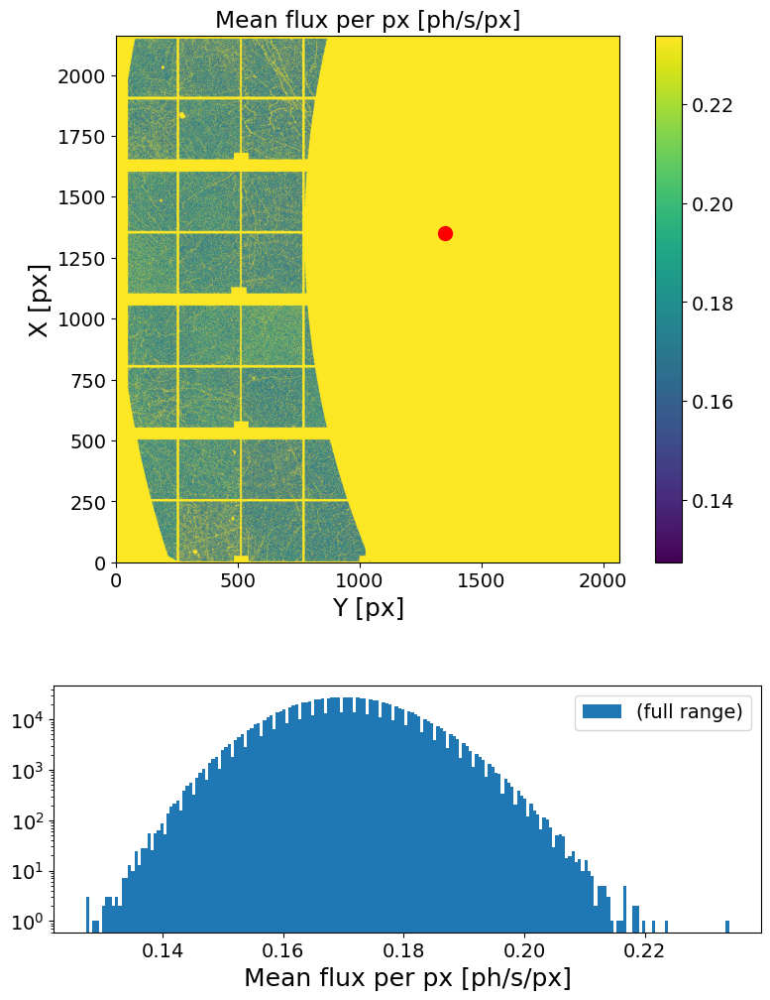

In [58]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_low=None, Ith_high=None, Nff=None, load_mask=load_mask)

### Intensity analysis

In [59]:
####################
Lbin = 100
Nstep = 100
Nfi = 25
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

It = np.vstack(XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep, Nfi=Nfi))
np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", It)

<SecondaryAxis: >

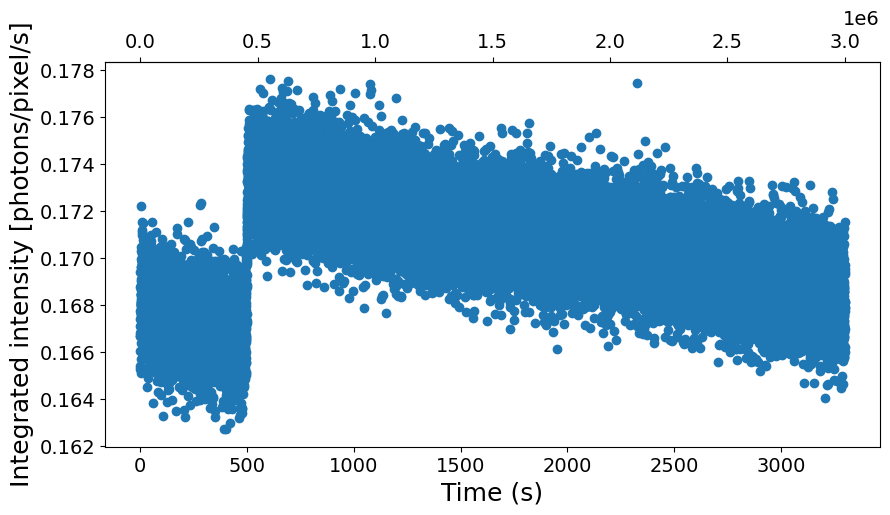

In [60]:
plt.figure(figsize=(10,5))
plt.scatter(It[0], It[1], label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Multitau correlation of damaged-vGeO2

In [61]:
##### INPUTS #####
Nfi = int(.05e6)
Nff = None
sparse_depth = 14
ch_depth = 4
mask = None
##################

G2tmt = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, ch_depth=ch_depth, mask=None, Nfi=Nfi, Nff=Nff)
g2mt= np.vstack(XPCS.get_g2mt(itime, G2tmt))
np.savetxt(f"{g24damaged_vGeO2_folder}g2mt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", g2mt)

Nff set to 2999120 => (Nff-Nfi) = 180*2^sparse_depth, thrown frames = 448 (0.02%)
Loading frames ...
Done! (elapsed time = 5.94 s)
	 | 2949120 frames X 1074960 pixels
	 | sparsity = 1.87e-04
	 | memory usage (sparse.csr_array @ float32) = 6.663 GB
Computing sparse multitau G2t...


 41%|████      | 73/180 [01:05<01:39,  1.07it/s]

100%|██████████| 180/180 [02:49<00:00,  1.06it/s]


Done! (elapsed time = 169.99 s)
Computing dense multitau G2t...
	-> computing channels on 1440 frames ...
	-> computing channels on 720 frames ...
	-> computing channels on 360 frames ...
	-> computing channels on 180 frames ...
	-> computing channels on 90 frames ...
	-> computing channels on 45 frames ...
	-> computing channels on 22 frames ...
Done! (elapsed time = 47.43 s)


(<Figure size 1000x500 with 2 Axes>,
 <Axes: xlabel='$t_w$ [s]', ylabel='$\\tau$ [s]'>)

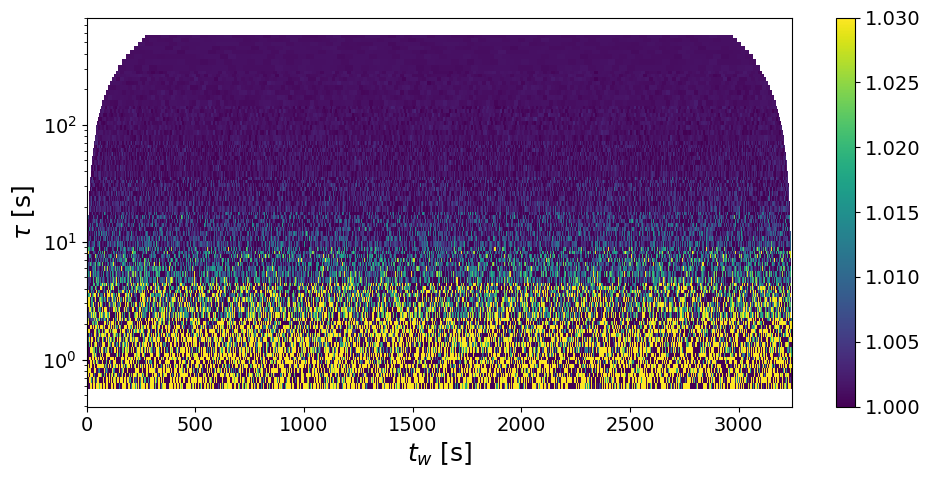

In [62]:
############################
vmin, vmax = 1.0, 1.03
lower_corr = 6
upper_corr = 16
filter_layer = 0
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log', lower_corr=lower_corr, upper_corr=upper_corr, filter_layer=filter_layer, borders=False)

/home/fabio/anaconda3/envs/XPCSenv/lib/python3.13/site-packages/uncertainties/core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")


2.858360541645434


Text(0, 0.5, 'c')

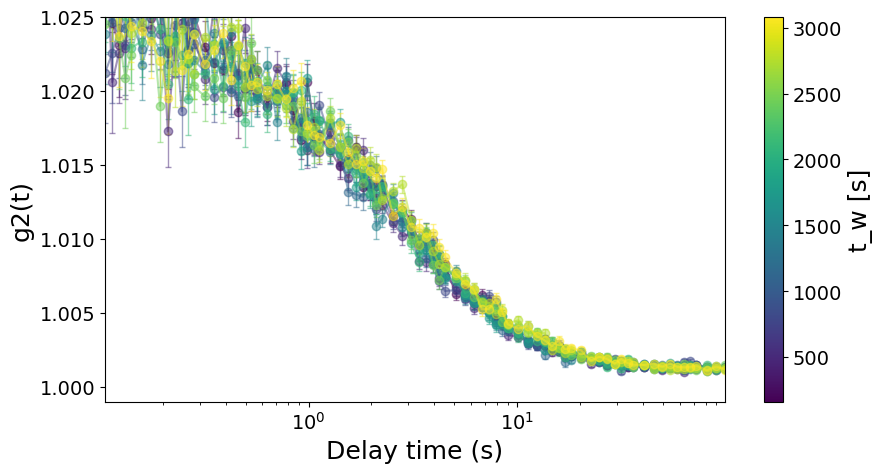

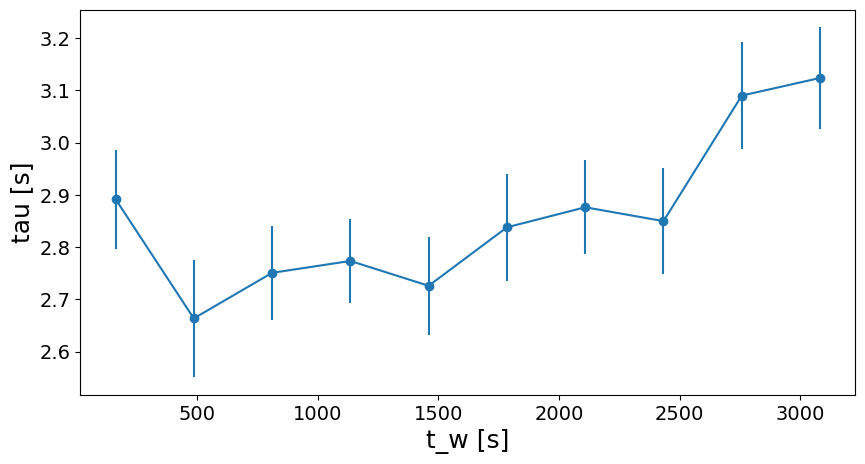

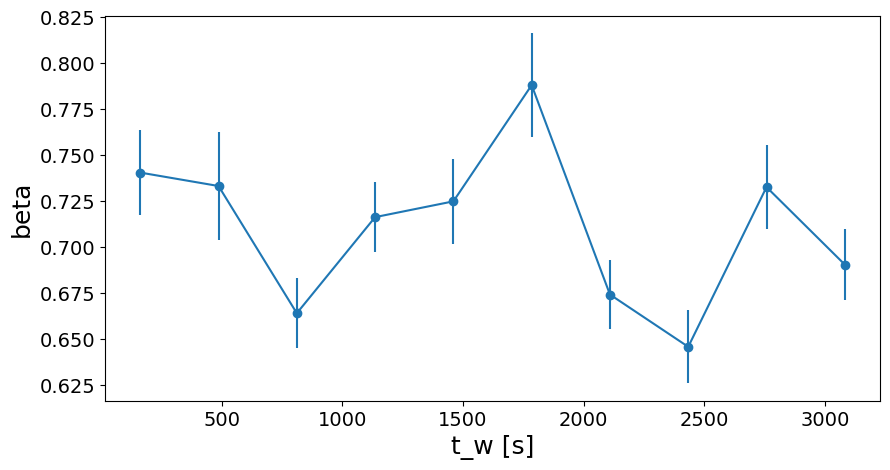

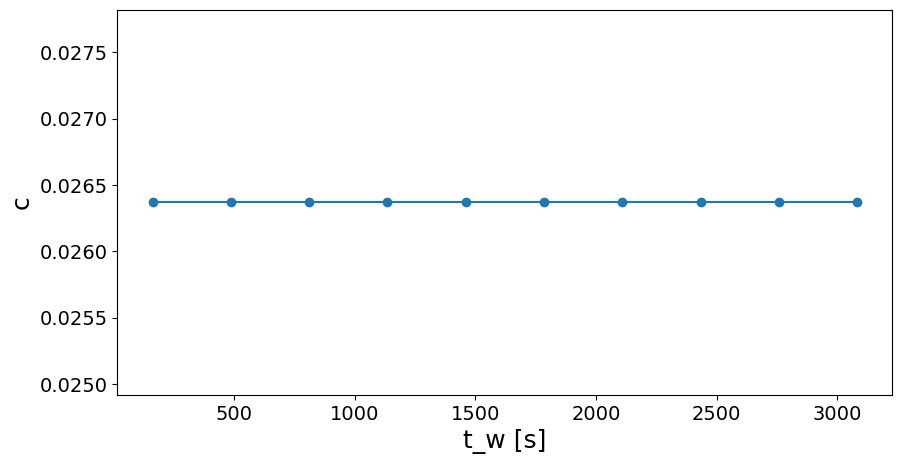

In [63]:
####################
split = 10
####################

model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.02637, min=0, max=.1, vary=False)
params.add('y0', value=1.0015, min=1, max=1.01, vary=False)

dT = G2tmt[0][1].shape[0]*itime/split
plt.figure(figsize=(10,5))
tau, dtau = {}, {}
beta, dbeta = {}, {}
c, dc = {}, {}
for i in range(split):
    t1 = i*dT
    t2 = (i+1)*dT
    t_g2mt, g2mt_cut, dg2mt_cut = XPCS.get_g2mt_cut(itime, G2tmt, t1, t2)
    mask = (t_g2mt>.1)*(t_g2mt<1e2)
    t_g2mt = t_g2mt[mask]
    g2mt_cut = g2mt_cut[mask]
    dg2mt_cut = dg2mt_cut[mask]


    cmap = plt.get_cmap('viridis')
    color = cmap(i / max(1, split - 1))
    plt.errorbar(t_g2mt, g2mt_cut, yerr=dg2mt_cut, fmt='o-', color=color, ecolor=color, elinewidth=1, capsize=2, label=f't = {t1:.0f}-{t2:.0f} s', alpha=.5)

    t = (t2+t1)/2
    result = model.fit(g2mt_cut, params, t=t_g2mt)
    tau[t] = result.params['tau'].value
    dtau[t] = result.params['tau'].stderr
    beta[t] = result.params['beta'].value
    dbeta[t] = result.params['beta'].stderr
    c[t] = result.params['c'].value
    dc[t] = result.params['c'].stderr

plt.xscale('log')

# add colorbar mapping line colors to mid waiting time t
t_mid = (np.arange(split) + 0.5) * dT
cmap = plt.get_cmap('viridis')
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable
norm = Normalize(vmin=t_mid.min(), vmax=t_mid.max())
sm = ScalarMappable(cmap=cmap, norm=norm)
sm.set_array(t_mid)
# ensure we provide an Axes for the colorbar (plt.gca() is the axes with the plotted data)
ax = plt.gca()
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('t_w [s]')

plt.xlabel('Delay time (s)')
plt.ylabel('g2(t)')
plt.ylim(.999, 1.025)
plt.xlim(t_g2mt.min(), t_g2mt.max())

plt.figure(figsize=(10,5))
plt.errorbar(list(tau.keys()), list(tau.values()), yerr=list(dtau.values()), fmt='o-')
plt.xlabel('t_w [s]')
plt.ylabel('tau [s]')
print(np.mean(list(tau.values())))

plt.figure(figsize=(10,5))
plt.errorbar(list(beta.keys()), list(beta.values()), yerr=list(dbeta.values()), fmt='o-')
plt.xlabel('t_w [s]')
plt.ylabel('beta')

plt.figure(figsize=(10,5))
plt.errorbar(list(c.keys()), list(c.values()), yerr=list(dc.values()), fmt='o-')
plt.xlabel('t_w [s]')
plt.ylabel('c')

Using Global variables: model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.2,0.02,2.840433,0.063937,2.250965,0.692772,0.011453,1.653204,0.026597,0.000346,1.300894,1.001436,0.000028,0.002763,1.567333


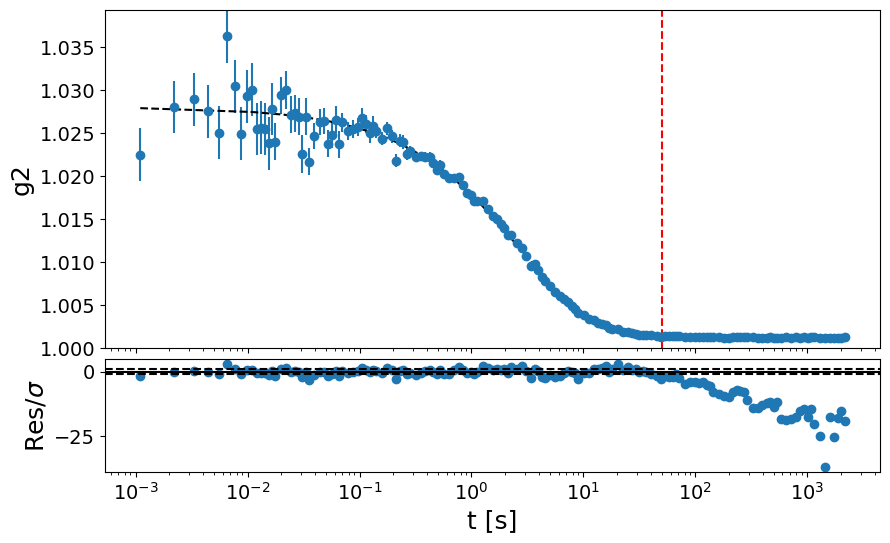

In [64]:
##################
t1_fit = 0
t2_fit = .5e2
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

fig, ax1, ax2 = MTplotfit_4damaged_vGeO2(itime, g2mt, t1_fit, t2_fit, save=True)

## <3 XPCS scan: T=450C, Q=0.19, 50min @ 1ms ON dp (GeO2_3_450C, dataset 1, scan 4)

In [65]:
#######################################
sample_name = 'GeO2_3_450C'
Ndataset = 1
Nscan = 4
Nfi, Nff =  None, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=50, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=4)

#############################
command = mtimescan 0.001 1 2999568
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
T = 54.99 min
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00032.h5 (33/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00030.h5 (31/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00033.h5 (34/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00034.h5 (35/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00016.h5 (17/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00039.h5 (40/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_000

### Flux check

################################################################################
Maximum count in the whole run -> 4.0
################################################################################



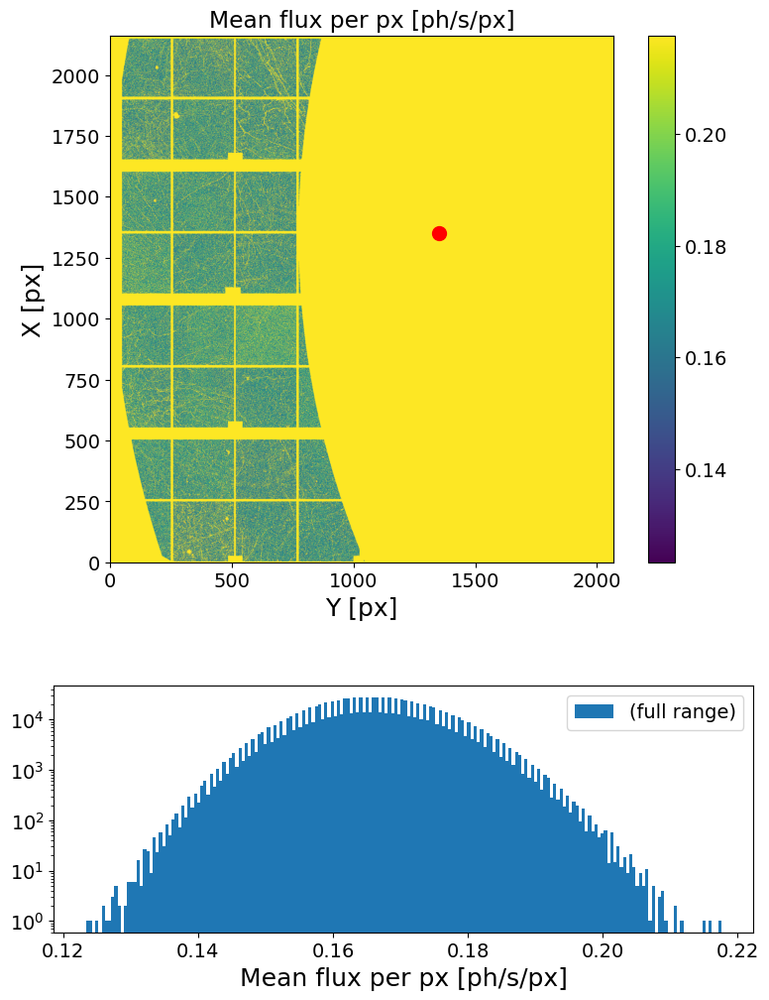

In [66]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_low=None, Ith_high=None, Nff=None, load_mask=load_mask)

### Intensity analysis

In [67]:
####################
Lbin = 100
Nstep = 100
Nfi = 25
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

It = np.vstack(XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep, Nfi=Nfi))
np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", It)

<SecondaryAxis: >

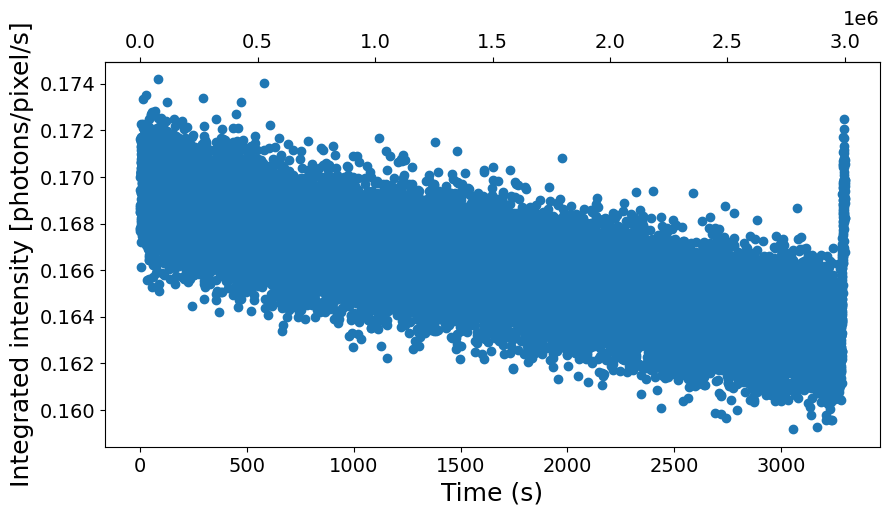

In [68]:
plt.figure(figsize=(10,5))
plt.scatter(It[0], It[1], label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Multitau correlation of damaged-vGeO2

In [69]:
##### INPUTS #####
Nfi = None#int(.4e6)
Nff = None
sparse_depth = 14
ch_depth = 4
mask = None
##################

G2tmt = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, ch_depth=ch_depth, mask=None, Nfi=Nfi, Nff=Nff)
g2mt= np.vstack(XPCS.get_g2mt(itime, G2tmt))
np.savetxt(f"{g24damaged_vGeO2_folder}g2mt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", g2mt)

Nff set to 2998272 => (Nff-Nfi) = 183*2^sparse_depth, thrown frames = 1296 (0.04%)
Loading frames ...


Done! (elapsed time = 6.33 s)
	 | 2998272 frames X 1074960 pixels
	 | sparsity = 1.83e-04
	 | memory usage (sparse.csr_array @ float32) = 6.602 GB
Computing sparse multitau G2t...


100%|██████████| 183/183 [02:33<00:00,  1.19it/s]


Done! (elapsed time = 153.42 s)
Computing dense multitau G2t...
	-> computing channels on 1464 frames ...
	-> computing channels on 732 frames ...
	-> computing channels on 366 frames ...
	-> computing channels on 183 frames ...
	-> computing channels on 91 frames ...
	-> computing channels on 45 frames ...
	-> computing channels on 22 frames ...
Done! (elapsed time = 45.18 s)


(<Figure size 1000x500 with 2 Axes>,
 <Axes: xlabel='$t_w$ [s]', ylabel='$\\tau$ [s]'>)

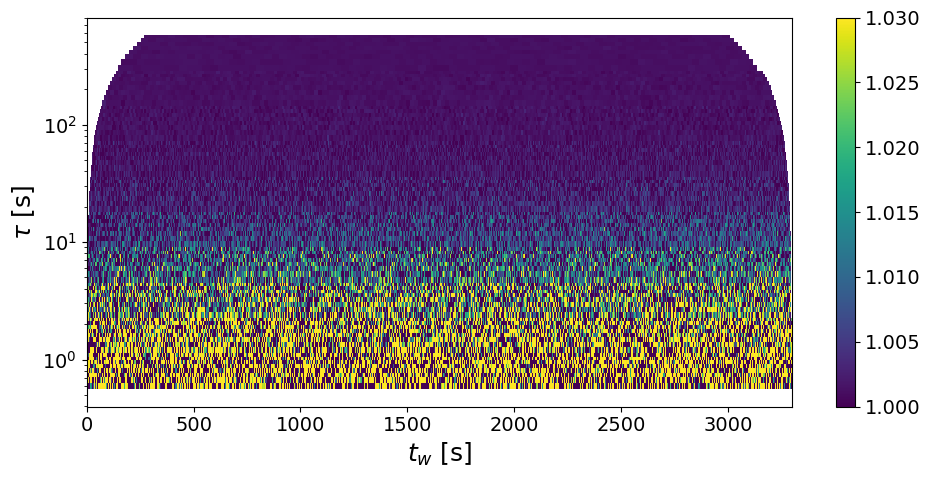

In [70]:
############################
vmin, vmax = 1.0, 1.03
lower_corr = 6
upper_corr = 16
filter_layer = 0
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log', lower_corr=lower_corr, upper_corr=upper_corr, filter_layer=filter_layer, borders=False)

/home/fabio/anaconda3/envs/XPCSenv/lib/python3.13/site-packages/uncertainties/core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")


3.7499942741836656


Text(0, 0.5, 'c')

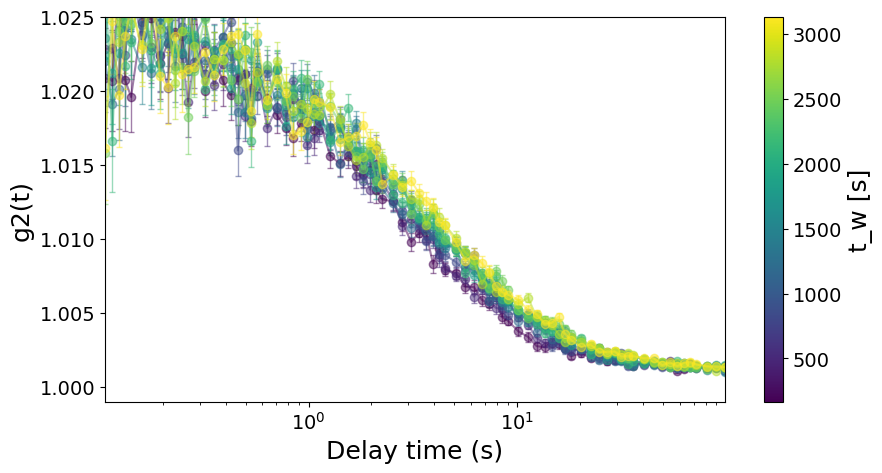

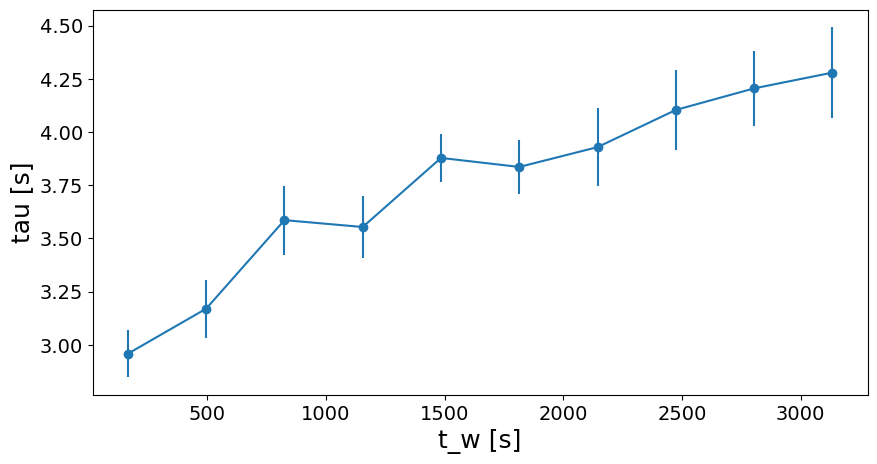

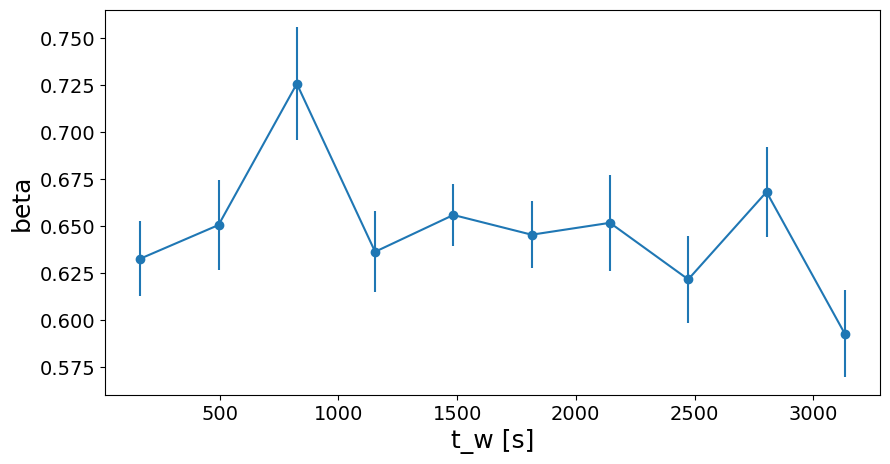

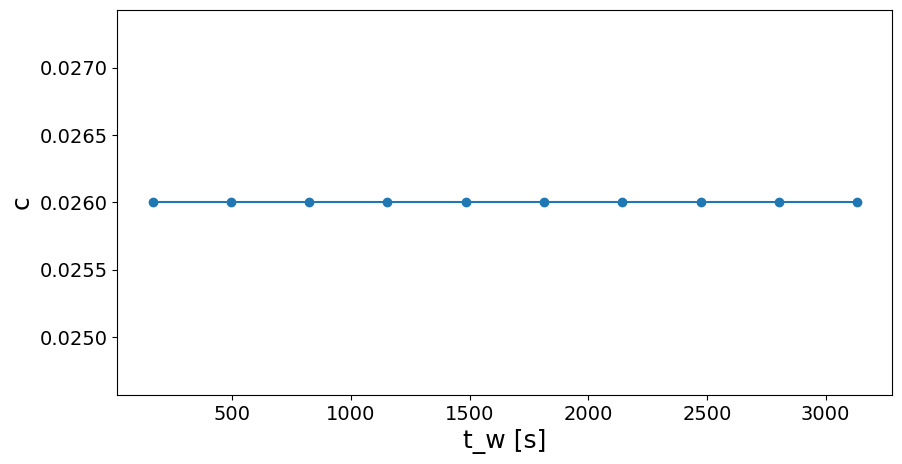

In [71]:
####################
split = 10
####################

model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.026, min=0, max=.1, vary=False)
params.add('y0', value=1.0014, min=1, max=1.01, vary=False)

dT = G2tmt[0][1].shape[0]*itime/split
plt.figure(figsize=(10,5))
tau, dtau = {}, {}
beta, dbeta = {}, {}
c, dc = {}, {}
for i in range(split):
    t1 = i*dT
    t2 = (i+1)*dT
    t_g2mt, g2mt_cut, dg2mt_cut = XPCS.get_g2mt_cut(itime, G2tmt, t1, t2)
    mask = (t_g2mt>.1)*(t_g2mt<1e2)
    t_g2mt = t_g2mt[mask]
    g2mt_cut = g2mt_cut[mask]
    dg2mt_cut = dg2mt_cut[mask]


    cmap = plt.get_cmap('viridis')
    color = cmap(i / max(1, split - 1))
    plt.errorbar(t_g2mt, g2mt_cut, yerr=dg2mt_cut, fmt='o-', color=color, ecolor=color, elinewidth=1, capsize=2, label=f't = {t1:.0f}-{t2:.0f} s', alpha=.5)

    t = (t2+t1)/2
    result = model.fit(g2mt_cut, params, t=t_g2mt)
    tau[t] = result.params['tau'].value
    dtau[t] = result.params['tau'].stderr
    beta[t] = result.params['beta'].value
    dbeta[t] = result.params['beta'].stderr
    c[t] = result.params['c'].value
    dc[t] = result.params['c'].stderr

plt.xscale('log')

# add colorbar mapping line colors to mid waiting time t
t_mid = (np.arange(split) + 0.5) * dT
cmap = plt.get_cmap('viridis')
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable
norm = Normalize(vmin=t_mid.min(), vmax=t_mid.max())
sm = ScalarMappable(cmap=cmap, norm=norm)
sm.set_array(t_mid)
# ensure we provide an Axes for the colorbar (plt.gca() is the axes with the plotted data)
ax = plt.gca()
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('t_w [s]')

plt.xlabel('Delay time (s)')
plt.ylabel('g2(t)')
plt.ylim(.999, 1.025)
plt.xlim(t_g2mt.min(), t_g2mt.max())

plt.figure(figsize=(10,5))
plt.errorbar(list(tau.keys()), list(tau.values()), yerr=list(dtau.values()), fmt='o-')
plt.xlabel('t_w [s]')
plt.ylabel('tau [s]')
print(np.mean(list(tau.values())))

plt.figure(figsize=(10,5))
plt.errorbar(list(beta.keys()), list(beta.values()), yerr=list(dbeta.values()), fmt='o-')
plt.xlabel('t_w [s]')
plt.ylabel('beta')

plt.figure(figsize=(10,5))
plt.errorbar(list(c.keys()), list(c.values()), yerr=list(dc.values()), fmt='o-')
plt.xlabel('t_w [s]')
plt.ylabel('c')

Using Global variables: model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.2,0.02,3.762767,0.088361,2.348293,0.651572,0.009793,1.502929,0.025828,0.000327,1.267575,1.001393,0.000019,0.001889,1.737195


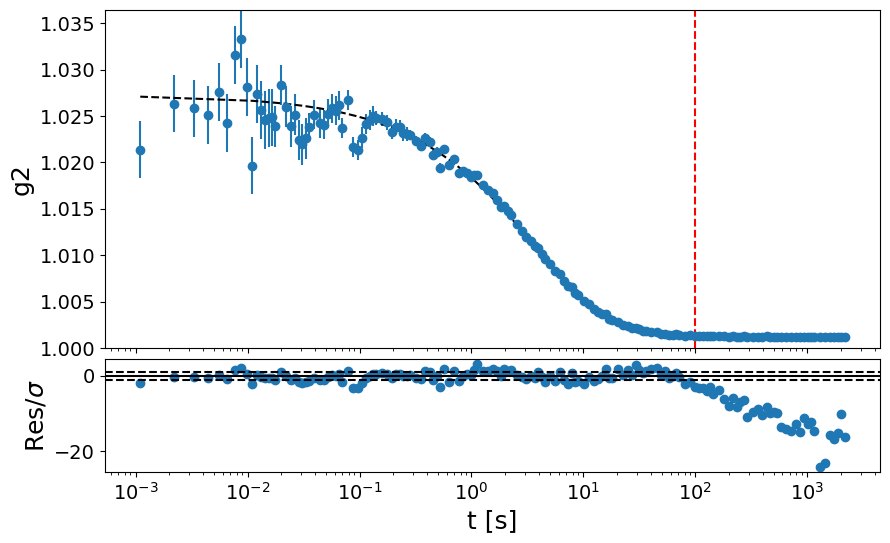

In [72]:
##################
t1_fit = 0
t2_fit = 1e2
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

fig, ax1, ax2 = MTplotfit_4damaged_vGeO2(itime, g2mt, t1_fit, t2_fit, save=True)

## <3 XPCS scan: T=485C, Q=0.19, 50min @ 1ms ON dp (GeO2_3_485C, dataset 1, scan 4)

In [73]:
#######################################
sample_name = 'GeO2_3_485C'
Ndataset = 1
Nscan = 4
Nfi, Nff =  None, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=50, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=4)

#############################
command = mtimescan 0.001 1 2999568
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
T = 54.99 min
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/600 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h

### Flux check

################################################################################
Maximum count in the whole run -> 4.0
################################################################################



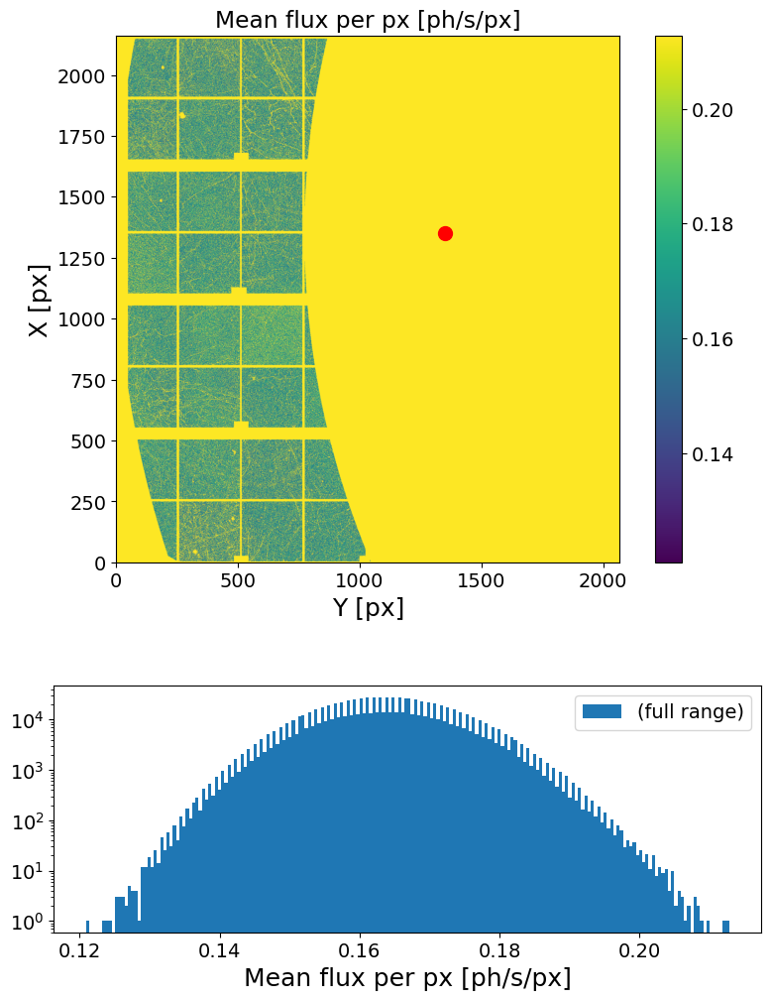

In [74]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_low=None, Ith_high=None, Nff=None, load_mask=load_mask)

### Intensity analysis

In [75]:
####################
Lbin = 100
Nstep = 100
Nfi = 25
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

It = np.vstack(XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep, Nfi=Nfi))
np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", It)

(0.0, 400.0)

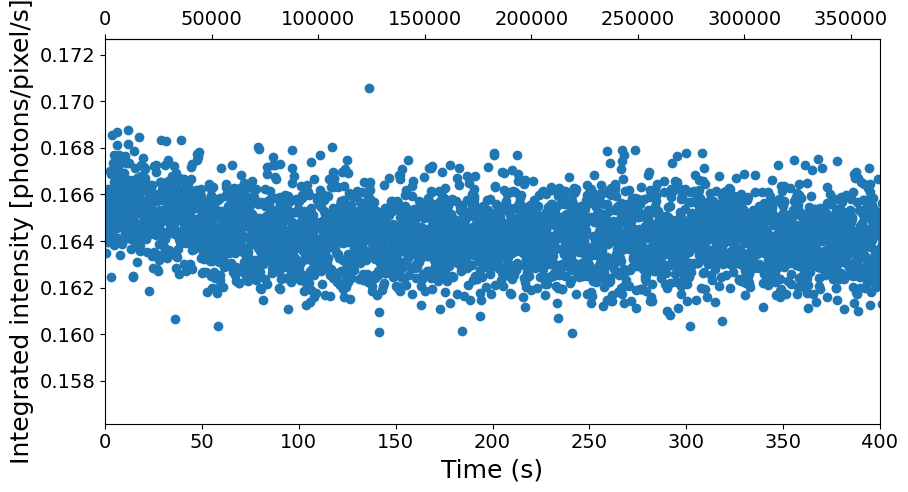

In [ ]:
plt.figure(figsize=(10,5))
plt.scatter(It[0], It[1], label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))
#plt.xlim(0,400)

### Multitau correlation of damaged-vGeO2

In [77]:
##### INPUTS #####
Nfi = None#int(.2e6)
Nff = None
sparse_depth = 14
ch_depth = 4
mask = None
##################

G2tmt = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, ch_depth=ch_depth, mask=None, Nfi=Nfi, Nff=Nff)
g2mt= np.vstack(XPCS.get_g2mt(itime, G2tmt))
np.savetxt(f"{g24damaged_vGeO2_folder}g2mt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", g2mt)

Nff set to 2998272 => (Nff-Nfi) = 183*2^sparse_depth, thrown frames = 1296 (0.04%)
Loading frames ...


Done! (elapsed time = 5.99 s)
	 | 2998272 frames X 1074960 pixels
	 | sparsity = 1.80e-04
	 | memory usage (sparse.csr_array @ float32) = 6.516 GB
Computing sparse multitau G2t...


100%|██████████| 183/183 [03:12<00:00,  1.05s/it]


Done! (elapsed time = 192.27 s)
Computing dense multitau G2t...
	-> computing channels on 1464 frames ...
	-> computing channels on 732 frames ...
	-> computing channels on 366 frames ...
	-> computing channels on 183 frames ...
	-> computing channels on 91 frames ...
	-> computing channels on 45 frames ...
	-> computing channels on 22 frames ...
Done! (elapsed time = 42.21 s)


(<Figure size 1000x500 with 2 Axes>,
 <Axes: xlabel='$t_w$ [s]', ylabel='$\\tau$ [s]'>)

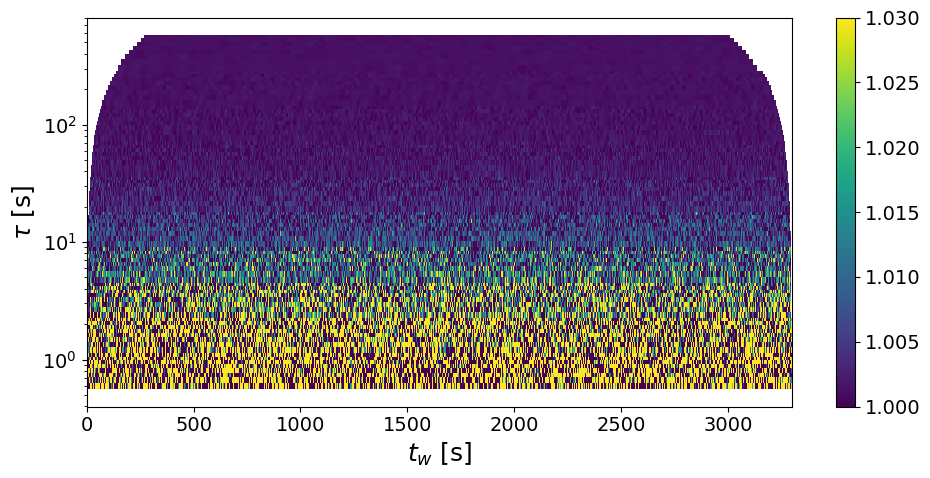

In [78]:
############################
vmin, vmax = 1.0, 1.03
lower_corr = 6
upper_corr = 16
filter_layer = 0
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log', lower_corr=lower_corr, upper_corr=upper_corr, filter_layer=filter_layer, borders=False)

/home/fabio/anaconda3/envs/XPCSenv/lib/python3.13/site-packages/uncertainties/core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")


5.153963322014399


Text(0, 0.5, 'c')

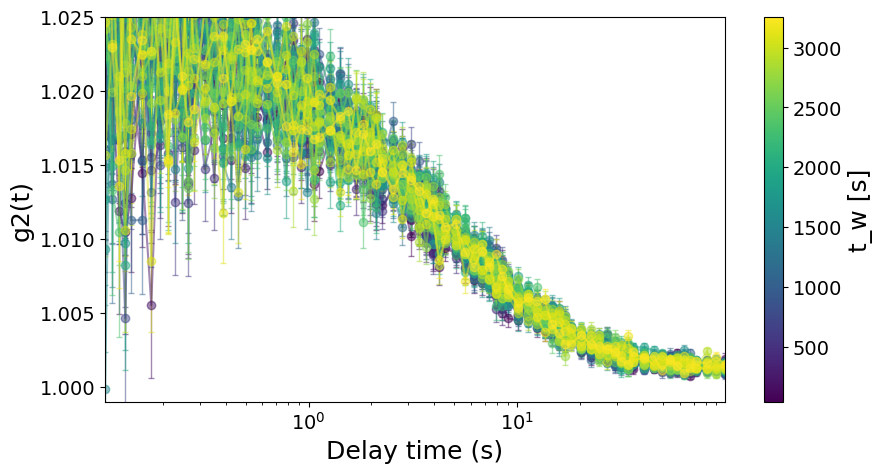

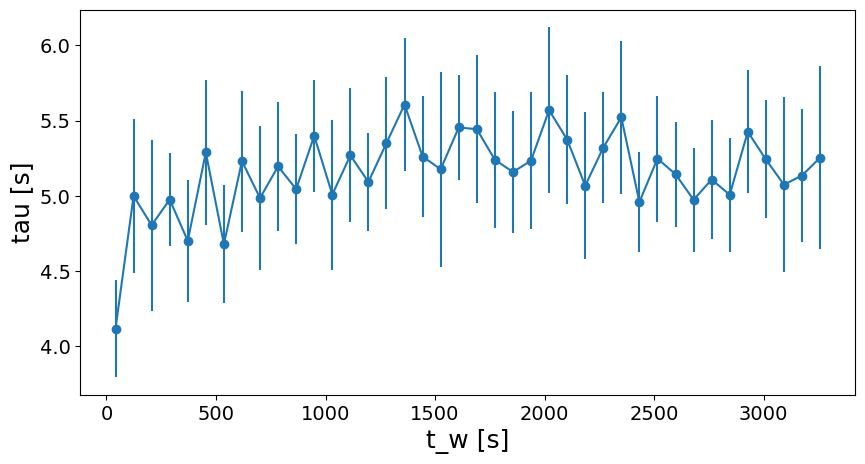

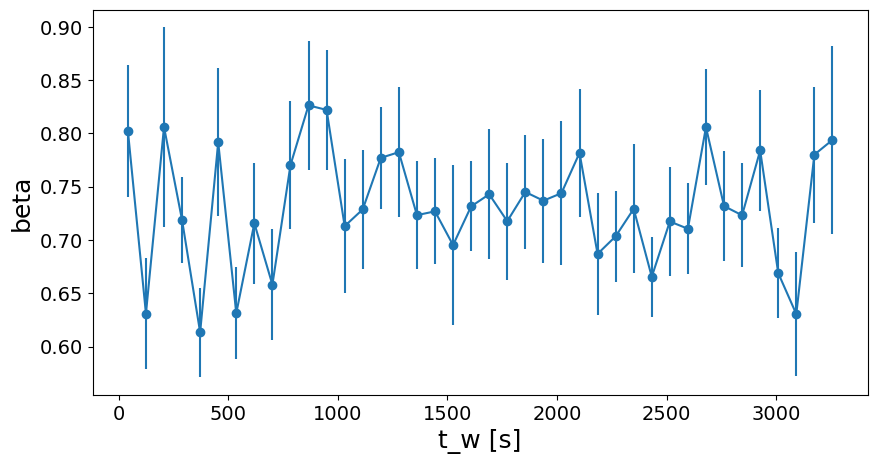

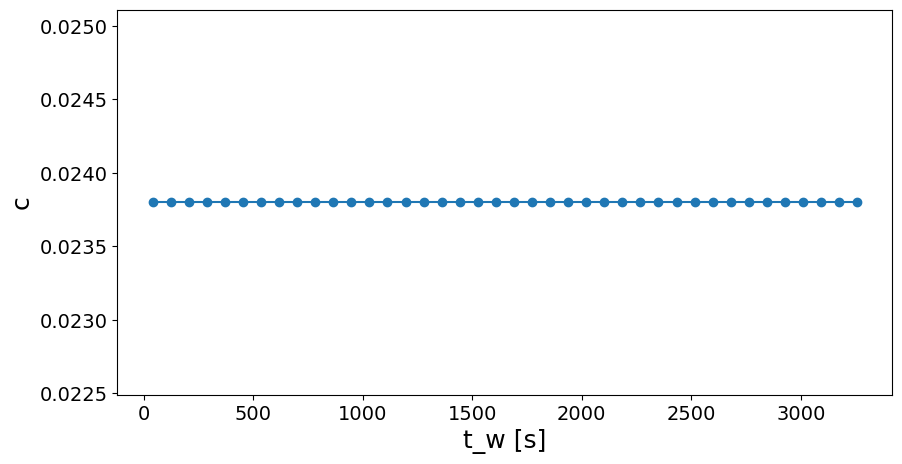

In [79]:
####################
split = 40
####################

model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.0238, min=0, max=.1, vary=False)
params.add('y0', value=1.0014, min=1, max=1.01, vary=False)

dT = G2tmt[0][1].shape[0]*itime/split
plt.figure(figsize=(10,5))
tau, dtau = {}, {}
beta, dbeta = {}, {}
c, dc = {}, {}
for i in range(split):
    t1 = i*dT
    t2 = (i+1)*dT
    t_g2mt, g2mt_cut, dg2mt_cut = XPCS.get_g2mt_cut(itime, G2tmt, t1, t2)
    mask = (t_g2mt>.1)*(t_g2mt<1e2)
    t_g2mt = t_g2mt[mask]
    g2mt_cut = g2mt_cut[mask]
    dg2mt_cut = dg2mt_cut[mask]


    cmap = plt.get_cmap('viridis')
    color = cmap(i / max(1, split - 1))
    plt.errorbar(t_g2mt, g2mt_cut, yerr=dg2mt_cut, fmt='o-', color=color, ecolor=color, elinewidth=1, capsize=2, label=f't = {t1:.0f}-{t2:.0f} s', alpha=.5)

    t = (t2+t1)/2
    result = model.fit(g2mt_cut, params, t=t_g2mt)
    tau[t] = result.params['tau'].value
    dtau[t] = result.params['tau'].stderr
    beta[t] = result.params['beta'].value
    dbeta[t] = result.params['beta'].stderr
    c[t] = result.params['c'].value
    dc[t] = result.params['c'].stderr

plt.xscale('log')

# add colorbar mapping line colors to mid waiting time t
t_mid = (np.arange(split) + 0.5) * dT
cmap = plt.get_cmap('viridis')
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable
norm = Normalize(vmin=t_mid.min(), vmax=t_mid.max())
sm = ScalarMappable(cmap=cmap, norm=norm)
sm.set_array(t_mid)
# ensure we provide an Axes for the colorbar (plt.gca() is the axes with the plotted data)
ax = plt.gca()
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('t_w [s]')

plt.xlabel('Delay time (s)')
plt.ylabel('g2(t)')
plt.ylim(.999, 1.025)
plt.xlim(t_g2mt.min(), t_g2mt.max())

plt.figure(figsize=(10,5))
plt.errorbar(list(tau.keys()), list(tau.values()), yerr=list(dtau.values()), fmt='o-')
plt.xlabel('t_w [s]')
plt.ylabel('tau [s]')
print(np.mean(list(tau.values())))

plt.figure(figsize=(10,5))
plt.errorbar(list(beta.keys()), list(beta.values()), yerr=list(dbeta.values()), fmt='o-')
plt.xlabel('t_w [s]')
plt.ylabel('beta')

plt.figure(figsize=(10,5))
plt.errorbar(list(c.keys()), list(c.values()), yerr=list(dc.values()), fmt='o-')
plt.xlabel('t_w [s]')
plt.ylabel('c')

Using Global variables: model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.2,0.02,4.781838,0.078715,1.646123,0.677466,0.007762,1.145721,0.024714,0.000229,0.926119,1.001426,0.000016,0.001615,1.0816


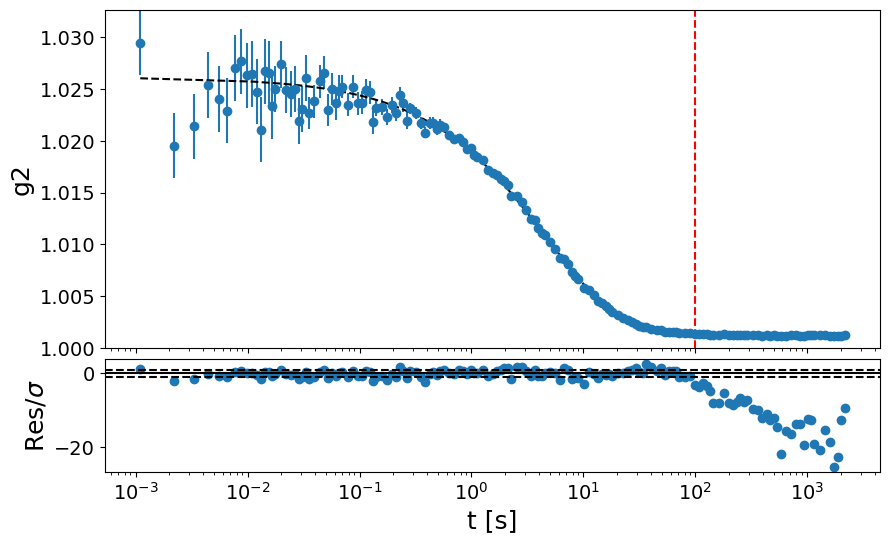

In [80]:
##################
t1_fit = 0
t2_fit = 1e2
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.024, min=0, max=.1, vary=True)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

fig, ax1, ax2 = MTplotfit_4damaged_vGeO2(itime, g2mt, t1_fit, t2_fit, save=True)

## <3 XPCS scan: T=520C, Q=0.19, 110min @ 1ms ON dp (GeO2_3_520C, dataset 1, scan 4)

In [81]:
#######################################
sample_name = 'GeO2_3_520C'
Ndataset = 1
Nscan = 4
Nfi, Nff =  None, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=50, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=4)

#############################
command = mtimescan 0.001 1 6000048
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
T = 110.00 min
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/1201 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00031.h5 (32/1201 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/1201 loops)
	 -> loading file	 -> loading file  eiger4m_v2_sparse_frame_0_00023.h5eiger4m_v2_sparse_frame_0_00024.h5  (24/1201 loops)(25/1201 loops)

	 -> loading file eiger4m_v2_sparse_frame_0_00025.h5 (26/1201 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00022.h5 (23/1201 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00039.h5 (40/1201 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00018.h5 (19/1201 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00046.h5 (47/1201 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/1201 loops)
	 -> loading file eiger4m_v2_spar

### Flux check

################################################################################
Maximum count in the whole run -> 4.0
################################################################################



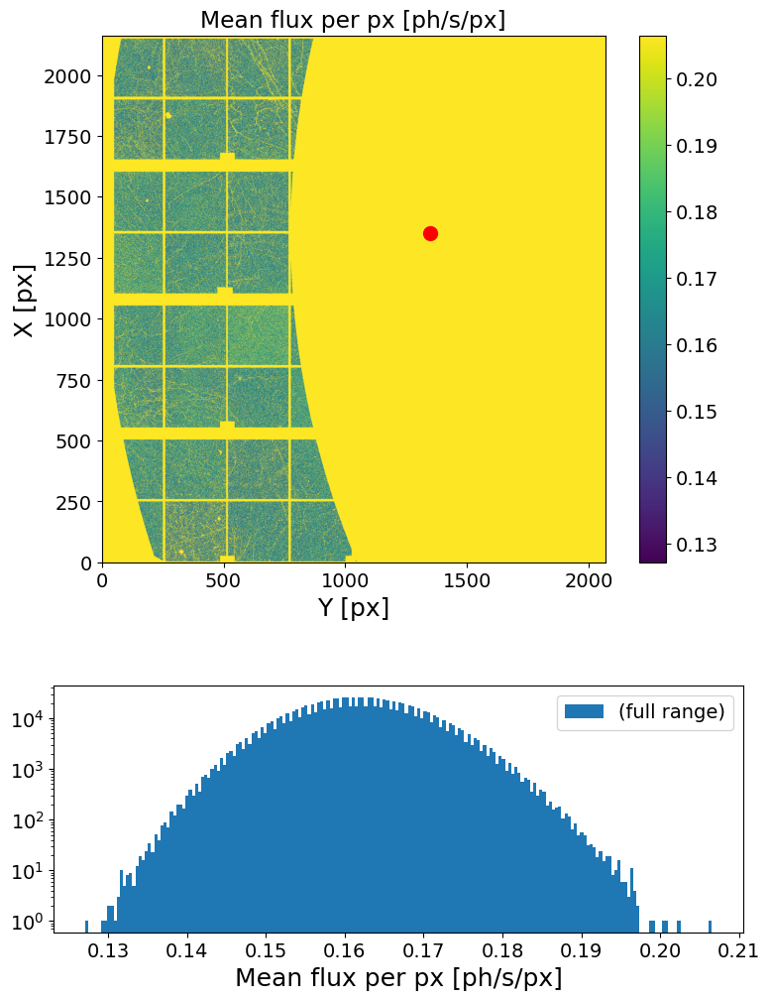

In [82]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_low=None, Ith_high=None, Nff=None, load_mask=load_mask)

### Intensity analysis

In [83]:
####################
Lbin = 100
Nstep = 100
Nfi = 25
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

It = np.vstack(XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep, Nfi=Nfi))
np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", It)

<SecondaryAxis: >

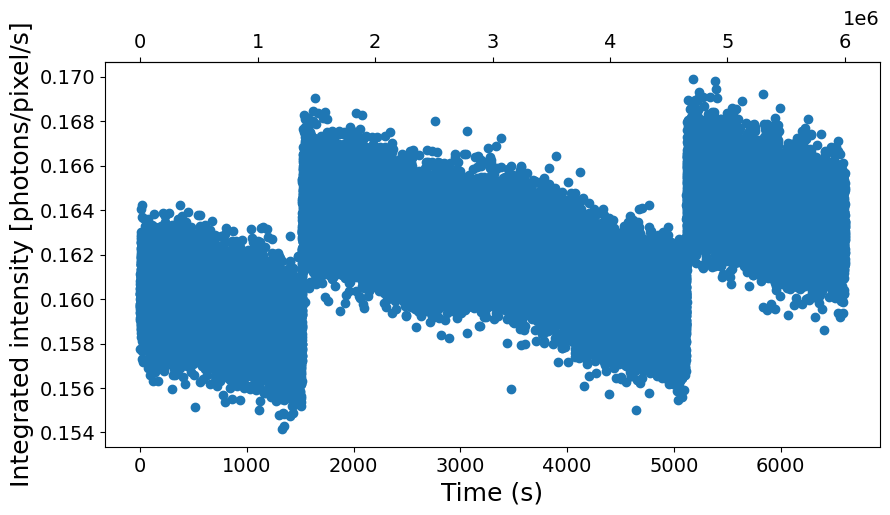

In [84]:
plt.figure(figsize=(10,5))
plt.scatter(It[0], It[1], label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Multitau correlation of damaged-vGeO2

In [85]:
##### INPUTS #####
Nfi = int(.1e6)
Nff = None
sparse_depth = 14
ch_depth = 4
mask = None
##################

G2tmt = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, ch_depth=ch_depth, mask=None, Nfi=Nfi, Nff=Nff)
g2mt= np.vstack(XPCS.get_g2mt(itime, G2tmt))
np.savetxt(f"{g24damaged_vGeO2_folder}g2mt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", g2mt)

Nff set to 5998240 => (Nff-Nfi) = 360*2^sparse_depth, thrown frames = 1808 (0.03%)
Loading frames ...


Done! (elapsed time = 12.97 s)
	 | 5898240 frames X 1074960 pixels
	 | sparsity = 1.78e-04
	 | memory usage (sparse.csr_array @ float32) = 12.669 GB
Computing sparse multitau G2t...


100%|██████████| 360/360 [05:11<00:00,  1.16it/s]


Done! (elapsed time = 311.55 s)
Computing dense multitau G2t...
	-> computing channels on 2880 frames ...
	-> computing channels on 1440 frames ...
	-> computing channels on 720 frames ...
	-> computing channels on 360 frames ...
	-> computing channels on 180 frames ...
	-> computing channels on 90 frames ...
	-> computing channels on 45 frames ...
	-> computing channels on 22 frames ...
Done! (elapsed time = 85.86 s)


(<Figure size 1000x500 with 2 Axes>,
 <Axes: xlabel='$t_w$ [s]', ylabel='$\\tau$ [s]'>)

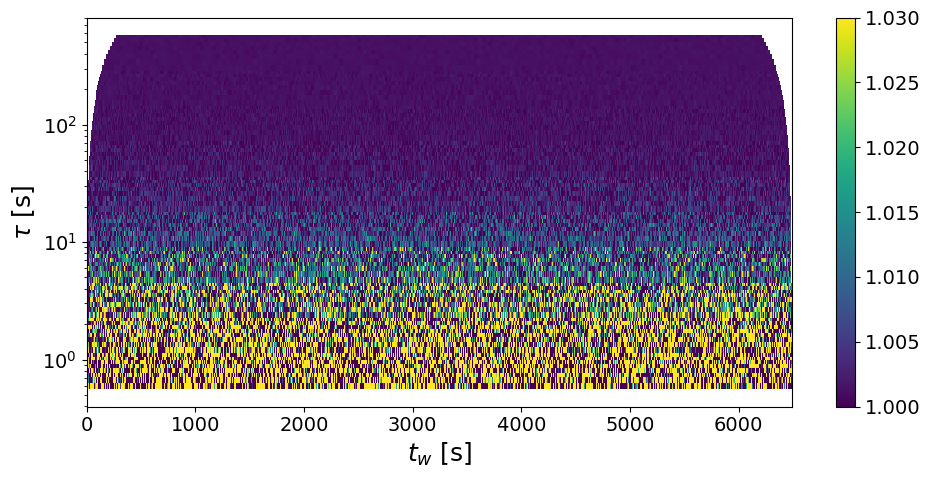

In [86]:
############################
vmin, vmax = 1.0, 1.03
lower_corr = 6
upper_corr = 16
filter_layer = 0
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log', lower_corr=lower_corr, upper_corr=upper_corr, filter_layer=filter_layer, borders=False)

/home/fabio/anaconda3/envs/XPCSenv/lib/python3.13/site-packages/uncertainties/core.py:1024: UserWarning: Using UFloat objects with std_dev==0 may give unexpected results.
  warn("Using UFloat objects with std_dev==0 may give unexpected results.")


3.9869349333575363


Text(0, 0.5, 'c')

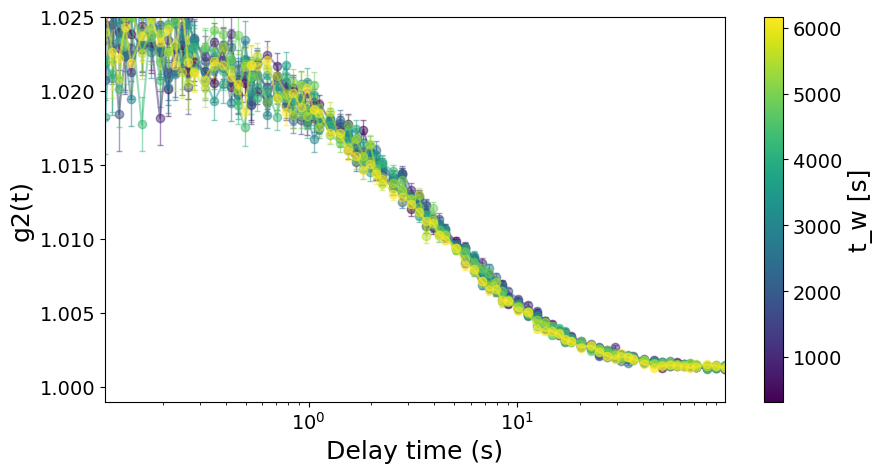

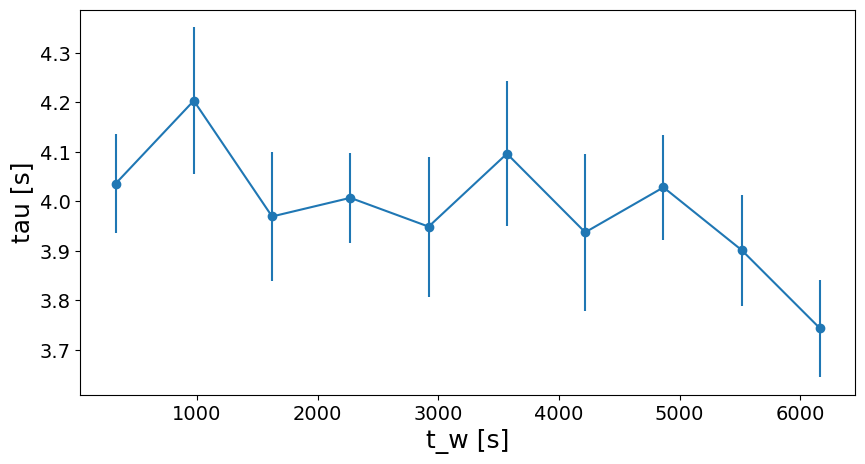

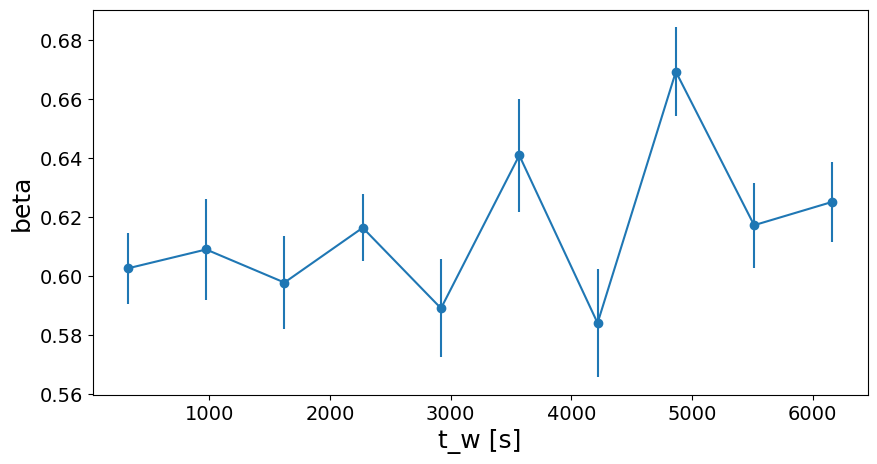

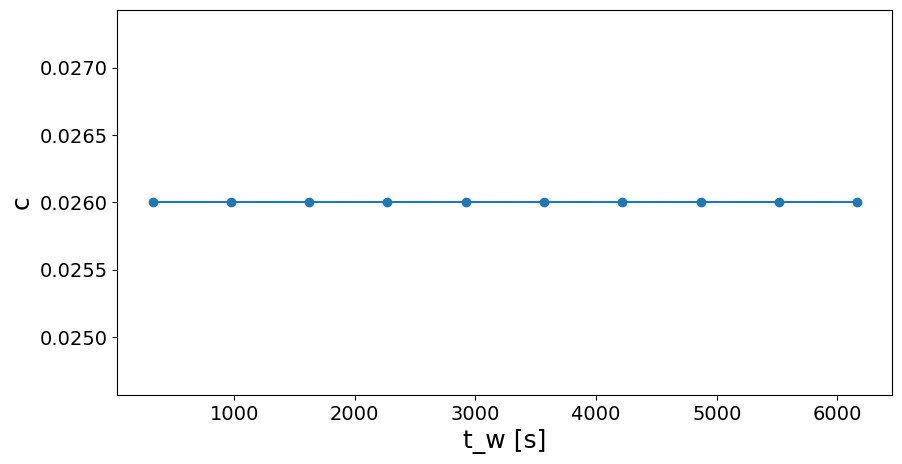

In [87]:
####################
split = 10
####################

model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.026, min=0, max=.1, vary=False)
params.add('y0', value=1.0014, min=1, max=1.01, vary=False)

dT = G2tmt[0][1].shape[0]*itime/split
plt.figure(figsize=(10,5))
tau, dtau = {}, {}
beta, dbeta = {}, {}
c, dc = {}, {}
for i in range(split):
    t1 = i*dT
    t2 = (i+1)*dT
    t_g2mt, g2mt_cut, dg2mt_cut = XPCS.get_g2mt_cut(itime, G2tmt, t1, t2)
    mask = (t_g2mt>.1)*(t_g2mt<1e2)
    t_g2mt = t_g2mt[mask]
    g2mt_cut = g2mt_cut[mask]
    dg2mt_cut = dg2mt_cut[mask]


    cmap = plt.get_cmap('viridis')
    color = cmap(i / max(1, split - 1))
    plt.errorbar(t_g2mt, g2mt_cut, yerr=dg2mt_cut, fmt='o-', color=color, ecolor=color, elinewidth=1, capsize=2, label=f't = {t1:.0f}-{t2:.0f} s', alpha=.5)

    t = (t2+t1)/2
    result = model.fit(g2mt_cut, params, t=t_g2mt)
    tau[t] = result.params['tau'].value
    dtau[t] = result.params['tau'].stderr
    beta[t] = result.params['beta'].value
    dbeta[t] = result.params['beta'].stderr
    c[t] = result.params['c'].value
    dc[t] = result.params['c'].stderr

plt.xscale('log')

# add colorbar mapping line colors to mid waiting time t
t_mid = (np.arange(split) + 0.5) * dT
cmap = plt.get_cmap('viridis')
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable
norm = Normalize(vmin=t_mid.min(), vmax=t_mid.max())
sm = ScalarMappable(cmap=cmap, norm=norm)
sm.set_array(t_mid)
# ensure we provide an Axes for the colorbar (plt.gca() is the axes with the plotted data)
ax = plt.gca()
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('t_w [s]')

plt.xlabel('Delay time (s)')
plt.ylabel('g2(t)')
plt.ylim(.999, 1.025)
plt.xlim(t_g2mt.min(), t_g2mt.max())

plt.figure(figsize=(10,5))
plt.errorbar(list(tau.keys()), list(tau.values()), yerr=list(dtau.values()), fmt='o-')
plt.xlabel('t_w [s]')
plt.ylabel('tau [s]')
print(np.mean(list(tau.values())))

plt.figure(figsize=(10,5))
plt.errorbar(list(beta.keys()), list(beta.values()), yerr=list(dbeta.values()), fmt='o-')
plt.xlabel('t_w [s]')
plt.ylabel('beta')

plt.figure(figsize=(10,5))
plt.errorbar(list(c.keys()), list(c.values()), yerr=list(dc.values()), fmt='o-')
plt.xlabel('t_w [s]')
plt.ylabel('c')

Using Global variables: model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.2,0.02,4.35353,0.078133,1.794704,0.677516,0.008297,1.224671,0.024744,0.000247,0.999503,1.001413,0.000016,0.001568,2.263132


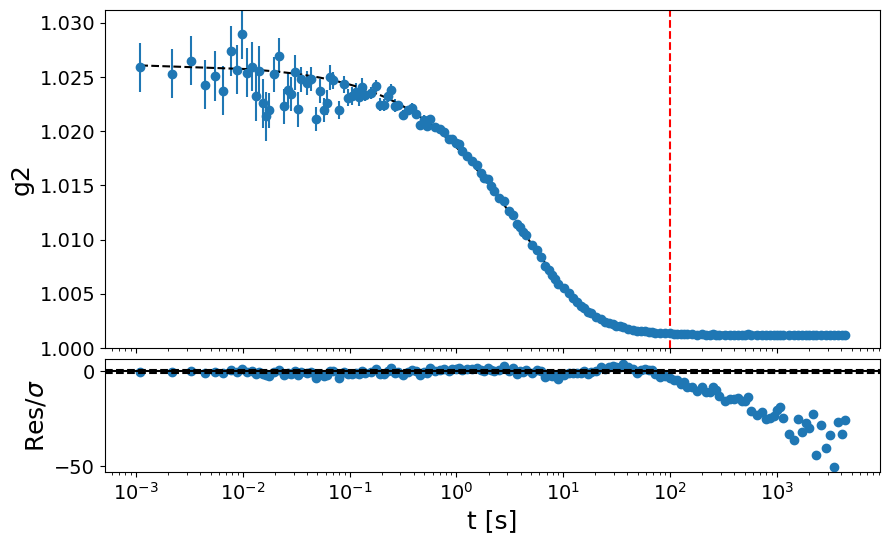

In [88]:
##################
t1_fit = 0
t2_fit = 1e2
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

fig, ax1, ax2 = MTplotfit_4damaged_vGeO2(itime, g2mt, t1_fit, t2_fit, save=True)

## XPCS scan: T=555C, Q=0.19, 110min @ 1ms ON dp (GeO2_3_555C, dataset 1, scan 4)

In [89]:
#######################################
sample_name = 'GeO2_3_555C'
Ndataset = 1
Nscan = 4
Nfi, Nff =  None, None #3_000_000
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=50, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=4)

#############################
command = mtimescan 0.001 1 6000048
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
T = 110.00 min
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/1201 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00028.h5 (29/1201 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/1201 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00014.h5 (15/1201 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00015.h5 (16/1201 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/1201 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/1201 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00022.h5 (23/1201 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00017.h5 (18/1201 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00023.h5 (24/1201 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/1201 loops)
	 -> loading file 	 -> loading fil

### Flux check

################################################################################
Maximum count in the whole run -> 4.0
################################################################################



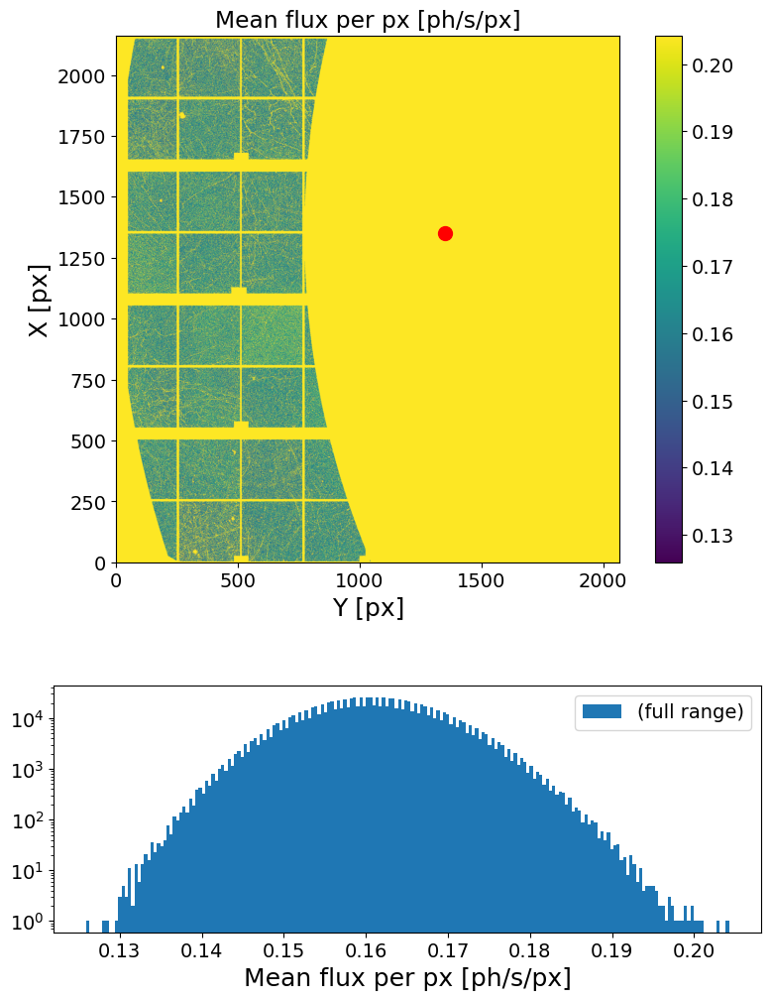

In [90]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_low=None, Ith_high=None, Nff=None, load_mask=load_mask)

### Intensity analysis

In [91]:
####################
Lbin = 100
Nstep = 100
Nfi = 25
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

It = np.vstack(XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep, Nfi=Nfi))
np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", It)

<SecondaryAxis: >

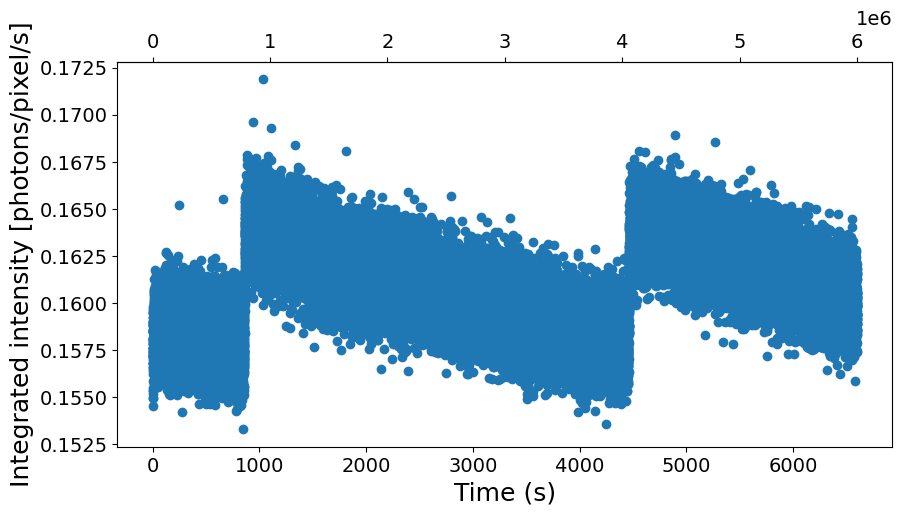

In [92]:
plt.figure(figsize=(10,5))
plt.scatter(It[0], It[1], label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Multitau correlation of damaged-vGeO2

In [93]:
##### INPUTS #####
Nfi = int(.2e6)
Nff = None
sparse_depth = 14
ch_depth = 4
mask = None
##################

G2tmt = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, ch_depth=ch_depth, mask=None, Nfi=Nfi, Nff=Nff)
g2mt= np.vstack(XPCS.get_g2mt(itime, G2tmt))
np.savetxt(f"{g24damaged_vGeO2_folder}g2mt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", g2mt)

Nff set to 5999936 => (Nff-Nfi) = 354*2^sparse_depth, thrown frames = 112 (0.0%)
Loading frames ...


Done! (elapsed time = 11.34 s)
	 | 5799936 frames X 1074960 pixels
	 | sparsity = 1.77e-04
	 | memory usage (sparse.csr_array @ float32) = 12.38 GB
Computing sparse multitau G2t...


100%|██████████| 354/354 [05:05<00:00,  1.16it/s]


Done! (elapsed time = 305.56 s)
Computing dense multitau G2t...
	-> computing channels on 2832 frames ...
	-> computing channels on 1416 frames ...
	-> computing channels on 708 frames ...
	-> computing channels on 354 frames ...
	-> computing channels on 177 frames ...
	-> computing channels on 88 frames ...
	-> computing channels on 44 frames ...
	-> computing channels on 22 frames ...
Done! (elapsed time = 81.43 s)


(<Figure size 1000x500 with 2 Axes>,
 <Axes: xlabel='$t_w$ [s]', ylabel='$\\tau$ [s]'>)

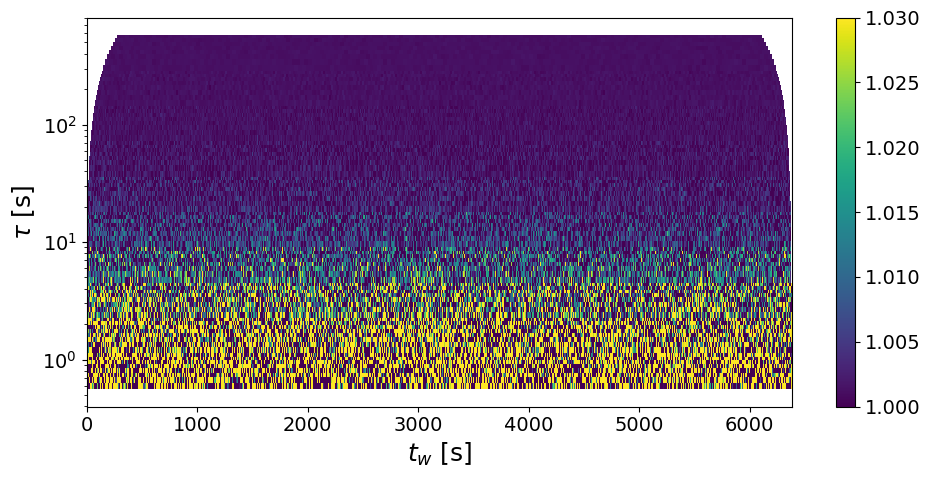

In [94]:
############################
vmin, vmax = 1.0, 1.03
lower_corr = 6
upper_corr = 16
filter_layer = 0
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log', lower_corr=lower_corr, upper_corr=upper_corr, filter_layer=filter_layer, borders=False)

Using Global variables: model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.2,0.02,3.124444,0.066614,2.132042,0.666412,0.009091,1.364213,0.024976,0.000288,1.15379,1.001402,0.000014,0.001399,2.186238


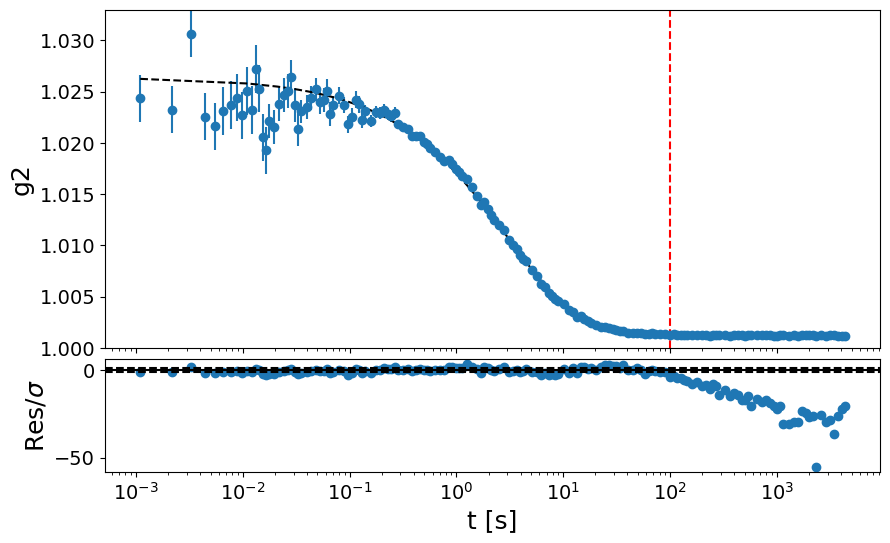

In [95]:
##################
t1_fit = 0
t2_fit = 1e2
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

fig, ax1, ax2 = MTplotfit_4damaged_vGeO2(itime, g2mt, t1_fit, t2_fit, save=True)

## XPCS scan: T=590C, Q=0.19, 110min @ 1ms ON dp (GeO2_3_590C, dataset 1, scan 4)

In [96]:
#######################################
sample_name = 'GeO2_3_590C'
Ndataset = 1
Nscan = 4
Nfi, Nff =  None, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=50, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=4)

#############################
command = mtimescan 0.001 1 6000048
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
T = 110.00 min
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/1201 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00027.h5 (28/1201 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/1201 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/1201 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/1201 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00028.h5 (29/1201 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/1201 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00030.h5 (31/1201 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00045.h5 (46/1201 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00046.h5 (47/1201 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/1201 loops)
	 -> loading file eiger4m_v2_sparse

### Flux check

################################################################################
Maximum count in the whole run -> 4.0
################################################################################



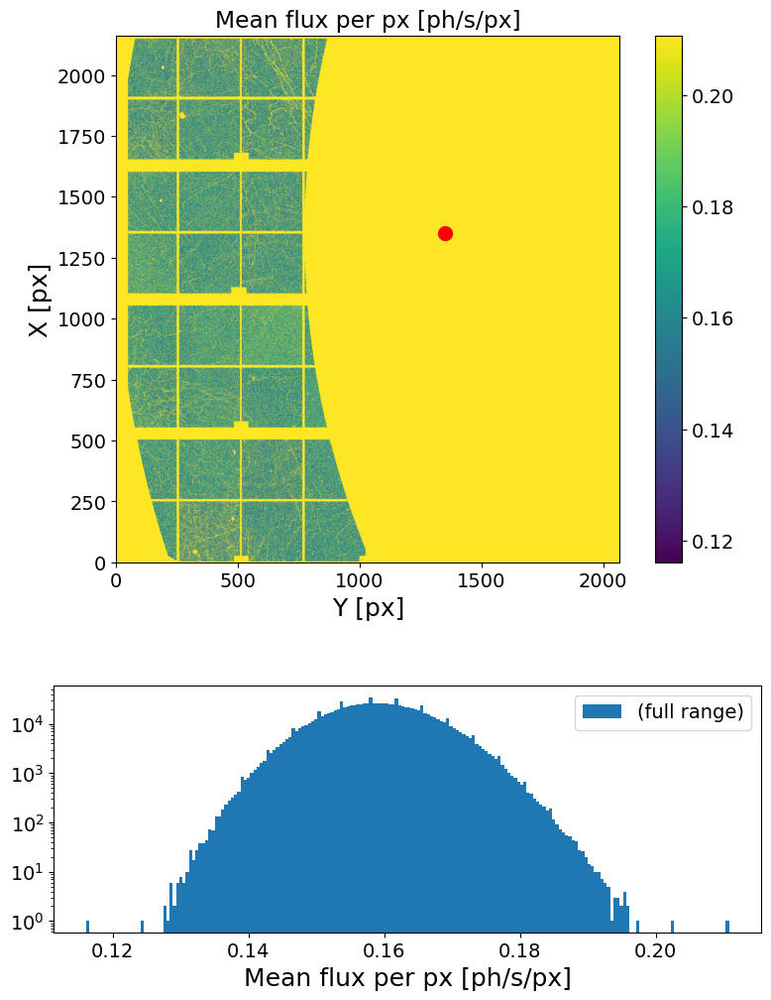

In [97]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_low=None, Ith_high=None, Nff=None, load_mask=load_mask)

### Intensity analysis

In [98]:
####################
Lbin = 100
Nstep = 100
Nfi = 25
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

It = np.vstack(XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep, Nfi=Nfi))
np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", It)

<SecondaryAxis: >

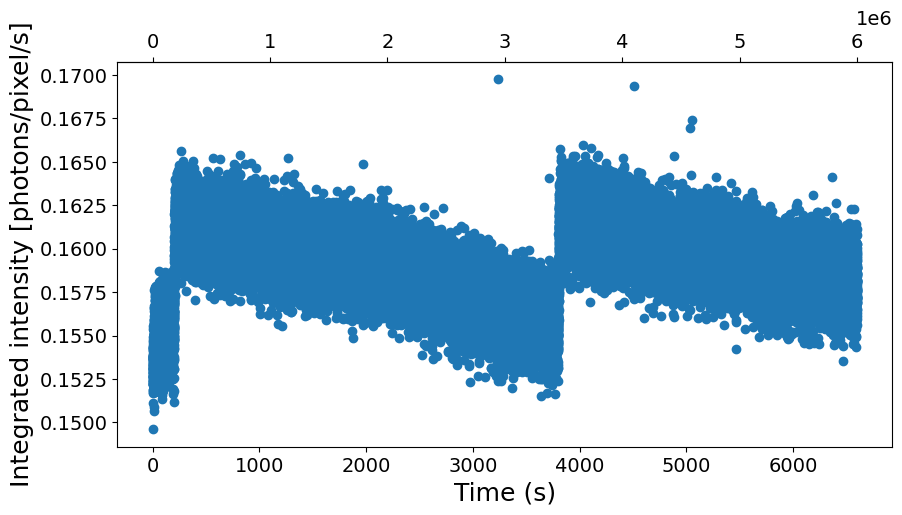

In [99]:
plt.figure(figsize=(10,5))
plt.scatter(It[0], It[1], label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Multitau correlation of damaged-vGeO2

In [100]:
##### INPUTS #####
Nfi = int(.5e6)
Nff = None
sparse_depth = 14
ch_depth = 4
mask = None
##################

G2tmt = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, ch_depth=ch_depth, mask=None, Nfi=Nfi, Nff=Nff)
g2mt= np.vstack(XPCS.get_g2mt(itime, G2tmt))
np.savetxt(f"{g24damaged_vGeO2_folder}g2mt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", g2mt)

Nff set to 5988640 => (Nff-Nfi) = 335*2^sparse_depth, thrown frames = 11408 (0.21%)
Loading frames ...


Done! (elapsed time = 10.47 s)
	 | 5488640 frames X 1074960 pixels
	 | sparsity = 1.75e-04
	 | memory usage (sparse.csr_array @ float32) = 11.581 GB
Computing sparse multitau G2t...


100%|██████████| 335/335 [04:39<00:00,  1.20it/s]


Done! (elapsed time = 279.23 s)
Computing dense multitau G2t...
	-> computing channels on 2680 frames ...
	-> computing channels on 1340 frames ...
	-> computing channels on 670 frames ...
	-> computing channels on 335 frames ...
	-> computing channels on 167 frames ...
	-> computing channels on 83 frames ...
	-> computing channels on 41 frames ...
	-> computing channels on 20 frames ...
Done! (elapsed time = 77.11 s)


(<Figure size 1000x500 with 2 Axes>,
 <Axes: xlabel='$t_w$ [s]', ylabel='$\\tau$ [s]'>)

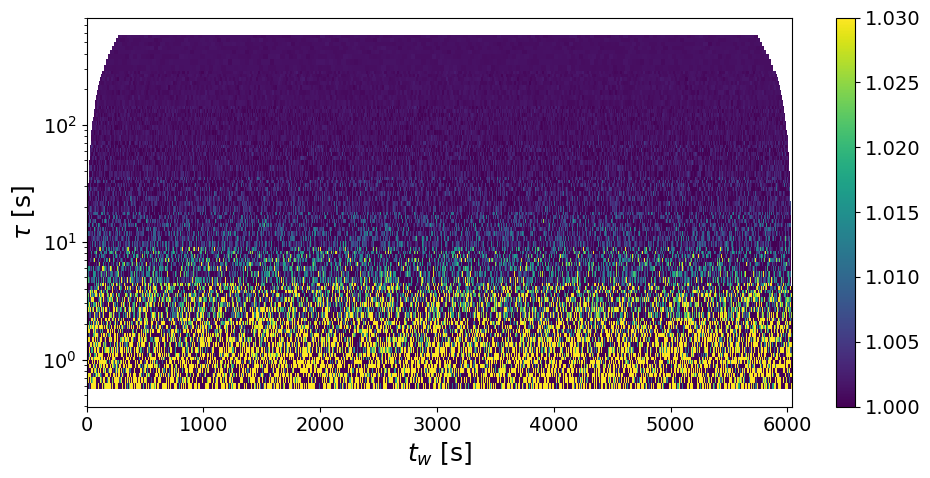

In [101]:
############################
vmin, vmax = 1.0, 1.03
lower_corr = 6
upper_corr = 16
filter_layer = 0
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log', lower_corr=lower_corr, upper_corr=upper_corr, filter_layer=filter_layer, borders=False)

Using Global variables: model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.2,0.02,1.805996,0.046738,2.587935,0.675567,0.010976,1.624738,0.025125,0.00035,1.392263,1.001337,0.000012,0.001169,1.833387


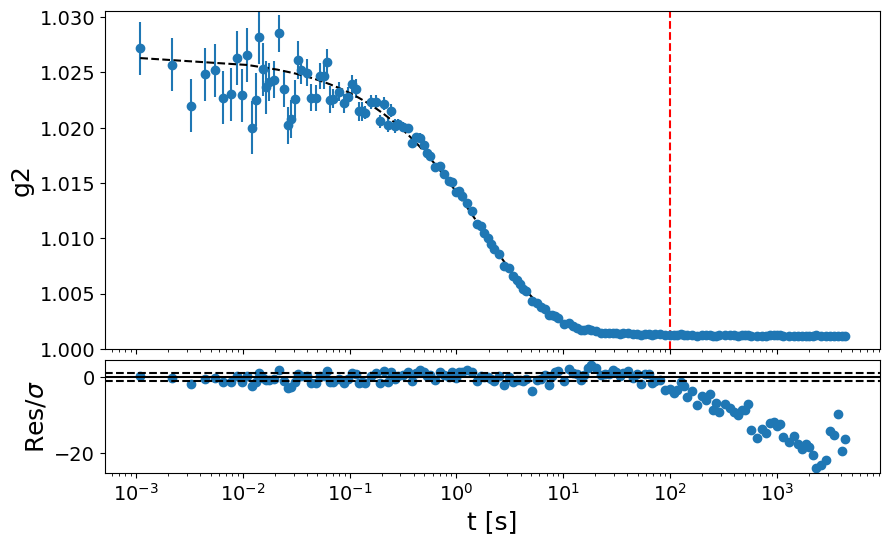

In [102]:
##################
t1_fit = 0
t2_fit = 1e2
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

fig, ax1, ax2 = MTplotfit_4damaged_vGeO2(itime, g2mt, t1_fit, t2_fit, save=True)

## XPCS scan: T=625C, Q=0.19, 160min @ 1ms ON dp (GeO2_3_625C, dataset 1, scan 4)

In [103]:
#######################################
sample_name = 'GeO2_3_625C'
Ndataset = 1
Nscan = 4
Nfi, Nff =  None, None
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=50, load_mask=load_mask)
e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=4)

#############################
command = mtimescan 0.001 1 8999616
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
T = 164.99 min
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/1800 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00028.h5 (29/1800 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/1800 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/1800 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00017.h5 (18/1800 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00014.h5 (15/1800 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/1800 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00019.h5 (20/1800 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00029.h5 (30/1800 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/1800 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00034.h5 (35/1800 loops)
	 -> loading file eiger4m_v2_sparse

### Flux check

################################################################################
Maximum count in the whole run -> 4.0
################################################################################



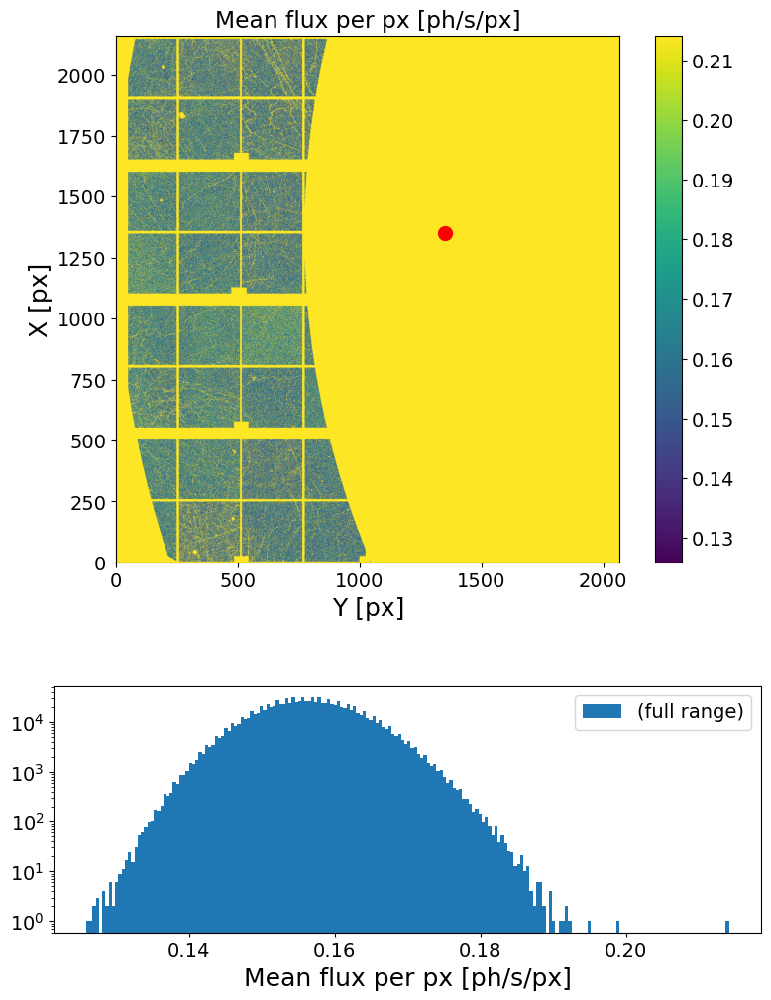

In [104]:
XPCS.gen_plots4mask(e4m_data, itime, Ith_low=None, Ith_high=None, Nff=None, load_mask=load_mask)

### Intensity analysis

In [105]:
####################
Lbin = 100
Nstep = 100
Nfi = 25
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

It = np.vstack(XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep, Nfi=Nfi))
np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", It)

<SecondaryAxis: >

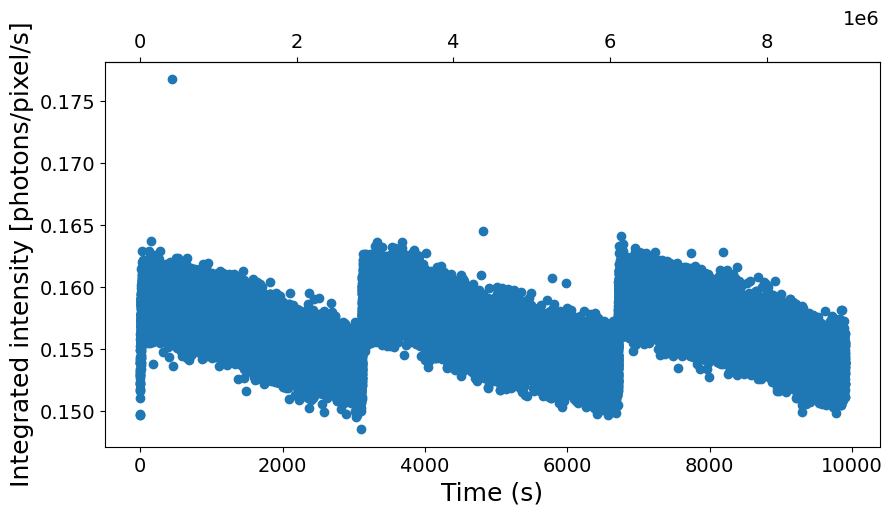

In [106]:
plt.figure(figsize=(10,5))
plt.scatter(It[0], It[1], label='It')
plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Multitau correlation of damaged-vGeO2

In [107]:
##### INPUTS #####
Nfi = int(.5e6)
Nff = None
sparse_depth = 14
ch_depth = 4
mask = None
##################

G2tmt = XPCS.get_G2tmt_4sparse(e4m_data, sparse_depth, ch_depth=ch_depth, mask=None, Nfi=Nfi, Nff=Nff)
g2mt= np.vstack(XPCS.get_g2mt(itime, G2tmt))
np.savetxt(f"{g24damaged_vGeO2_folder}g2mt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", g2mt)

Nff set to 8986912 => (Nff-Nfi) = 518*2^sparse_depth, thrown frames = 12704 (0.15%)
Loading frames ...


Done! (elapsed time = 16.99 s)
	 | 8486912 frames X 1074960 pixels
	 | sparsity = 1.72e-04
	 | memory usage (sparse.csr_array @ float32) = 17.6 GB
Computing sparse multitau G2t...


100%|██████████| 518/518 [08:09<00:00,  1.06it/s]


Done! (elapsed time = 489.91 s)
Computing dense multitau G2t...
	-> computing channels on 4144 frames ...
	-> computing channels on 2072 frames ...
	-> computing channels on 1036 frames ...
	-> computing channels on 518 frames ...
	-> computing channels on 259 frames ...
	-> computing channels on 129 frames ...
	-> computing channels on 64 frames ...
	-> computing channels on 32 frames ...
Done! (elapsed time = 193.16 s)


(<Figure size 1000x500 with 2 Axes>,
 <Axes: xlabel='$t_w$ [s]', ylabel='$\\tau$ [s]'>)

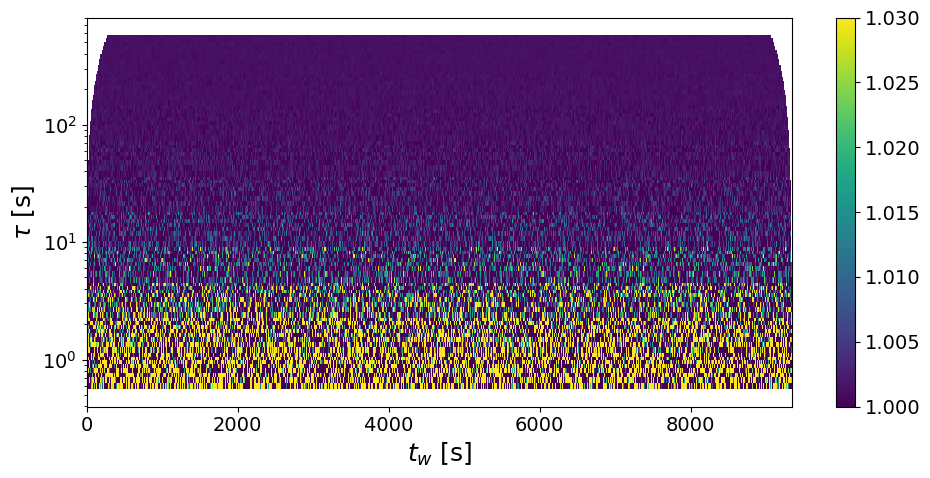

In [108]:
############################
vmin, vmax = 1.0, 1.03
lower_corr = 6
upper_corr = 16
filter_layer = 0
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log', lower_corr=lower_corr, upper_corr=upper_corr, filter_layer=filter_layer, borders=False)

Using Global variables: model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.2,0.02,0.992484,0.023383,2.356024,0.702967,0.01085,1.543453,0.024387,0.000316,1.294516,1.001257,0.000008,0.000758,1.314495


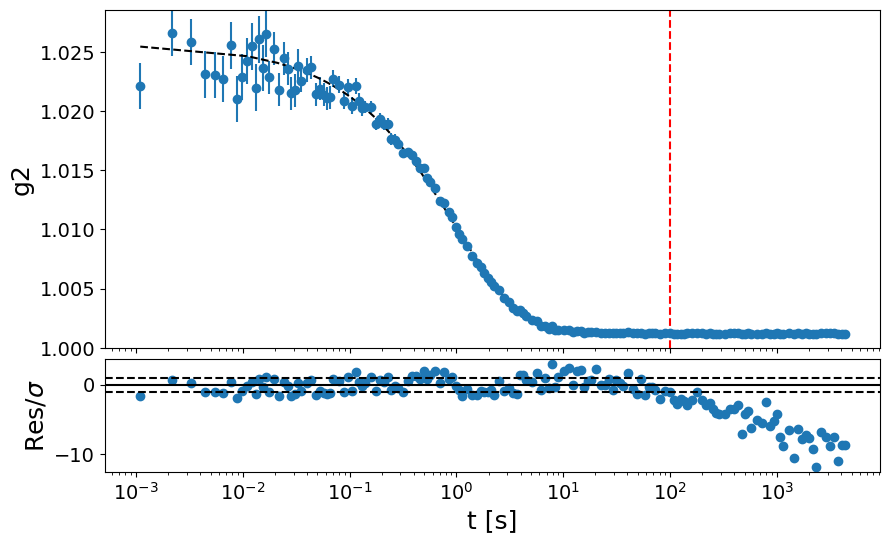

In [109]:
##################
t1_fit = 0
t2_fit = 1e2
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

fig, ax1, ax2 = MTplotfit_4damaged_vGeO2(itime, g2mt, t1_fit, t2_fit, save=True)

## XPCS mesh: T=660C, Q=0.19, 44min x 4 @ 1ms ON fp (GeO2_3, dataset 1, scan 4-5-6-7)

In [110]:
#######################################
sample_name = 'GeO2_3_660C'
Ndataset = 1
Nscan = range(4, 7+1)
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan[3])
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

#############################
command = mtimescan 0.001 1 2400384
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
T = 44.01 min
#############################



In [111]:
e4m_data = {}
for s in Nscan:
    e4m_data[s] = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, s, n_jobs=50, load_mask=load_mask)
    e4m_data[s] = COSMIC.fast_gamma_filter(e4m_data[s], Imaxth_high=4)

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00028.h5 (29/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00024.h5 (25/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00020.h5 (21/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00017.h5 (18/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/481 loops)
	 -> loading file eiger4m_v2_sp

### Flux check

################################################################################
Maximum count in the whole run -> 4.0
################################################################################



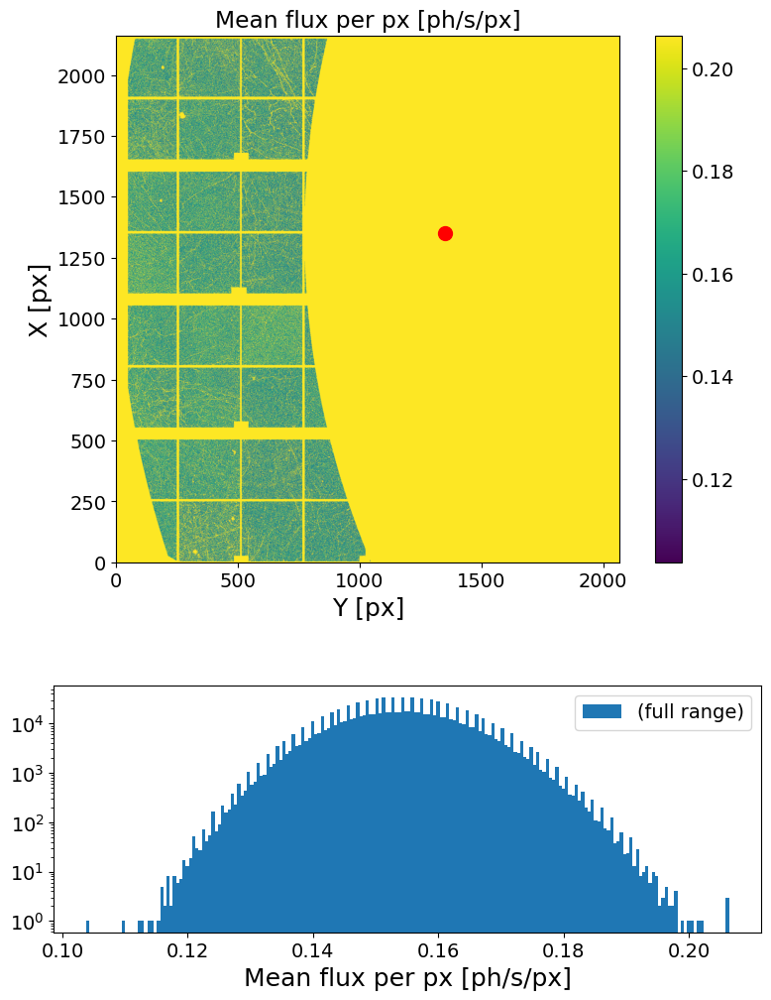

In [112]:
XPCS.gen_plots4mask(e4m_data[Nscan[0]], itime, Ith_low=None, Ith_high=None, Nff=None, load_mask=load_mask)

### Intensity analysis

<SecondaryAxis: >

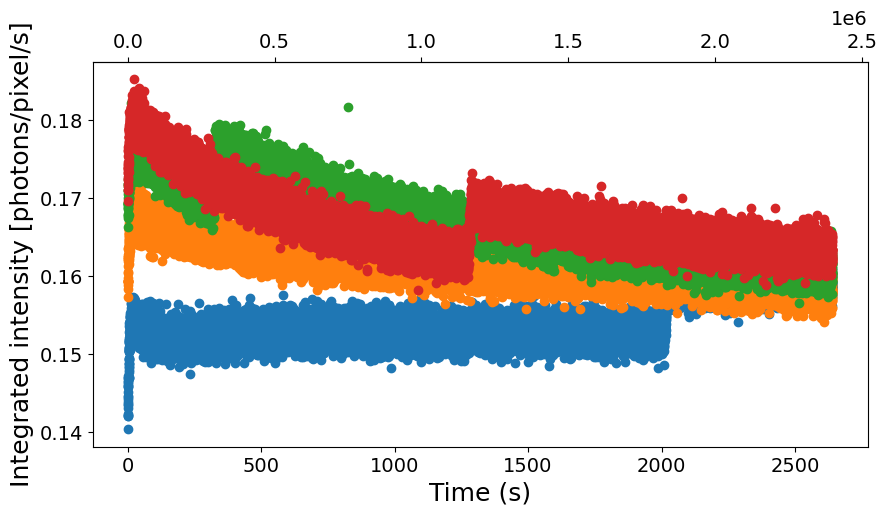

In [113]:
####################
Lbin = 100
Nstep = 100
Nfi = 25
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

plt.figure(figsize=(10,5))
for s in Nscan:
    It = np.vstack(XPCS.get_It(e4m_data[s], itime, mask=mask, Lbin=Lbin, Nstep=Nstep, Nfi=Nfi))
    np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(s).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", It)

    plt.scatter(It[0], It[1], label='It')

plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Multitau correlation of damaged-vGeO2

In [114]:
##### INPUTS #####
Nfi = int(1e6)
Nff = None
sparse_depth = 14
ch_depth = 4
mask = None
##################

for s in Nscan:
    print(f"Processing scan {s}...")
    if s==Nscan[0]:
        G2tmt = XPCS.get_G2tmt_4sparse(e4m_data[s], sparse_depth, ch_depth=ch_depth, mask=None, Nfi=Nfi, Nff=Nff)
    else:
        G2tmt2add = XPCS.get_G2tmt_4sparse(e4m_data[s], sparse_depth, ch_depth=ch_depth, mask=None, Nfi=Nfi, Nff=Nff)
        for corr in range(len(G2tmt)):
            for ch in range(len(G2tmt[corr])):
                G2tmt[corr][ch] += G2tmt2add[corr][ch]

for corr in range(len(G2tmt)):
    for ch in range(len(G2tmt[corr])):
        G2tmt[corr][ch] /= len(Nscan)

g2mt= np.vstack(XPCS.get_g2mt(itime, G2tmt))
np.savetxt(f"{g24damaged_vGeO2_folder}g2mt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan[0])}:{str(Nscan[-1])}-Q={Q_notebook}-dQ={dQ_notebook}.txt", g2mt)

Processing scan 4...
Nff set to 2392640 => (Nff-Nfi) = 85*2^sparse_depth, thrown frames = 7744 (0.55%)
Loading frames ...


Done! (elapsed time = 2.59 s)
	 | 1392640 frames X 1074960 pixels
	 | sparsity = 1.71e-04
	 | memory usage (sparse.csr_array @ float32) = 2.869 GB
Computing sparse multitau G2t...


100%|██████████| 85/85 [01:23<00:00,  1.02it/s]


Done! (elapsed time = 83.72 s)
Computing dense multitau G2t...
	-> computing channels on 680 frames ...
	-> computing channels on 340 frames ...
	-> computing channels on 170 frames ...
	-> computing channels on 85 frames ...
	-> computing channels on 42 frames ...
	-> computing channels on 21 frames ...
Done! (elapsed time = 19.01 s)
Processing scan 5...
Nff set to 2392640 => (Nff-Nfi) = 85*2^sparse_depth, thrown frames = 7744 (0.55%)
Loading frames ...
Done! (elapsed time = 2.73 s)
	 | 1392640 frames X 1074960 pixels
	 | sparsity = 1.76e-04
	 | memory usage (sparse.csr_array @ float32) = 2.952 GB
Computing sparse multitau G2t...


100%|██████████| 85/85 [01:24<00:00,  1.00it/s]


Done! (elapsed time = 84.99 s)
Computing dense multitau G2t...
	-> computing channels on 680 frames ...
	-> computing channels on 340 frames ...
	-> computing channels on 170 frames ...
	-> computing channels on 85 frames ...
	-> computing channels on 42 frames ...
	-> computing channels on 21 frames ...
Done! (elapsed time = 18.25 s)
Processing scan 6...
Nff set to 2392640 => (Nff-Nfi) = 85*2^sparse_depth, thrown frames = 7744 (0.55%)
Loading frames ...
Done! (elapsed time = 2.73 s)
	 | 1392640 frames X 1074960 pixels
	 | sparsity = 1.80e-04
	 | memory usage (sparse.csr_array @ float32) = 3.02 GB
Computing sparse multitau G2t...


100%|██████████| 85/85 [01:28<00:00,  1.04s/it]


Done! (elapsed time = 88.32 s)
Computing dense multitau G2t...
	-> computing channels on 680 frames ...
	-> computing channels on 340 frames ...
	-> computing channels on 170 frames ...
	-> computing channels on 85 frames ...
	-> computing channels on 42 frames ...
	-> computing channels on 21 frames ...
Done! (elapsed time = 18.66 s)
Processing scan 7...
Nff set to 2392640 => (Nff-Nfi) = 85*2^sparse_depth, thrown frames = 7744 (0.55%)
Loading frames ...
Done! (elapsed time = 2.8 s)
	 | 1392640 frames X 1074960 pixels
	 | sparsity = 1.82e-04
	 | memory usage (sparse.csr_array @ float32) = 3.05 GB
Computing sparse multitau G2t...


100%|██████████| 85/85 [01:29<00:00,  1.05s/it]


Done! (elapsed time = 89.65 s)
Computing dense multitau G2t...
	-> computing channels on 680 frames ...
	-> computing channels on 340 frames ...
	-> computing channels on 170 frames ...
	-> computing channels on 85 frames ...
	-> computing channels on 42 frames ...
	-> computing channels on 21 frames ...
Done! (elapsed time = 18.77 s)


(<Figure size 1000x500 with 2 Axes>,
 <Axes: xlabel='$t_w$ [s]', ylabel='$\\tau$ [s]'>)

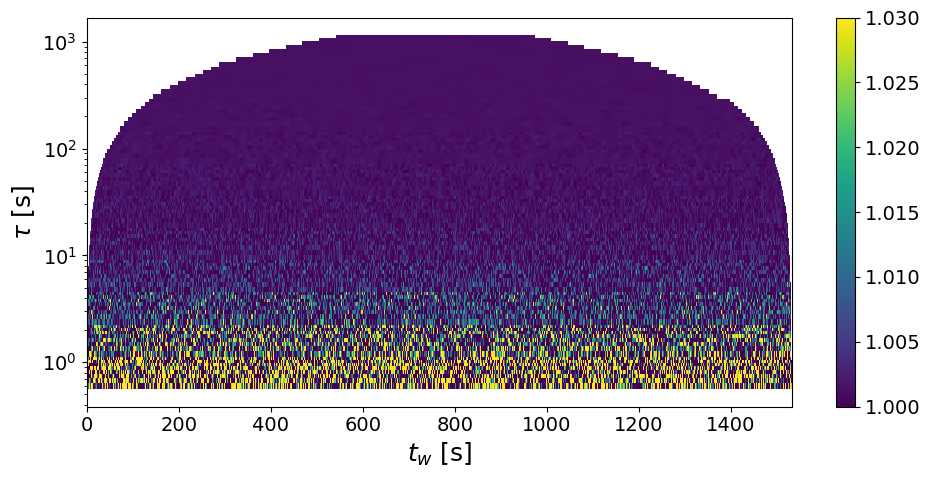

In [115]:
############################
vmin, vmax = 1.0, 1.03
lower_corr = 6
upper_corr = None
filter_layer = 0
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log', lower_corr=lower_corr, upper_corr=upper_corr, filter_layer=filter_layer, borders=False)

Using Global variables: model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.2,0.02,0.71375,0.028243,3.956999,0.676732,0.016492,2.43703,0.023756,0.000503,2.115829,1.001312,0.00001,0.001001,1.574943


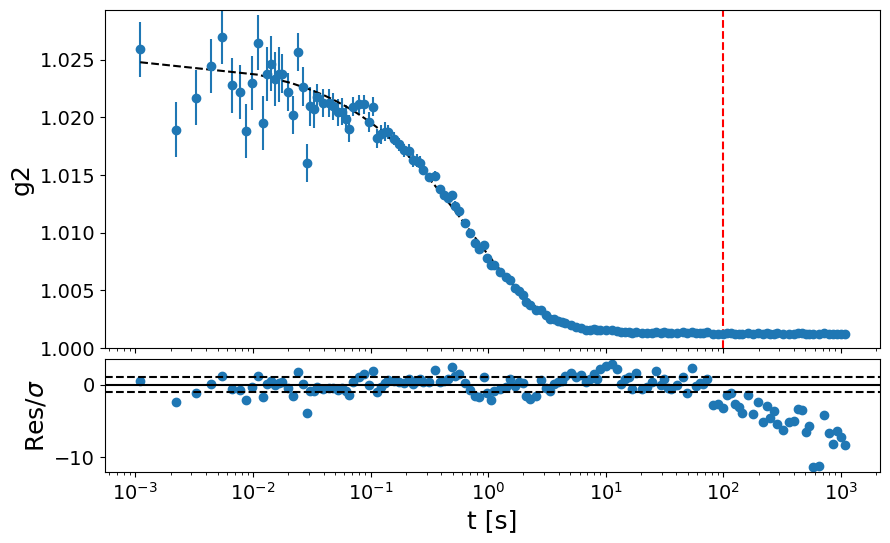

In [116]:
##################
t1_fit = 0
t2_fit = 1e2
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

fig, ax1, ax2 = MTplotfit_4damaged_vGeO2(itime, g2mt, t1_fit, t2_fit, save=True)

## XPCS mesh: T=690C, Q=0.19, 40min x 4 @ 1ms ON fp (GeO2_3, dataset 1, scan 4-5-6-7)

In [117]:
#######################################
sample_name = 'GeO2_3_695C'
Ndataset = 1
Nscan = range(4, 7+1)
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan[3])
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

#############################
command = mtimescan 0.001 1 2400384
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
T = 44.01 min
#############################



In [118]:
e4m_data = {}
for s in Nscan:
    e4m_data[s] = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, s, n_jobs=50, load_mask=load_mask)
    e4m_data[s] = COSMIC.fast_gamma_filter(e4m_data[s], Imaxth_high=4)

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00027.h5 (28/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00026.h5 (27/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00028.h5 (29/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00035.h5 (36/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00040.h5 (41/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/481 loops)
	 -> loading file eiger4m_v2_spa

### Flux check

################################################################################
Maximum count in the whole run -> 4.0
################################################################################



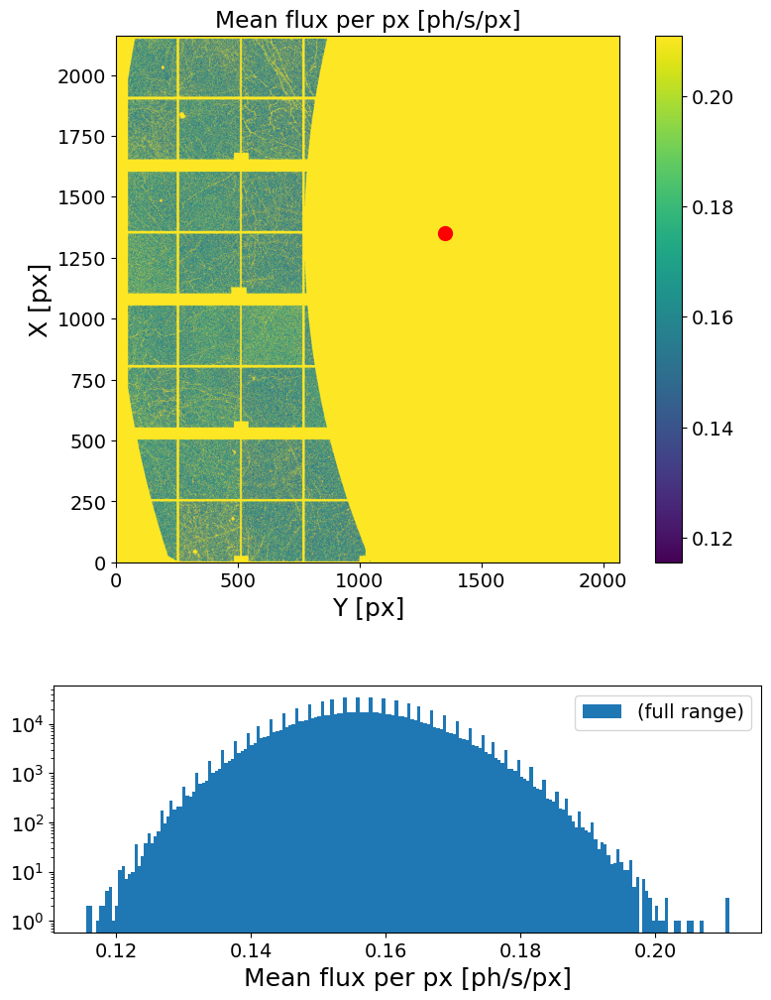

In [119]:
XPCS.gen_plots4mask(e4m_data[Nscan[0]], itime, Ith_low=None, Ith_high=None, Nff=None, load_mask=load_mask)

### Intensity analysis

<SecondaryAxis: >

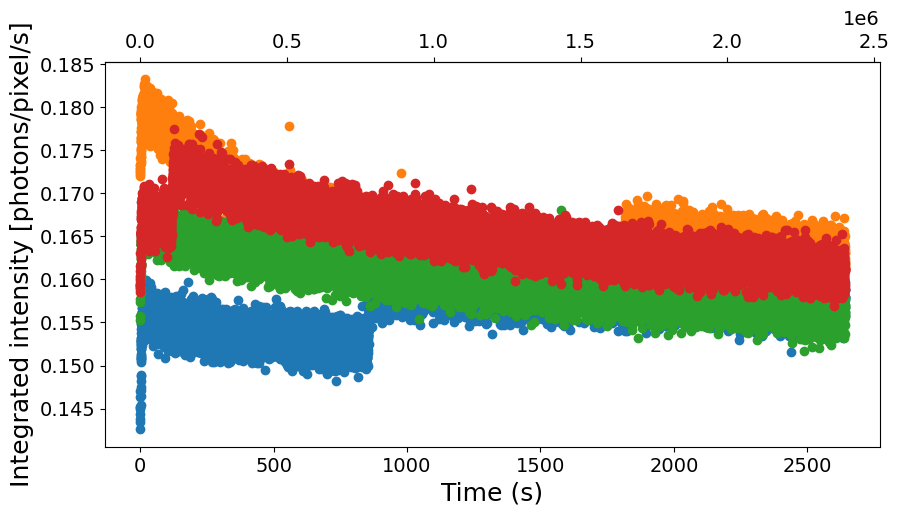

In [120]:
####################
Lbin = 100
Nstep = 100
Nfi = 25
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

plt.figure(figsize=(10,5))
for s in Nscan:
    It = np.vstack(XPCS.get_It(e4m_data[s], itime, mask=mask, Lbin=Lbin, Nstep=Nstep, Nfi=Nfi))
    np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(s).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", It)

    plt.scatter(It[0], It[1], label='It')

plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Multitau correlation of damaged-vGeO2

In [121]:
##### INPUTS #####
Nfi = int(1e6)
Nff = None
sparse_depth = 14
ch_depth = 4
mask = None
##################

for s in Nscan:
    print(f"Processing scan {s}...")
    if s==Nscan[0]:
        G2tmt = XPCS.get_G2tmt_4sparse(e4m_data[s], sparse_depth, ch_depth=ch_depth, mask=None, Nfi=Nfi, Nff=Nff)
    else:
        G2tmt2add = XPCS.get_G2tmt_4sparse(e4m_data[s], sparse_depth, ch_depth=ch_depth, mask=None, Nfi=Nfi, Nff=Nff)
        for corr in range(len(G2tmt)):
            for ch in range(len(G2tmt[corr])):
                G2tmt[corr][ch] += G2tmt2add[corr][ch]

for corr in range(len(G2tmt)):
    for ch in range(len(G2tmt[corr])):
        G2tmt[corr][ch] /= len(Nscan)

g2mt= np.vstack(XPCS.get_g2mt(itime, G2tmt))
np.savetxt(f"{g24damaged_vGeO2_folder}g2mt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan[0])}:{str(Nscan[-1])}-Q={Q_notebook}-dQ={dQ_notebook}.txt", g2mt)

Processing scan 4...
Nff set to 2392640 => (Nff-Nfi) = 85*2^sparse_depth, thrown frames = 7744 (0.55%)
Loading frames ...


Done! (elapsed time = 2.46 s)
	 | 1392640 frames X 1074960 pixels
	 | sparsity = 1.74e-04
	 | memory usage (sparse.csr_array @ float32) = 2.914 GB
Computing sparse multitau G2t...


100%|██████████| 85/85 [01:05<00:00,  1.30it/s]


Done! (elapsed time = 65.51 s)
Computing dense multitau G2t...
	-> computing channels on 680 frames ...
	-> computing channels on 340 frames ...
	-> computing channels on 170 frames ...
	-> computing channels on 85 frames ...
	-> computing channels on 42 frames ...
	-> computing channels on 21 frames ...
Done! (elapsed time = 19.54 s)
Processing scan 5...
Nff set to 2392640 => (Nff-Nfi) = 85*2^sparse_depth, thrown frames = 7744 (0.55%)
Loading frames ...
Done! (elapsed time = 2.55 s)
	 | 1392640 frames X 1074960 pixels
	 | sparsity = 1.79e-04
	 | memory usage (sparse.csr_array @ float32) = 3.005 GB
Computing sparse multitau G2t...


100%|██████████| 85/85 [01:04<00:00,  1.31it/s]


Done! (elapsed time = 64.93 s)
Computing dense multitau G2t...
	-> computing channels on 680 frames ...
	-> computing channels on 340 frames ...
	-> computing channels on 170 frames ...
	-> computing channels on 85 frames ...
	-> computing channels on 42 frames ...
	-> computing channels on 21 frames ...
Done! (elapsed time = 19.74 s)
Processing scan 6...
Nff set to 2392640 => (Nff-Nfi) = 85*2^sparse_depth, thrown frames = 7744 (0.55%)
Loading frames ...
Done! (elapsed time = 2.45 s)
	 | 1392640 frames X 1074960 pixels
	 | sparsity = 1.74e-04
	 | memory usage (sparse.csr_array @ float32) = 2.92 GB
Computing sparse multitau G2t...


100%|██████████| 85/85 [01:04<00:00,  1.31it/s]


Done! (elapsed time = 64.75 s)
Computing dense multitau G2t...
	-> computing channels on 680 frames ...
	-> computing channels on 340 frames ...
	-> computing channels on 170 frames ...
	-> computing channels on 85 frames ...
	-> computing channels on 42 frames ...
	-> computing channels on 21 frames ...
Done! (elapsed time = 19.19 s)
Processing scan 7...
Nff set to 2392640 => (Nff-Nfi) = 85*2^sparse_depth, thrown frames = 7744 (0.55%)
Loading frames ...
Done! (elapsed time = 2.61 s)
	 | 1392640 frames X 1074960 pixels
	 | sparsity = 1.79e-04
	 | memory usage (sparse.csr_array @ float32) = 3.01 GB
Computing sparse multitau G2t...


100%|██████████| 85/85 [01:06<00:00,  1.29it/s]


Done! (elapsed time = 66.1 s)
Computing dense multitau G2t...
	-> computing channels on 680 frames ...
	-> computing channels on 340 frames ...
	-> computing channels on 170 frames ...
	-> computing channels on 85 frames ...
	-> computing channels on 42 frames ...
	-> computing channels on 21 frames ...
Done! (elapsed time = 19.0 s)


(<Figure size 1000x500 with 2 Axes>,
 <Axes: xlabel='$t_w$ [s]', ylabel='$\\tau$ [s]'>)

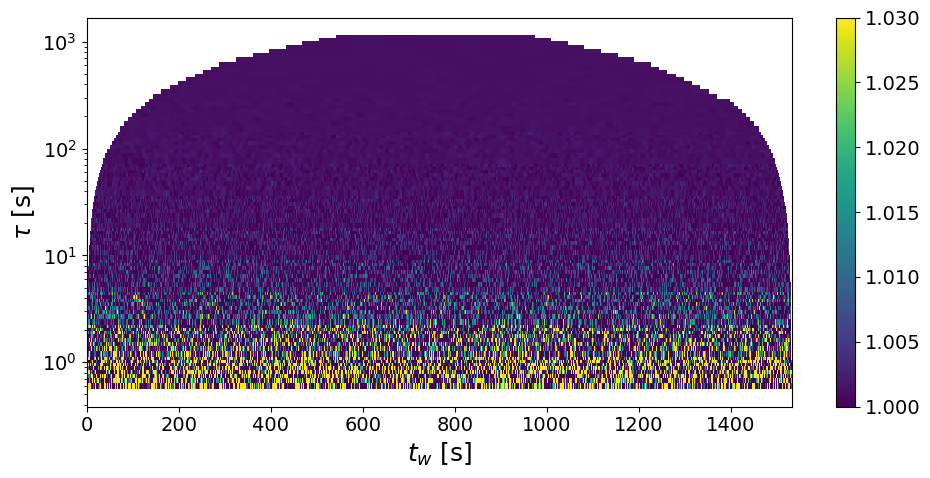

In [122]:
############################
vmin, vmax = 1.0, 1.03
lower_corr = 6
upper_corr = None
filter_layer = 0
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log', lower_corr=lower_corr, upper_corr=upper_corr, filter_layer=filter_layer, borders=False)

Using Global variables: model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.2,0.02,0.433316,0.021071,4.862746,0.688486,0.021035,3.055276,0.023348,0.000614,2.628089,1.001275,0.000009,0.000925,1.442455


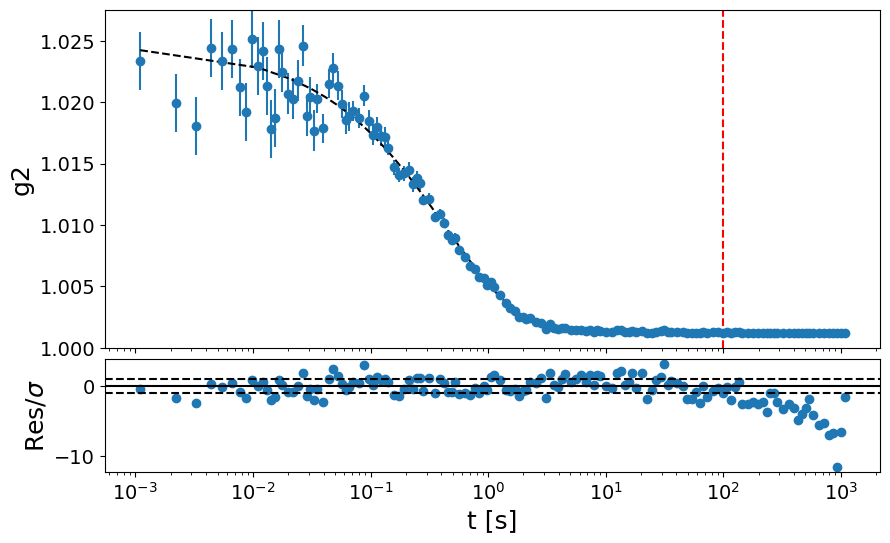

In [123]:
##################
t1_fit = 0
t2_fit = 1e2
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

fig, ax1, ax2 = MTplotfit_4damaged_vGeO2(itime, g2mt, t1_fit, t2_fit, save=True)

## XPCS mesh: T=730C, Q=0.19, 30min x 4 @ 1ms ON fp (GeO2_3, dataset 1, scan 4-5-6-7)

In [124]:
#######################################
sample_name = 'GeO2_3_730C'
Ndataset = 1
Nscan = range(4, 8+1)
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan[3])
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

#############################
command = mtimescan 0.001 1 1800288
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
T = 33.01 min
#############################



In [125]:
e4m_data = {}
for s in Nscan:
    e4m_data[s] = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, s, n_jobs=50, load_mask=load_mask)
    e4m_data[s] = COSMIC.fast_gamma_filter(e4m_data[s], Imaxth_high=4)

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00028.h5 (29/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00020.h5 (21/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00023.h5 (24/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00021.h5 (22/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00026.h5 (27/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00033.h5 (34/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/361 loops)
	 -> loading file eiger4m_v2_s

### Flux check

################################################################################
Maximum count in the whole run -> 4.0
################################################################################



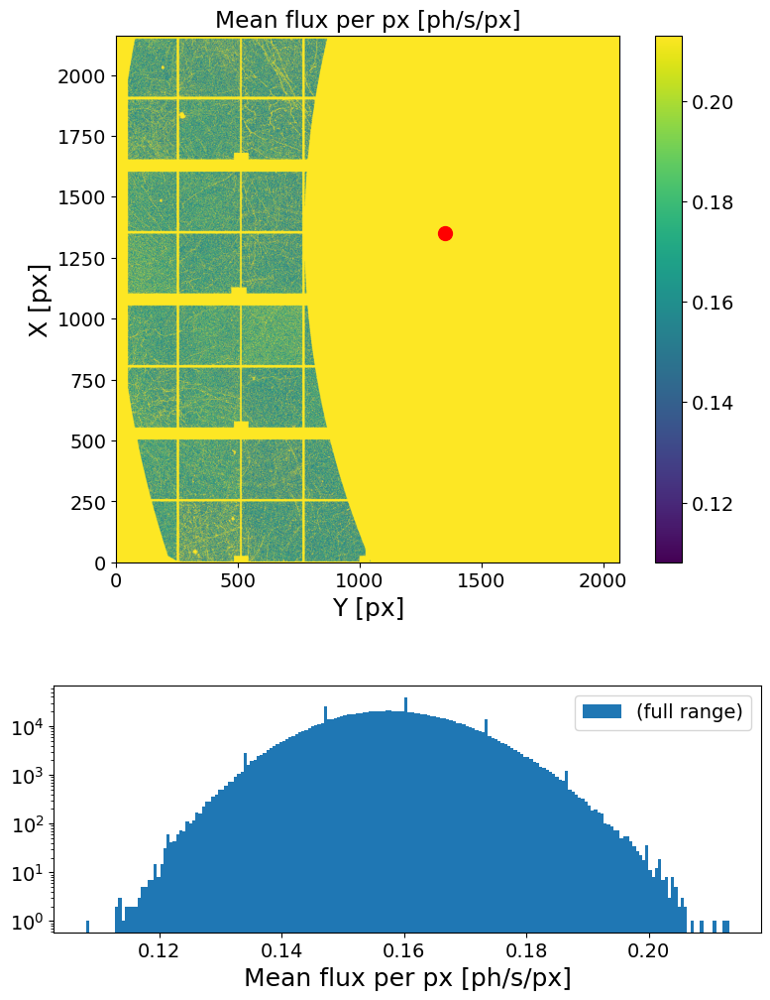

In [126]:
XPCS.gen_plots4mask(e4m_data[Nscan[0]], itime, Ith_low=None, Ith_high=None, Nff=None, load_mask=load_mask)

### Intensity analysis

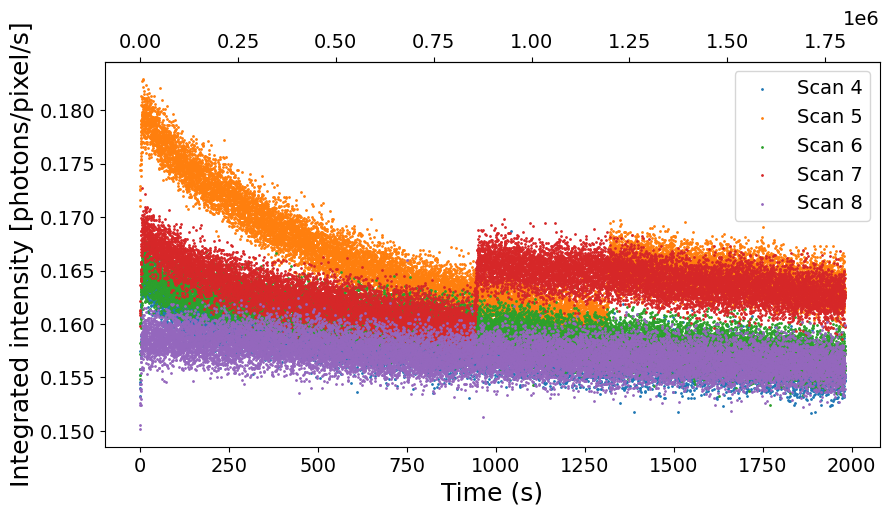

In [127]:
####################
Lbin = 100
Nstep = 100
Nfi = 25
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

plt.figure(figsize=(10,5))
for s in Nscan:
    It = np.vstack(XPCS.get_It(e4m_data[s], itime, mask=mask, Lbin=Lbin, Nstep=Nstep, Nfi=Nfi))
    np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(s).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", It)

    plt.scatter(It[0], It[1], s=1, label=f'Scan {s}')

plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))
plt.legend()

### Multitau correlation of damaged-vGeO2

In [128]:
##### INPUTS #####
Nfi = int(.7e6)
Nff = None
sparse_depth = 14
ch_depth = 4
mask = None
##################

for s in Nscan:
    print(f"Processing scan {s}...")
    if s==Nscan[0]:
        G2tmt = XPCS.get_G2tmt_4sparse(e4m_data[s], sparse_depth, ch_depth=ch_depth, mask=None, Nfi=Nfi, Nff=Nff)
    else:
        G2tmt2add = XPCS.get_G2tmt_4sparse(e4m_data[s], sparse_depth, ch_depth=ch_depth, mask=None, Nfi=Nfi, Nff=Nff)
        for corr in range(len(G2tmt)):
            for ch in range(len(G2tmt[corr])):
                G2tmt[corr][ch] += G2tmt2add[corr][ch]

for corr in range(len(G2tmt)):
    for ch in range(len(G2tmt[corr])):
        G2tmt[corr][ch] /= len(Nscan)

g2mt= np.vstack(XPCS.get_g2mt(itime, G2tmt))
np.savetxt(f"{g24damaged_vGeO2_folder}g2mt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan[0])}:{str(Nscan[-1])}-Q={Q_notebook}-dQ={dQ_notebook}.txt", g2mt)

Processing scan 4...
Nff set to 1797728 => (Nff-Nfi) = 67*2^sparse_depth, thrown frames = 2560 (0.23%)
Loading frames ...


Done! (elapsed time = 2.11 s)
	 | 1097728 frames X 1074960 pixels
	 | sparsity = 1.72e-04
	 | memory usage (sparse.csr_array @ float32) = 2.283 GB
Computing sparse multitau G2t...


100%|██████████| 67/67 [00:51<00:00,  1.29it/s]


Done! (elapsed time = 51.99 s)
Computing dense multitau G2t...
	-> computing channels on 536 frames ...
	-> computing channels on 268 frames ...
	-> computing channels on 134 frames ...
	-> computing channels on 67 frames ...
	-> computing channels on 33 frames ...
Done! (elapsed time = 15.15 s)
Processing scan 5...
Nff set to 1797728 => (Nff-Nfi) = 67*2^sparse_depth, thrown frames = 2560 (0.23%)
Loading frames ...
Done! (elapsed time = 2.04 s)
	 | 1097728 frames X 1074960 pixels
	 | sparsity = 1.80e-04
	 | memory usage (sparse.csr_array @ float32) = 2.38 GB
Computing sparse multitau G2t...


100%|██████████| 67/67 [00:50<00:00,  1.31it/s]


Done! (elapsed time = 51.03 s)
Computing dense multitau G2t...
	-> computing channels on 536 frames ...
	-> computing channels on 268 frames ...
	-> computing channels on 134 frames ...
	-> computing channels on 67 frames ...
	-> computing channels on 33 frames ...
Done! (elapsed time = 14.61 s)
Processing scan 6...
Nff set to 1797728 => (Nff-Nfi) = 67*2^sparse_depth, thrown frames = 2560 (0.23%)
Loading frames ...
Done! (elapsed time = 2.01 s)
	 | 1097728 frames X 1074960 pixels
	 | sparsity = 1.74e-04
	 | memory usage (sparse.csr_array @ float32) = 2.305 GB
Computing sparse multitau G2t...


100%|██████████| 67/67 [00:51<00:00,  1.31it/s]


Done! (elapsed time = 51.25 s)
Computing dense multitau G2t...
	-> computing channels on 536 frames ...
	-> computing channels on 268 frames ...
	-> computing channels on 134 frames ...
	-> computing channels on 67 frames ...
	-> computing channels on 33 frames ...
Done! (elapsed time = 15.87 s)
Processing scan 7...
Nff set to 1797728 => (Nff-Nfi) = 67*2^sparse_depth, thrown frames = 2560 (0.23%)
Loading frames ...
Done! (elapsed time = 2.03 s)
	 | 1097728 frames X 1074960 pixels
	 | sparsity = 1.80e-04
	 | memory usage (sparse.csr_array @ float32) = 2.381 GB
Computing sparse multitau G2t...


100%|██████████| 67/67 [00:51<00:00,  1.30it/s]


Done! (elapsed time = 51.57 s)
Computing dense multitau G2t...
	-> computing channels on 536 frames ...
	-> computing channels on 268 frames ...
	-> computing channels on 134 frames ...
	-> computing channels on 67 frames ...
	-> computing channels on 33 frames ...
Done! (elapsed time = 14.17 s)
Processing scan 8...
Nff set to 1797728 => (Nff-Nfi) = 67*2^sparse_depth, thrown frames = 2560 (0.23%)
Loading frames ...
Done! (elapsed time = 2.0 s)
	 | 1097728 frames X 1074960 pixels
	 | sparsity = 1.72e-04
	 | memory usage (sparse.csr_array @ float32) = 2.281 GB
Computing sparse multitau G2t...


100%|██████████| 67/67 [00:49<00:00,  1.34it/s]


Done! (elapsed time = 49.9 s)
Computing dense multitau G2t...
	-> computing channels on 536 frames ...
	-> computing channels on 268 frames ...
	-> computing channels on 134 frames ...
	-> computing channels on 67 frames ...
	-> computing channels on 33 frames ...
Done! (elapsed time = 15.18 s)


(<Figure size 1000x500 with 2 Axes>,
 <Axes: xlabel='$t_w$ [s]', ylabel='$\\tau$ [s]'>)

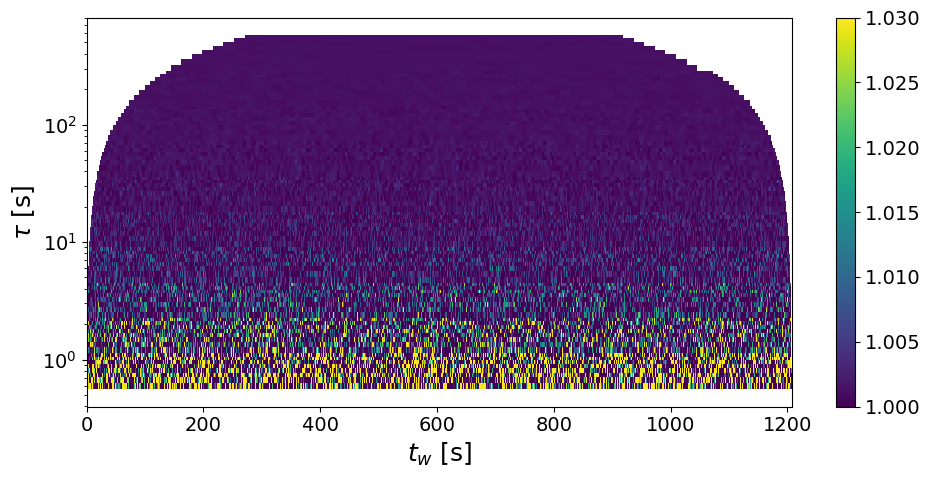

In [129]:
############################
vmin, vmax = 1.0, 1.03
lower_corr = 6
upper_corr = None
filter_layer = 0
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log', lower_corr=lower_corr, upper_corr=upper_corr, filter_layer=filter_layer, borders=False)

Using Global variables: model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.2,0.02,0.290647,0.013186,4.536869,0.756549,0.024822,3.280962,0.022006,0.000576,2.616074,1.001287,0.000007,0.000746,0.942766


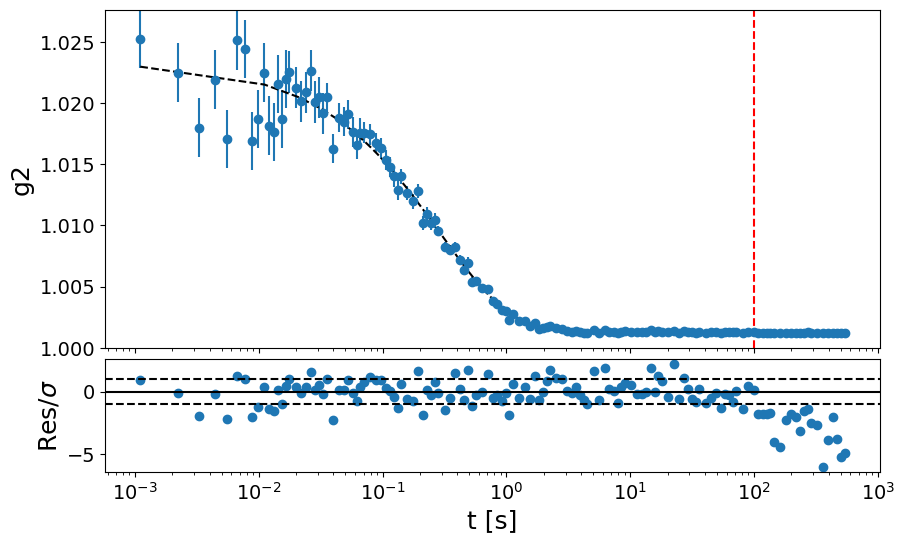

In [130]:
##################
t1_fit = 0
t2_fit = 1e2
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

fig, ax1, ax2 = MTplotfit_4damaged_vGeO2(itime, g2mt, t1_fit, t2_fit, save=True)

## XPCS mesh: T=730C, Q=0.19, 40min x 4 @ 1ms ON fp (GeO2_3_att2, dataset 1, scan 4-5-6-7)

In [131]:
#######################################
sample_name = 'GeO2_3_730C_att2'
Ndataset = 1
Nscan = range(4, 7+1)
load_mask = e4m_mask * e4m_htmask * bs_mask * Qmask # Put None for profile analysis!
#######################################

scan = ID10.load_scan(RAW_folder, sample_name, Ndataset, Nscan[-1])
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('T = {:.2f} min'.format(len(scan['fast_timer_period'])*itime/60))   
print('#############################\n')

#############################
command = mtimescan 0.001 1 1800288
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
T = 33.01 min
#############################



In [132]:
e4m_data = {}
for s in Nscan:
    e4m_data[s] = ID10.load_sparse_e4m(RAW_folder, sample_name, Ndataset, s, n_jobs=50, load_mask=load_mask)
    e4m_data[s] = COSMIC.fast_gamma_filter(e4m_data[s], Imaxth_high=4)

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00017.h5 (18/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00025.h5 (26/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00028.h5 (29/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00039.h5 (40/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00034.h5 (35/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/361 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00026.h5 (27/361 loops)
	 -> loading file eiger4m_v2_s

### Flux check

################################################################################
Maximum count in the whole run -> 4.0
################################################################################



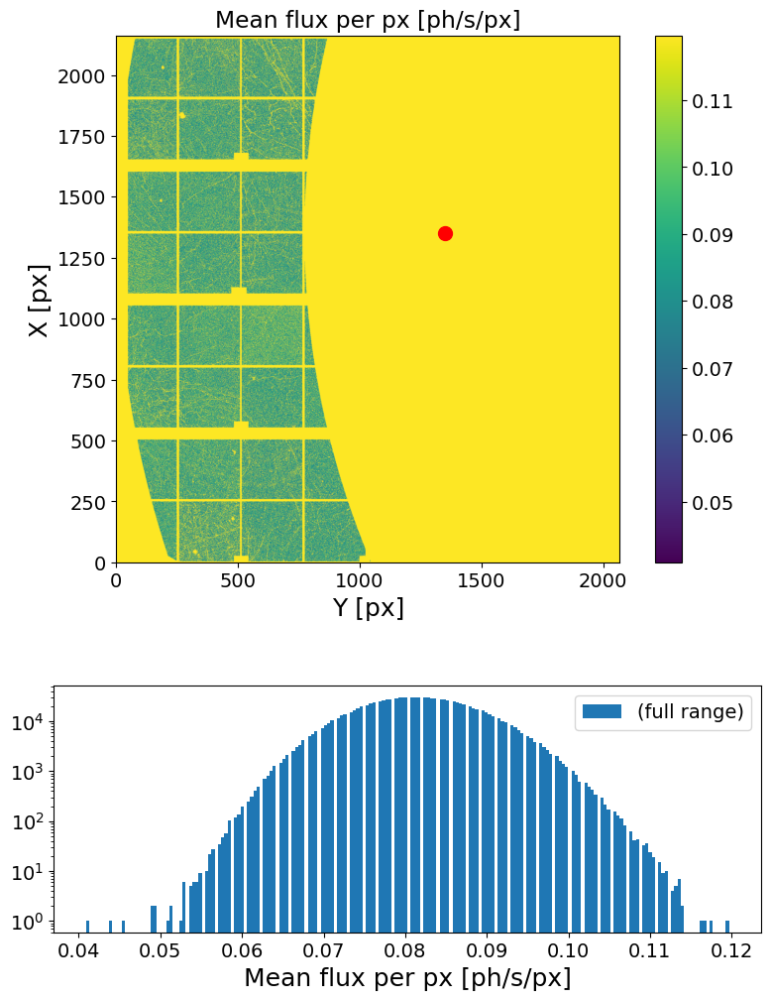

In [133]:
XPCS.gen_plots4mask(e4m_data[Nscan[0]], itime, Ith_low=None, Ith_high=None, Nff=None, load_mask=load_mask)

### Intensity analysis

<SecondaryAxis: >

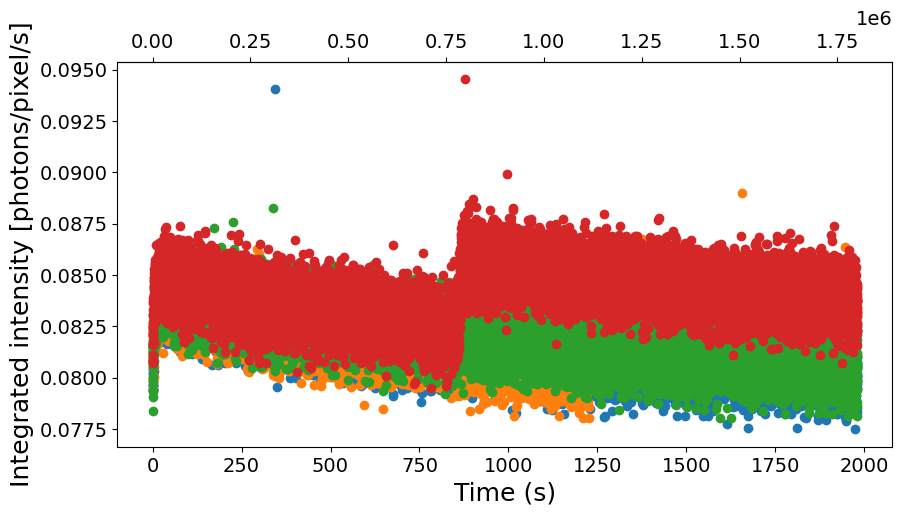

In [134]:
####################
Lbin = 100
Nstep = 100
Nfi = 25
mask = None #e4m_mask*e4m_htmask*bs_mask*Qmask
####################

plt.figure(figsize=(10,5))
for s in Nscan:
    It = np.vstack(XPCS.get_It(e4m_data[s], itime, mask=mask, Lbin=Lbin, Nstep=Nstep, Nfi=Nfi))
    np.savetxt(f"{Intensity_folder}Idt-{sample_name}_{str(Ndataset).zfill(4)}_{str(s).zfill(4)}-Q={Q_notebook}-dQ={dQ_notebook}.txt", It)

    plt.scatter(It[0], It[1], label='It')

plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))

### Multitau correlation of damaged-vGeO2

In [135]:
##### INPUTS #####
Nfi = int(.3e6)
Nff = None
sparse_depth = 14
ch_depth = 4
mask = None
##################

for s in Nscan:
    print(f"Processing scan {s}...")
    if s==Nscan[0]:
        G2tmt = XPCS.get_G2tmt_4sparse(e4m_data[s], sparse_depth, ch_depth=ch_depth, mask=None, Nfi=Nfi, Nff=Nff)
    else:
        G2tmt2add = XPCS.get_G2tmt_4sparse(e4m_data[s], sparse_depth, ch_depth=ch_depth, mask=None, Nfi=Nfi, Nff=Nff)
        for corr in range(len(G2tmt)):
            for ch in range(len(G2tmt[corr])):
                G2tmt[corr][ch] += G2tmt2add[corr][ch]

for corr in range(len(G2tmt)):
    for ch in range(len(G2tmt[corr])):
        G2tmt[corr][ch] /= len(Nscan)

g2mt= np.vstack(XPCS.get_g2mt(itime, G2tmt))
np.savetxt(f"{g24damaged_vGeO2_folder}g2mt-{sample_name}_{str(Ndataset).zfill(4)}_{str(Nscan[0])}:{str(Nscan[-1])}-Q={Q_notebook}-dQ={dQ_notebook}.txt", g2mt)

Processing scan 4...
Nff set to 1790944 => (Nff-Nfi) = 91*2^sparse_depth, thrown frames = 9344 (0.62%)
Loading frames ...


Done! (elapsed time = 1.41 s)
	 | 1490944 frames X 1074960 pixels
	 | sparsity = 8.94e-05
	 | memory usage (sparse.csr_array @ float32) = 1.612 GB
Computing sparse multitau G2t...


100%|██████████| 91/91 [01:20<00:00,  1.13it/s]


Done! (elapsed time = 80.33 s)
Computing dense multitau G2t...
	-> computing channels on 728 frames ...
	-> computing channels on 364 frames ...
	-> computing channels on 182 frames ...
	-> computing channels on 91 frames ...
	-> computing channels on 45 frames ...
	-> computing channels on 22 frames ...
Done! (elapsed time = 22.49 s)
Processing scan 5...
Nff set to 1790944 => (Nff-Nfi) = 91*2^sparse_depth, thrown frames = 9344 (0.62%)
Loading frames ...
Done! (elapsed time = 1.33 s)
	 | 1490944 frames X 1074960 pixels
	 | sparsity = 9.07e-05
	 | memory usage (sparse.csr_array @ float32) = 1.635 GB
Computing sparse multitau G2t...


100%|██████████| 91/91 [01:22<00:00,  1.10it/s]


Done! (elapsed time = 82.41 s)
Computing dense multitau G2t...
	-> computing channels on 728 frames ...
	-> computing channels on 364 frames ...
	-> computing channels on 182 frames ...
	-> computing channels on 91 frames ...
	-> computing channels on 45 frames ...
	-> computing channels on 22 frames ...
Done! (elapsed time = 22.43 s)
Processing scan 6...
Nff set to 1790944 => (Nff-Nfi) = 91*2^sparse_depth, thrown frames = 9344 (0.62%)
Loading frames ...
Done! (elapsed time = 1.29 s)
	 | 1490944 frames X 1074960 pixels
	 | sparsity = 8.99e-05
	 | memory usage (sparse.csr_array @ float32) = 1.621 GB
Computing sparse multitau G2t...


100%|██████████| 91/91 [01:23<00:00,  1.09it/s]


Done! (elapsed time = 83.86 s)
Computing dense multitau G2t...
	-> computing channels on 728 frames ...
	-> computing channels on 364 frames ...
	-> computing channels on 182 frames ...
	-> computing channels on 91 frames ...
	-> computing channels on 45 frames ...
	-> computing channels on 22 frames ...
Done! (elapsed time = 21.56 s)
Processing scan 7...
Nff set to 1790944 => (Nff-Nfi) = 91*2^sparse_depth, thrown frames = 9344 (0.62%)
Loading frames ...
Done! (elapsed time = 1.37 s)
	 | 1490944 frames X 1074960 pixels
	 | sparsity = 9.25e-05
	 | memory usage (sparse.csr_array @ float32) = 1.668 GB
Computing sparse multitau G2t...


100%|██████████| 91/91 [01:28<00:00,  1.03it/s]


Done! (elapsed time = 88.23 s)
Computing dense multitau G2t...
	-> computing channels on 728 frames ...
	-> computing channels on 364 frames ...
	-> computing channels on 182 frames ...
	-> computing channels on 91 frames ...
	-> computing channels on 45 frames ...
	-> computing channels on 22 frames ...
Done! (elapsed time = 21.12 s)


(<Figure size 1000x500 with 2 Axes>,
 <Axes: xlabel='$t_w$ [s]', ylabel='$\\tau$ [s]'>)

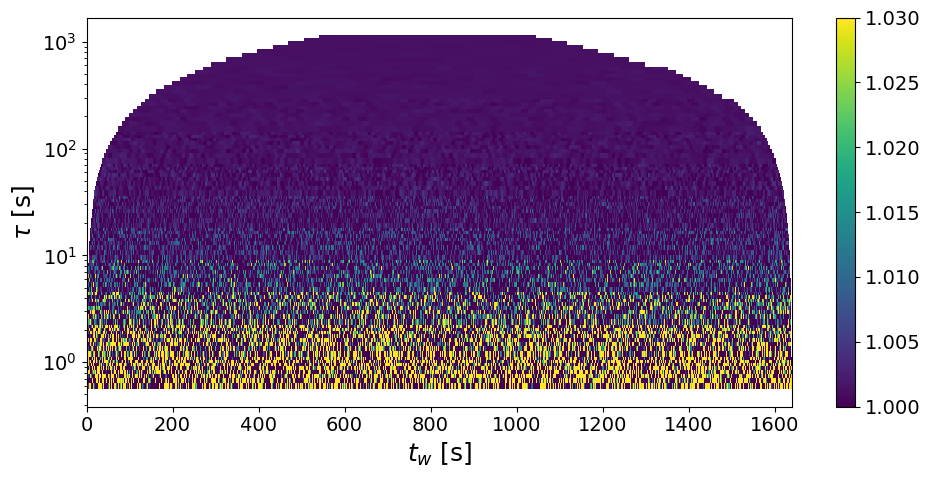

In [136]:
############################
vmin, vmax = 1.0, 1.03
lower_corr = 6
upper_corr = None
filter_layer = 0
############################

XPCS.plot_G2tmt(G2tmt, itime, vmin, vmax, yscale='log', lower_corr=lower_corr, upper_corr=upper_corr, filter_layer=filter_layer, borders=False)

Using Global variables: model, params, Q_notebook, dQ_notebook, sample_name, Ndataset, Nscan


,Q,dQ,tau,dtau,dtau%,beta,dbeta,dbeta%,c,dc,dc%,y0,dy0,dy%,redchi2
0,0.2,0.02,0.555143,0.03792,6.830663,0.655058,0.026149,3.991867,0.024241,0.000866,3.57149,1.001351,0.000015,0.001451,0.960632


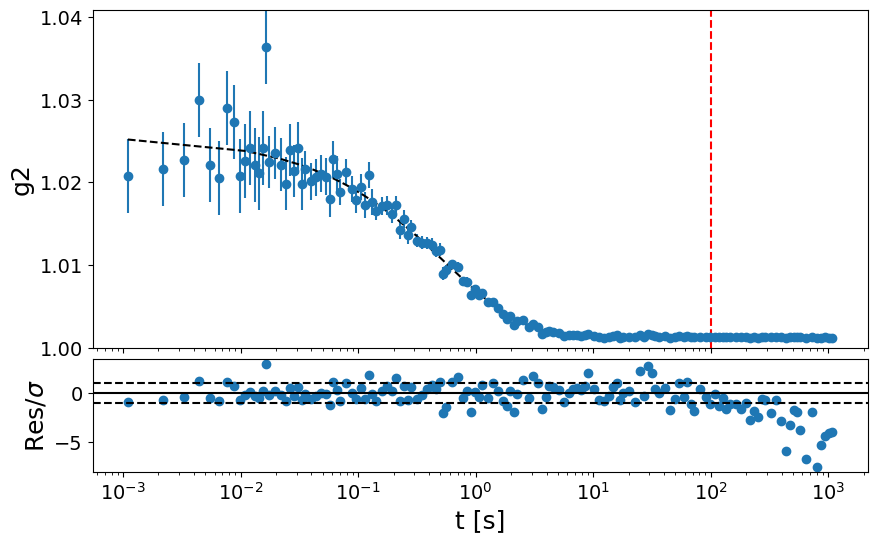

In [137]:
##################
t1_fit = 0
t2_fit = 1e2
##################

################# KKW MODEL #################
model = lm.Model(decorrelation_f)
params = lm.Parameters()
params.add('tau', value=1, min=0, max=10)
params.add('beta', value=1, min=0, max=2)
params.add('c', value=.03, min=0, max=.1)
params.add('y0', value=1, min=1, max=1.01)
#params.add('y0', value=1.015, vary=False)
##############################################

fig, ax1, ax2 = MTplotfit_4damaged_vGeO2(itime, g2mt, t1_fit, t2_fit, save=True)